In [74]:
import xarray as xr,pandas as pd, numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import os, glob,  matplotlib #cmocean,
import seaborn as sns
from scipy import stats
import rasterio
# gdal
#from osgeo import gdal
#import geopandas as gpd
#import arcpy
import ee,geemap
# authenticate to the Earth Engine API
#ee.Authenticate()
#ee.Initialize()

In [42]:
path = r"D:\my works\bloom\data\variables rast"
# get all .tif files in the folder
raster_files = glob.glob(os.path.join(path, "*.tif"))

# Open the raster files and append them to a list
rasters = []
for raster_file in raster_files:
    raster = rasterio.open(raster_file)
    rasters.append(raster)

# Get the metadata from the first raster file
meta = rasters[0].meta

# Update the metadata to reflect the number of layers
meta.update(count = len(rasters))

path = r"D:\my works\bloom\data"
name = "multiband.tif"
output_file = os.path.join(path, name)  # Join the path and name

# Write the layers to a new file
with rasterio.open(output_file, 'w', **meta) as dst:
    for id, layer in enumerate(rasters, start=1):
        dst.write_band(id, layer.read(1))

In [78]:
raster_files
# collect name as columnsnames
columns = [os.path.basename(file).split(".")[0] for file in raster_files]
columns

['bottomT_NGOM',
 'chl_NGOM',
 'dissic_NGOM',
 'mlotst_NGOM',
 'no3_NGOM',
 'nppv_NGOM',
 'ph_NGOM',
 'po4_NGOM',
 'si_NGOM',
 'so_NGOM',
 'spco2_NGOM',
 'talk_NGOM',
 'thetao_NGOM',
 'uo_NGOM',
 'vo_NGOM']

In [ ]:
download_folder=r"D:\my works\bloom\data\npp"
import requests
from bs4 import BeautifulSoup

base_url = 'https://coastwatch.pfeg.noaa.gov/erddap/files/erdMH1ppmday/'

# Send a GET request to the webpage
response = requests.get(base_url)

# Check if the request was successful
if response.status_code == 200:
    # Parse the HTML content
    soup = BeautifulSoup(response.content, 'html.parser')
    # Find all anchor tags
    anchor_tags = soup.find_all('a')
    # Extract URLs with the ".nc" extension
    nc_urls = [base_url + tag.get('href') for tag in anchor_tags if tag.get('href').endswith('.nc')]
    # Print the URLs
    for nc_url in nc_urls:
        print(nc_url)
else:
    print("Failed to retrieve data from the website")

In [ ]:
# Ensure the download folder exists
if not os.path.exists(download_folder):
    os.makedirs(download_folder)
# Send a GET request to each URL and download the file
for url in nc_urls[167:]:
    # Extract the file name from the URL
    file_name = url.split('/')[-1]
    # Define the file path to save
    file_path = os.path.join(download_folder, file_name)
    # Send a GET request to download the file
    response = requests.get(url)
    # Check if the request was successful
    if response.status_code == 200:
        # Write the file content to the specified path
        with open(file_path, 'wb') as f:
            f.write(response.content)
        print(f"File '{file_name}' downloaded successfully.")
    else:
        print(f"Failed to download file '{file_name}'.")

In [ ]:
import xarray as xr
import os
import glob
# Path to the directory containing .nc files
path = r"D:\my works\bloom\data\npp"
# Find all .nc files
files = glob.glob(os.path.join(path, "*.nc"))
# Directory to save cropped files
tosaved = r"D:\my works\bloom\data\nppcropped"
# Define latitude and longitude range for cropping
lat_range = slice(34,21)  # Latitude range from 21 to 33
lon_range = slice(-99, -80)  # Longitude range from -99 to -80
# Iterate over each .nc file
for file in files:
    try:
        # Open the dataset
        ds = xr.open_dataset(file)
        # Crop the dataset based on latitude and longitude
        cropped_ds = ds.sel(latitude=lat_range, longitude=lon_range)
        # Extract file name
        filename = os.path.basename(file)
        # Save the cropped dataset to a new .nc file
        cropped_ds.to_netcdf(os.path.join(tosaved, filename))
        # Close the dataset
        ds.close()
        print(f"Successfully cropped and saved: {filename}")
    except Exception as e:
        print(f"Error processing file {file}: {e}")

In [ ]:
folders=r'D:\my works\bloom\data\variables rast'
rasters = glob.glob(os.path.join(folders, '*.tif'))
# name of rasters
names=[o.split('\\')[-1].split('.')[0] for o in rasters]
# split by _ and get the last part
# split by _ and get the last part
names=[o.split('_')[0] for o in names]
# number of rasters
num=len(rasters)
# make subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))
# reduce space between subplots
plt.subplots_adjust(wspace=0.1, hspace=0.001)
# flatten axes
axes = axes.flatten()
# different colormap with same number of num of rasters
import matplotlib.cm as cm
# List of colormaps
#cmaps =# List of 16 colormaps
cmaps = ['viridis', 'plasma', 'inferno', 'magma', 'cividis', 'twilight', 'twilight_shifted', 'hsv', 'twilight_r', 'twilight_shifted_r', 'hsv_r', 'seismic', 'coolwarm', 'coolwarm_r', 'bwr', 'bwr_r']
# loop through rasters and axes
for i, (raster, ax) in enumerate(zip(rasters, axes)):
    # read raster
    ds = arcpy.RasterToNumPyArray(raster, nodata_to_value=np.nan)
    # handle NaN values
    ds = np.ma.masked_invalid(ds)
    # plot
    ax.imshow(ds, cmap=cmaps[i], norm=LogNorm(vmin=ds.min(), vmax=ds.max())) 
    # set title
    ax.set_title(names[i])
    # remove axi
    ax.axis('off')
    # remove white space
    plt.tight_layout()
# reduce white space between subplots
plt.tight_layout()
# save figure
plt.savefig(r'D:\my works\bloom\figure\variables.jpg', dpi=400, bbox_inches='tight')

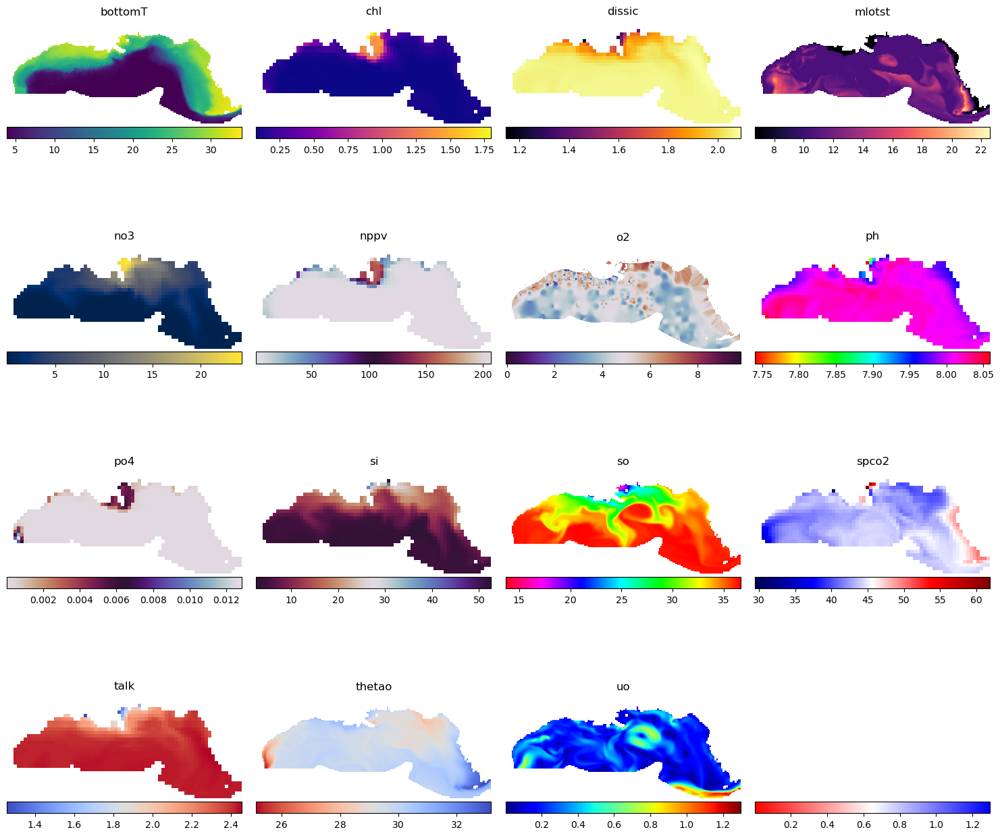

In [87]:
folders=r'D:\my works\bloom\data\variables rast'
rasters = glob.glob(os.path.join(folders, '*.tif'))
# name of rasters
names=[o.split('\\')[-1].split('.')[0] for o in rasters]
# split by _ and get the last part
# split by _ and get the last part
names=[o.split('_')[0] for o in names]
# number of rasters
num=len(rasters)
# make subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))
# reduce space between subplots
plt.subplots_adjust(wspace=0.1, hspace=0.001)
# flatten axes
axes = axes.flatten()
# different colormap with same number of num of rasters
import matplotlib.cm as cm
# List of colormaps
#cmaps =# List of 16 colormaps
cmaps = ['viridis', 'plasma', 'inferno', 'magma', 'cividis', 'twilight', 'twilight_shifted', 'hsv', 'twilight_r', 'twilight_shifted_r', 'hsv_r', 'seismic', 'coolwarm', 'coolwarm_r', 'jet', 'bwr_r']
# loop through rasters and axes
for i, (raster, ax) in enumerate(zip(rasters, axes)):
    # read raster
    ds = arcpy.RasterToNumPyArray(raster, nodata_to_value=np.nan)
    if names[i]=='o2':
        im=ax.imshow(ds, cmap=cmaps[i])
        # set title
        ax.set_title(names[i])
        # remove axi
        ax.axis('off')
        #colorbar
        plt.colorbar(im, ax=ax,orientation='horizontal',pad=0.01)
    elif names[i]=='vo' or names[i]=='uo':
        uo=arcpy.RasterToNumPyArray(r'D:\my works\bloom\data\variables rast\uo_NGOM.tif', nodata_to_value=np.nan)
        vo=arcpy.RasterToNumPyArray(r'D:\my works\bloom\data\variables rast\vo_NGOM.tif', nodata_to_value=np.nan)
        # calculate speed
        speed=np.sqrt(uo**2+vo**2)
        # plot
        im=ax.imshow(speed, cmap=cmaps[i])
        # set title
        ax.set_title(names[i])
        # remove axi
        ax.axis('off')
        #colorbar
        plt.colorbar(im, ax=ax,orientation='horizontal',pad=0.01)
    elif names[i]=='thetao'or names[i]=='talk':
        # read raster
        ds = arcpy.RasterToNumPyArray(raster, nodata_to_value=np.nan)
        # handle NaN values
        ds = np.ma.masked_invalid(ds)
        # plot
        im=ax.imshow(ds, cmap=cmaps[i]) 
        # set title
        ax.set_title(names[i])
        # remove axi
        ax.axis('off')
        #colorbar with same ticks and labels
        cdbar=plt.colorbar(im, ax=ax,orientation='horizontal',pad=0.01)
        for t in cdbar.ax.get_yticklabels():
            t.set_fontsize(2)
            # reduce font size of ticks
    else:
        # handle NaN values
        ds = np.ma.masked_invalid(ds)
        # plot
        im=ax.imshow(ds, cmap=cmaps[i]) 
        # set title
        ax.set_title(names[i])
        # remove axi
        ax.axis('off')
        #colorbar
        plt.colorbar(im, ax=ax,orientation='horizontal',pad=0.01)
        # remove white space
        plt.tight_layout()
# delete last figure
plt.delaxes(axes[-1])  
# reduce white space between subplots
plt.tight_layout()
# save figure
plt.savefig(r'D:\my works\bloom\figure\variables1.jpg', dpi=400, bbox_inches='tight')

In [ ]:
# load uo and vo
uo=arcpy.RasterToNumPyArray(r'D:\my works\bloom\data\variables rast\uo_NGOM.tif', nodata_to_value=np.nan)
vo=arcpy.RasterToNumPyArray(r'D:\my works\bloom\data\variables rast\vo_NGOM.tif', nodata_to_value=np.nan)
# calculate speed
speed=np.sqrt(uo**2+vo**2)
# plot
im=plt.imshow(speed, cmap='jet')
plt.axis('off')
plt.colorbar(im, orientation='horizontal', pad=0.01) # label='Speed (m/s)'
# reduce  space between plot and colorbar
plt.tight_layout()


In [ ]:
rasters = glob.glob(os.path.join(folders, '*.tif'))
# make as function
def plot_raster(raster, cmap, label):
    ds=arcpy.RasterToNumPyArray(raster, nodata_to_value=np.nan)
    im=plt.imshow(ds, cmap=cmap)
    plt.axis('off')
    plt.colorbar(im, orientation='horizontal', label=label, pad=0.01)
    plt.tight_layout()
print(rasters[0])
# plot
plot_raster(raster[0],cmaps[0], 'U (m/s)')

In [ ]:
folders=r'D:\my works\bloom\data\Predicted rast'
rasters = glob.glob(os.path.join(folders, '*.tif'))
# name of rasters
names=[o.split('\\')[-1].split('.')[0] for o in rasters]
# split by _ and get the last part
names=[o.split('_')[-1] for o in names]
# read first raster
ds = arcpy.Raster(rasters[2])
# convert to numpy array
arr = arcpy.RasterToNumPyArray(ds,nodata_to_value=np.nan)
# do legend value  less 2 will be red and greater 2.1 will be gray, red in legend will Hyperoxic and gray will be Nonhypoxic
arr[arr<2.1]=0
arr[arr>2.1]=1
# Define colors and labels for the legend

colors = ['red', 'gray']
labels = ['Hyperoxic', 'Nonhypoxic']

# Create a custom colormap with the specified colors
cmap = matplotlib.colors.ListedColormap(colors)

# Create the plot with the custom colormap
plt.imshow(arr, cmap=cmap)

# Add the legend with the specified labels
plt.legend(handles=[plt.Rectangle((0, 0), 1, 1, color=c) for c in colors], labels=labels)

# Remove x and y ticks
plt.xticks([])
plt.yticks([])
# no plot frame
plt.box(False)
# Show the plot
plt.show()
# make subplot 4*3
fig, axs = plt.subplots(4, 3, figsize=(15, 15),frameon=False)
# loop over rasters
for i, ax in enumerate(axs.flatten()):
    # read raster
    ds = arcpy.Raster(rasters[i])
    # convert to numpy array
    arr = arcpy.RasterToNumPyArray(ds,nodata_to_value=np.nan)
    # do legend value  less 2 will be red and greater 2.1 will be gray, red in legend will Hyperoxic and gray will be Nonhypoxic
    arr[arr<2.1]=0
    arr[arr>2.1]=1
    # if arr's all values are greater than 2.1 then make plot with only one color which gray
    if np.all(arr==1):
        arr=np.zeros_like(arr)

    # Define colors and labels for the legend
    colors = ['red', 'gray']
    labels = ['Hypoxic', 'Nonhypoxic']
    # Create a custom colormap with the specified colors
    cmap = matplotlib.colors.ListedColormap(colors)
    # Create the plot with the custom colormap
    ax.imshow(arr, cmap=cmap)
    # Add the legend with the specified labels
    ax.legend(handles=[plt.Rectangle((0, 0), 1, 1, color=c) for c in colors], labels=labels)
    # Remove x and y ticks
    ax.set_xticks([])
    ax.set_yticks([])
    # no plot frame
    #ax.box(False)
    # reduce space between subplots
    fig.tight_layout()
    # add title
    ax.set_title(names[i])
# save fig
plt.savefig(r'D:\my works\bloom\figure\legend1.png',dpi=600,bbox_inches='tight')


In [54]:
# read first raster
ds = arcpy.Raster(rasters[2])
# convert to numpy array
arr = arcpy.RasterToNumPyArray(ds,nodata_to_value=np.nan)
print(f' max {np.nanmax(arr)} min {np.nanmin(arr)}')
names

 max 8.553948402404785 min 0.8139735460281372


['AdaBoost',
 'BayesianR',
 'DT',
 'ENet',
 'GrdBoosting',
 'KNeighbors',
 'Lasso',
 'LR',
 'MLP',
 'RF',
 'Ridge',
 'SVR']

In [24]:
# # read data from geodatabase 
df = gpd.read_file(r"D:\my works\bloom\data\Shapefile\random_point.shp")

df.columns


Index(['CID', 'ID', 'POINT_X', 'POINT_Y', 'dissic_N_1', 'ph_NGOM_1',
       'talk_NGO_1', 'spco2_NGOM', 'bottomT__1', 'mlotst_NGO', 'siconc_NGO',
       'so_NGOM', 'thetao_N_1', 'thetao_N_2', 'uo_NGOM_1', 'chl_NGOM',
       'no3_NGOM_1', 'nppv_NGO_1', 'po4_NGOM_1', 'si_NGOM_1', 'o2_NGOM_1',
       'geometry'],
      dtype='object')

In [34]:
# check if any value 9999 or 999 in all columns
df.isin([9999,999]).sum(axis=0)

CID           2
ID            0
POINT_X       0
POINT_Y       0
o2_NGOM_1     0
dissic_N_1    0
ph_NGOM_1     0
talk_NGO_1    0
spco2_NGOM    0
bottomT__1    0
mlotst_NGO    0
siconc_NGO    0
so_NGOM       0
thetao_N_1    0
thetao_N_2    0
uo_NGOM_1     0
chl_NGOM      0
no3_NGOM_1    0
nppv_NGO_1    0
po4_NGOM_1    0
si_NGOM_1     0
geometry      0
dtype: int64

In [25]:
fields= ['o2_NGOM_1', 'dissic_N_1',
       'ph_NGOM_1', 'talk_NGO_1', 'spco2_NGOM', 'bottomT__1', 'mlotst_NGO',
       'siconc_NGO', 'so_NGOM', 'thetao_N_1', 'thetao_N_2', 'uo_NGOM_1',
       'chl_NGOM', 'no3_NGOM_1', 'nppv_NGO_1', 'po4_NGOM_1', 'si_NGOM_1']
# fill missing and -9999 values with mean in fields
for field in fields:
    df[field] = df[field].replace([-99, -9999, -999, -9.999, -999.999], np.nan)
    df[field].fillna(df[field].mean(), inplace=True)
# save to shapefile
df.to_file(r"D:\my works\bloom\data\Shapefile\data100000_17variables_filled.shp")

c:\Users\hp\AppData\Local\ESRI\conda\envs\arcgispro-py3-clone\lib\site-packages\geopandas\io\file.py:299: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  pd.Int64Index,


In [26]:
# does any rows have nan values -99, -9999, -999, -9.999, -999.999
df[fields].isna().any(axis=1)

0        True
1        True
2        True
3        True
4        True
         ... 
99995    True
99996    True
99997    True
99998    True
99999    True
Length: 100000, dtype: bool

In [4]:
df = gpd.read_file(r"D:\my works\bloom\data\Shapefile\data100000_17variables_filled.shp")

In [5]:
# any missing values?
df.isnull().sum(axis=0)
# remove siconc_NGO
df=df.drop(columns=['siconc_NGO'])

In [12]:
def mmol_per_m3_to_mg_per_L(concentration_mmol_per_m3):
    molecular_weight_oxygen = 32  # g/mol
    conversion_factor = 1 / 1000 * molecular_weight_oxygen
    concentration_mg_per_L = concentration_mmol_per_m3 * conversion_factor
    return concentration_mg_per_L
# apply function to convert o2 from mmol/m3 to mg/L to o2_NGOM
df['o2_NGOM']=df['o2_NGOM'].apply(mmol_per_m3_to_mg_per_L)
df.head(2)

,CID,ID,POINT_X,POINT_Y,o2_NGOM,nppv_NGOM,no3_NGOM,ph_NGOM,phyc_NGOM,po4_NGOM,sal_NGOM,si_NGOM,talk_NGOM,thetao_NGO,uo_NGOM,vo_NGOM,bottomT_NG,dissic_NGO,geometry
0,7,0,-93.761681,26.512224,6.608352,13.3439,0.068133,8.09178,1.54842,0.016856,36.017491,2.02632,2.42478,23.131244,0.031228,0.171052,4.257212,0.001063,POINT (-93.76168 26.51222)
1,11,0,-96.411068,26.339934,6.762784,18.0509,0.055111,8.11515,1.98874,0.005417,34.857831,2.57434,2.40419,22.361788,0.111275,-0.161094,21.606578,0.001190,POINT (-96.41107 26.33993)


In [75]:
#Dissolved_Oxygen_-_Gulf_of_Mexico_(GCOOS).csv
# file is too big, just 10 rows are read and displayed, columns=['resultmeasurevalue_mg_l,latitude	longitude	activitystartdate],
df2 = pd.read_csv(r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\NC\Dissolved_Oxygen_-_Gulf_of_Mexico_(GCOOS).csv", usecols=['resultmeasurevalue_mg_l','latitude','longitude','activitystartdate'],parse_dates=['activitystartdate'])
# select half of rows if 'resultmeasurevalue_mg_l' <2 and half of rows if 'resultmeasurevalue_mg_l' >2
# remove rows if 'resultmeasurevalue_mg_l' > 10
df2=df2[df2['resultmeasurevalue_mg_l']<10]
# greater than 0
df2=df2[df2['resultmeasurevalue_mg_l']>0]
#df2=df2[df2['activitystartdate'].dt.year>=2016]
# may to September
# #df2=df2[(df2['activitystartdate'].dt.month>=5) & (df2['activitystartdate'].dt.month<=9)]
# # Conditionally filter rows
# condition_low = df2['resultmeasurevalue_mg_l'] < 2
# condition_high = ~condition_low  # Rows where 'resultmeasurevalue_mg_l' is not less than 2

# # Select half of the rows for each condition
# df_low = df2[condition_low].sample(frac=0.5, random_state=1)
# df_high = df2[condition_high].sample(frac=0.5, random_state=1)

# # Concatenate the selected halves
# result_df = pd.concat([df_low, df_high])

# # Resetting index
# result_df.reset_index(drop=True, inplace=True)
# remove rows with missing values and select data  from 2020 and 2021
#df2=df2.dropna()
# select data from 2000 to 2021

# remove rows if -99, -9999, -999, -9.999, -999.999
df2=df2[~df2['resultmeasurevalue_mg_l'].isin([-99,-9999,-999,-9.999,-999.999])]
# remove duplicates rows
df2=df2.drop_duplicates()
# remove rows if 'resultmeasurevalue_mg_l' > 10
#df2=df2[df2['resultmeasurevalue_mg_l']<10]
# save to csv
#df2.to_csv(r"D:\my works\bloom\data\NC\Dissolved_Oxygen_-_Gulf_of_Mexico_(GCOOS)_mmay-sep.csv",index=False)

print(df2.head(2))
#del df2

   latitude  longitude         activitystartdate  resultmeasurevalue_mg_l
0   30.2796   -87.5417 1999-10-04 00:00:00+00:00                      6.3
1   30.2796   -87.5417 1999-11-01 00:00:00+00:00                      6.8


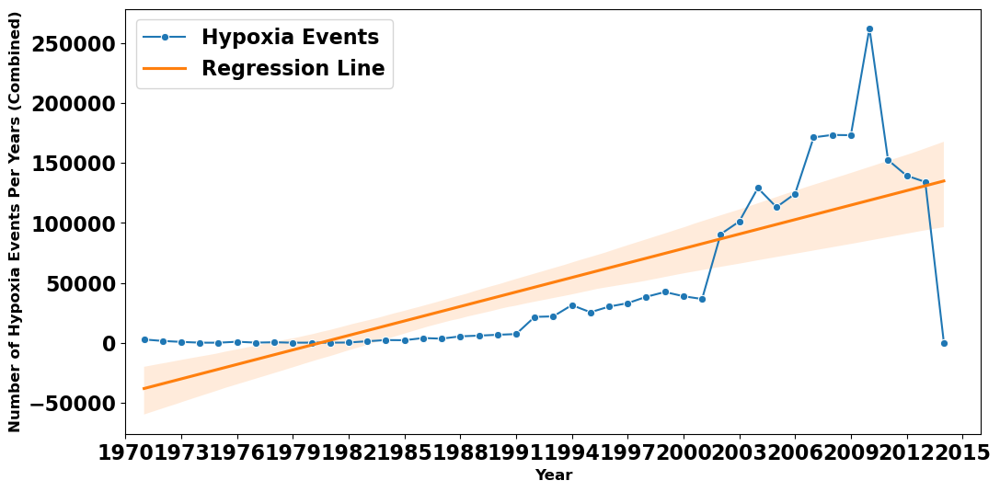

In [76]:
# Add binary column indicating hypoxia event
df2['hypoxia'] = (df2['resultmeasurevalue_mg_l'] > 2).astype(int)

# Convert 'activitystartdate' to datetime
df2['activitystartdate'] = pd.to_datetime(df2['activitystartdate'])

# Extract year from 'activitystartdate'
df2['year'] = df2['activitystartdate'].dt.year
# after 1970
df2=df2[df2['year']>1970]
# Count hypoxia events per year #To count per month: df2.groupby(df2['activitystartdate'].dt.to_period("M"))['hypoxia'].sum().reset_index()
hypoxia_counts = df2.groupby('year')['hypoxia'].sum().reset_index()

# Plotting
plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y='hypoxia', data=hypoxia_counts, marker='o', label='Hypoxia Events')

# Adding regression line
sns.regplot(x='year', y='hypoxia', data=hypoxia_counts, scatter=False, label='Regression Line')
# Set y-axis to log scale
#plt.title('Hypoxia Events Per Year with Regression Line')
plt.xlabel('Year', fontsize=12,fontweight='bold')
plt.ylabel('Number of Hypoxia Events Per Years (Combined)', fontsize=12,fontweight='bold')
# xlim minimum and maximum of df2['year']
plt.xlim(df2['year'].min()-1, df2['year'].max()+2)
# add xticks
plt.xticks(np.arange(df2['year'].min()-1, df2['year'].max()+2, 3.0))
plt.legend()
# save figure 
plt.savefig(r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\figure\hypoxiaevtn.jpg",dpi=400,bbox_inches='tight')
plt.show()

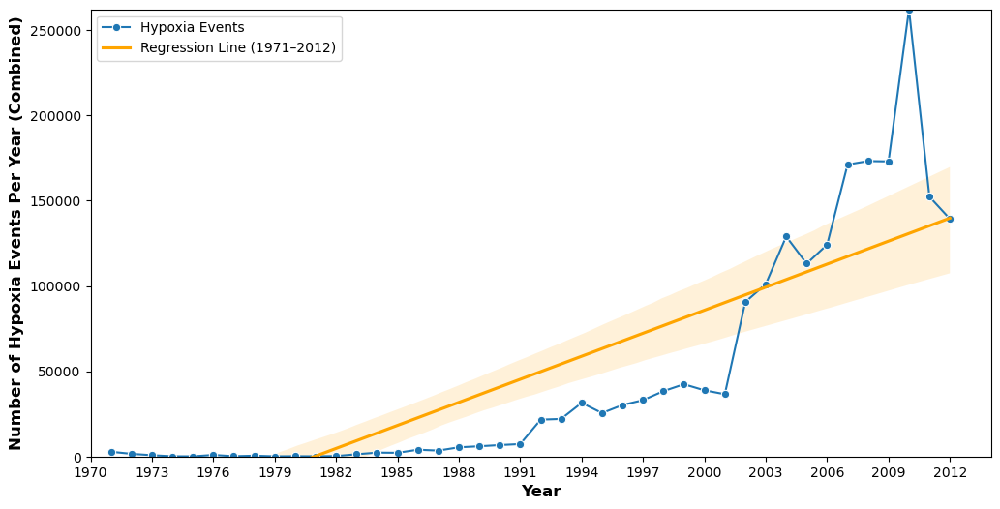

In [20]:
# Filter for consistent trend years (example: 1990–2012)
trend_data = hypoxia_counts[(hypoxia_counts['year'] >= 1971) & (hypoxia_counts['year'] <= 2012)]
# filter same from hypoxia_counts
hypoxia_counts= hypoxia_counts[(hypoxia_counts['year'] >= 1971) & (hypoxia_counts['year'] <= 2012)]
# Plot
plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y='hypoxia', data=hypoxia_counts, marker='o', label='Hypoxia Events')

# Add regression for selected period only
sns.regplot(x='year', y='hypoxia', data=trend_data, scatter=False, label='Regression Line (1971–2012)', color='orange')

# Format
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Number of Hypoxia Events Per Year (Combined)', fontsize=12, fontweight='bold')
plt.xlim(hypoxia_counts['year'].min()-1, hypoxia_counts['year'].max()+2)
plt.xticks(np.arange(hypoxia_counts['year'].min()-1, hypoxia_counts['year'].max()+2, 3))
# ylimit
plt.ylim(0, hypoxia_counts['hypoxia'].max()+1)
plt.legend()

plt.savefig(r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\figure\hypoxiaevtn_updated.jpg", dpi=400, bbox_inches='tight')
plt.show()


In [10]:
df2['hypoxia'].sum()

2129690

In [21]:

# Create a new column for the 5/10-year periods
df2['5_year_period'] = (df2['activitystartdate'].dt.year // 10) * 10

# Group by the 5-year periods and calculate descriptive statistics
hypoxia_stats = df2.groupby('5_year_period')['hypoxia'].describe()

print(hypoxia_stats)

                   count      mean       std  min  25%  50%  75%  max
5_year_period                                                        
1970              6937.0  0.997694  0.047974  0.0  1.0  1.0  1.0  1.0
1980             25129.0  0.997175  0.053081  0.0  1.0  1.0  1.0  1.0
1990            264466.0  0.977252  0.149098  0.0  1.0  1.0  1.0  1.0
2000           1197502.0  0.961223  0.193064  0.0  1.0  1.0  1.0  1.0
2010            714264.0  0.963502  0.187525  0.0  1.0  1.0  1.0  1.0


In [33]:
df=pd.read_csv(r"D:\my works\bloom\data\NC\Dissolved_Oxygen_-_Gulf_of_Mexico_(GCOOS)_mmay-sep.csv")
df['activitystartdate']=pd.to_datetime(df['activitystartdate'])
#format date
df['activitystartdate']=df['activitystartdate'].dt.strftime('%Y-%m-%d')
# greater than 0
df=df[df['resultmeasurevalue_mg_l']>0]
# select whole month of 2010-07
df=df[df['activitystartdate'].str.contains('2018')]
# unique dates like 2021-05-01
print(df.shape)
df['activitystartdate'].unique()
## save to csv
#df.to_csv(r"D:\my works\bloom\data\NC\Dissolved_Oxygen_-_Gulf_of_Mexico_(GCOOS)2013_09.csv",index=False)

(0, 4)


array([], dtype=object)

In [2]:
study_area = ee.FeatureCollection("projects/ee-hafezahmad10/assets/US_GULF_eez_FL_MS_L_T")
# image_collection = ee.ImageCollection('NASA/OCEANDATA/MODIS-Aqua/L3SMI').filterBounds(study_area).filterDate('2010-01-01', '2010-01-31').mean().clip(study_area)
# # generate text B1, B2, B3, B4, B5, B6, B7, B8, B8A, B9, B11, B12 and B8A
# bands=['chlor_a', 'nflh','poc','sst','Rrs_412','Rrs_443','Rrs_469','Rrs_488','Rrs_531','Rrs_547','Rrs_555','Rrs_645','Rrs_667','Rrs_678']
# out_tif ="OCEANDATA_MODIS-Aqua_L3SMI2010_07"
# # to drive
# geemap.ee_export_image_to_drive(image_collection.select(bands),description=out_tif, scale=4000, region=study_area.geometry())

# now create create monthly date from 2010 to 2024
# create date range: start and end date use list comprehension
# date_start= [f'{year}-07-01' for year in range(2014,2022)]
# date_end= [f'{year}-07-31' for year in range(201,2022)]
import calendar
years = range(2018, 2022)  # Define the range of years
date_start = []
date_end = []
for year in years:
    for month in range(1, 13):  # Loop over each month (1 to 12)
        # Get the number of days in the month
        num_days = calendar.monthrange(year, month)[1]
        # Append the start and end dates for the current month
        date_start.append(f'{year}-{month:02d}-01')
        date_end.append(f'{year}-{month:02d}-{num_days}')
print(date_start)
print(date_end)
# now use for loop to iterate over date_start and date_end and image_collection
for start, end in zip(date_start, date_end):
    # filter image collection
    image_collection = ee.ImageCollection('NASA/OCEANDATA/MODIS-Aqua/L3SMI').filterBounds(study_area).filterDate(start, end).mean().clip(study_area)
    # generate text B1, B2, B3, B4, B5, B6, B7, B8, B8A, B9, B11, B12 and B8A
    bands=['chlor_a', 'nflh','poc','sst','Rrs_412','Rrs_443','Rrs_469','Rrs_488','Rrs_531','Rrs_547','Rrs_555','Rrs_645','Rrs_667','Rrs_678']
    out_tif =f"OCEANDATA_MODIS-Aqua_L3SMI{start}"
    # to drive
    geemap.ee_export_image_to_drive(image_collection.select(bands),description=out_tif, scale=1000, region=study_area.geometry(),folder='GEE_exports')

['2018-01-01', '2018-02-01', '2018-03-01', '2018-04-01', '2018-05-01', '2018-06-01', '2018-07-01', '2018-08-01', '2018-09-01', '2018-10-01', '2018-11-01', '2018-12-01', '2019-01-01', '2019-02-01', '2019-03-01', '2019-04-01', '2019-05-01', '2019-06-01', '2019-07-01', '2019-08-01', '2019-09-01', '2019-10-01', '2019-11-01', '2019-12-01', '2020-01-01', '2020-02-01', '2020-03-01', '2020-04-01', '2020-05-01', '2020-06-01', '2020-07-01', '2020-08-01', '2020-09-01', '2020-10-01', '2020-11-01', '2020-12-01', '2021-01-01', '2021-02-01', '2021-03-01', '2021-04-01', '2021-05-01', '2021-06-01', '2021-07-01', '2021-08-01', '2021-09-01', '2021-10-01', '2021-11-01', '2021-12-01']
['2018-01-31', '2018-02-28', '2018-03-31', '2018-04-30', '2018-05-31', '2018-06-30', '2018-07-31', '2018-08-31', '2018-09-30', '2018-10-31', '2018-11-30', '2018-12-31', '2019-01-31', '2019-02-28', '2019-03-31', '2019-04-30', '2019-05-31', '2019-06-30', '2019-07-31', '2019-08-31', '2019-09-30', '2019-10-31', '2019-11-30', '201

In [3]:
# Count the occurrences of each date
date_counts = df['activitystartdate'].value_counts()

# Get the date with the highest count
date_with_highest_count = date_counts.idxmax()

# Get the highest count
highest_count = date_counts.max()

print("Date with the highest number of data points:", date_with_highest_count)
print("Number of data points on that date:", highest_count)

Date with the highest number of data points: 2010-07-15
Number of data points on that date: 5926


In [5]:
df1=pd.read_csv(r"D:\my works\bloom\data\NC\Dissolved_Oxygen_-_Gulf_of_Mexico_(GCOOS)_07.csv")
df1['id']=np.arange(1,len(df1)+1)
# add new column:id:sequence of numbers starting from 1
df1['id']=np.arange(1,len(df1)+1)
df1
point2022=geemap.df_to_ee(df1)

In [ ]:
study_area = ee.FeatureCollection("projects/ee-hafezahmad10/assets/US_GULF_eez_FL_MS_L_T")
image_collection = ee.ImageCollection('NASA/OCEANDATA/MODIS-Aqua/L3SMI').filterBounds(study_area).filterDate('2010-01-01', '2010-01-31').mean().clip(study_area)
# generate text B1, B2, B3, B4, B5, B6, B7, B8, B8A, B9, B11, B12 and B8A
bands=['chlor_a', 'nflh','poc','sst','Rrs_412','Rrs_443','Rrs_469','Rrs_488','Rrs_531','Rrs_547','Rrs_555','Rrs_645','Rrs_667','Rrs_678']
path=r"D:\my works\bloom\data\MODIS"
out_csv = os.path.join(path, 'MODIS-Aqua_L3SMI.csv')
geemap.extract_values_to_points(point2022, image_collection.select(bands), out_csv,scale=500)

In [11]:
def mmol_per_m3_to_mg_per_L(concentration_mmol_per_m3):
    molecular_weight_oxygen = 32  # g/mol
    conversion_factor = 1 / 1000 * molecular_weight_oxygen
    concentration_mg_per_L = concentration_mmol_per_m3 * conversion_factor
    return concentration_mg_per_L
    
mmol_per_m3_to_mg_per_L(193)

6.176

In [16]:
def mmol_per_m3_to_mg_per_L(dissolved_oxygen_mmol_per_m3):
    molar_mass_oxygen = 32  # g/mol
    conversion_factor = molar_mass_oxygen / 1000  # Conversion factor from g to mg

    dissolved_oxygen_mg_per_L = dissolved_oxygen_mmol_per_m3 * conversion_factor
    return dissolved_oxygen_mg_per_L
mmol_per_m3_to_mg_per_L (200)

6.4

# lower than 63 mmol m−3
# lower than 2 mg/l

In [78]:
path=r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\csv"
# find all "train" containing .csv files
files = glob.glob(os.path.join(path, "*train*.csv"))
# read first only
df=pd.read_csv(files[0])
df.drop(columns=['OID_', 'latitude', 'longitude', 'activitystartdate'], inplace=True)
# read next all and rename columns based on first file columns
for file in files[1:]:
    df1 = pd.read_csv(file)
    df1.drop(columns=['OID_', 'latitude', 'longitude', 'activitystartdate'], inplace=True)
    df1.columns = df.columns
    df = pd.concat([df, df1], ignore_index=True)
# remove nan values
df.dropna(inplace=True)
print(df.shape)
print(df.columns)
df.head(2)

(116444, 15)
Index(['resultmeasurevalue_mg_l', 'chlor_a', 'nflh', 'poc', 'sst', 'Rrs_412',
       'Rrs_443', 'Rrs_469', 'Rrs_488', 'Rrs_531', 'Rrs_547', 'Rrs_555',
       'Rrs_645', 'Rrs_667', 'Rrs_678'],
      dtype='object')


,resultmeasurevalue_mg_l,chlor_a,nflh,poc,sst,Rrs_412,Rrs_443,Rrs_469,Rrs_488,Rrs_531,Rrs_547,Rrs_555,Rrs_645,Rrs_667,Rrs_678
0,4.997,0.209567,0.019738,63.439999,25.814131,0.005095,0.005134,0.004986,0.004535,0.002386,0.001788,0.001522,0.000124,0.000172,0.000168
1,5.003,0.209567,0.019738,63.439999,25.814131,0.005095,0.005134,0.004986,0.004535,0.002386,0.001788,0.001522,0.000124,0.000172,0.000168


In [2]:
# import random forest
from sklearn.ensemble import RandomForestRegressor
# import all regressors
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
# support vector regression
from sklearn.svm import SVR
# kernel ridge regression
from sklearn.kernel_ridge import KernelRidge
# Gaussian Process Regression
from sklearn.gaussian_process import GaussianProcessRegressor
# Gradient Boosting Regression
from sklearn.ensemble import GradientBoostingRegressor
# Neural network MLP
from sklearn.neural_network import MLPRegressor
# KNN
from sklearn.neighbors import KNeighborsRegressor
# Decision Tree
from sklearn.tree import DecisionTreeRegressor
# Bayesian Ridge
from sklearn.linear_model import BayesianRidge
# Gaussian Naive Bayes
from sklearn.naive_bayes import GaussianNB
# Gaussian Process
from sklearn.gaussian_process import GaussianProcessRegressor
# AdaBoost
from sklearn.ensemble import AdaBoostRegressor
# import xgboost
from xgboost import XGBRegressor
models=[RandomForestRegressor(),LinearRegression(),Ridge(),Lasso(),ElasticNet(),SVR(),KernelRidge(),GaussianProcessRegressor(),GradientBoostingRegressor(),MLPRegressor(),KNeighborsRegressor(),DecisionTreeRegressor(),BayesianRidge(),GaussianNB(),GaussianProcessRegressor(),AdaBoostRegressor(),XGBRegressor()]
print(f'models: {models}')

models: [RandomForestRegressor(), LinearRegression(), Ridge(), Lasso(), ElasticNet(), SVR(), KernelRidge(), GaussianProcessRegressor(), GradientBoostingRegressor(), MLPRegressor(), KNeighborsRegressor(), DecisionTreeRegressor(), BayesianRidge(), GaussianNB(), GaussianProcessRegressor(), AdaBoostRegressor(), XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
     

In [ ]:
#set working directory E:\my works\andaman\data\nc\copernicus
os.chdir(r'E:\my works\andaman\data\nc\copernicus')
# list all nc files
ncfiles=glob.glob('*.nc')
# split file name by _ and select 1st  
ncfiles=[i.split('_')[0] for i in ncfiles]
# unique file names
ncfiles=np.unique(ncfiles)
print(ncfiles)

In [ ]:
# list all nc files
ncfiles=glob.glob('*.nc')
# select file if contains somxl030
#ncfiles=[i for i in ncfiles if 'somxl030' in i]#Mixed Layer Depth 0.03
# somxl010
#ncfiles=[i for i in ncfiles if 'somxl010' in i]#Mixed Layer Depth 0.01
#sosaline
ncfiles=[i for i in ncfiles if 'sosaline' in i]#Sea Surface Salinity
#sossheig
#ncfiles=[i for i in ncfiles if 'sossheig' in i]#Sea Surface Height
#sozotaux
#ncfiles=[i for i in ncfiles if 'sozotaux' in i]#Zonal Wind Stress
#sohtc300
#ncfiles=[i for i in ncfiles if 'sohtc300' in i]#Net Heat Flux at Sea Water Surface
# open first
ds=xr.open_dataset(ncfiles[0])
# Convert latitude and longitude to standard ranges
ds['x'] = (ds['x'] - 500) / 10
ds['y'] = ds['y']+180
# make a map sosaline
ds.sosaline.plot()

In [ ]:
#2020-12-31: vo.uo.,theoteo,bpottomT, sa,ml
ds=xr.open_dataset(r'D:\my works\bloom\data\NC\mercatorfreebiorys2v4_global_mean_20200714.nc')
ds



In [ ]:
# select depth
ds=ds.sel(depth=4.940250e-01)
# NO3: now extract for rows in sst
no3_df=pd.DataFrame()
for i in range(len(sst)):
    no3= ds.sel(latitude=sst.iloc[i][1] , longitude=	sst.iloc[i][0], method='nearest')['no3']
    no3=no3.to_dataframe()['no3'].values
    no3_df=no3_df.append(pd.DataFrame(no3))
no3_df
# add column names : no3
no3_df.columns=['no3']

# make above code as a function, input: nc file, variable name, depth, output: dataframe
def nc_to_df(ncfile, var):
    ds = xr.open_dataset(ncfile)
    ds = ds.sel(depth=4.940250e-01)
    df = pd.DataFrame()
    for i in range(len(sst)):
        ds1 = ds.sel(latitude=sst.iloc[i][1], longitude=sst.iloc[i][0], method='nearest')[var]
        dsvalues = ds1.to_dataframe()[var].values
        df = df.append(pd.DataFrame(dsvalues, columns=[var]))
        # add column names : var
    df.columns = [var]
    return df
#  apply to talk varible:total alkalinity
talk=nc_to_df(r'E:\my works\bloom\data\NC\talk\mercatorbiomer4v2r1_global_mean_20201201.nc','talk')
#no3: Nitrate
no3=nc_to_df(r'E:\my works\bloom\data\NC\no3\mercatorbiomer4v2r1_global_mean_20201201.nc','no3')
# dissic: Dissolved inorganic carbon
dissic=nc_to_df(r'E:\my works\bloom\data\NC\dissolved inorganic carbon\mercatorbiomer4v2r1_global_mean_20201201.nc','dissic')
#si: Silicate
si=nc_to_df(r'E:\my works\bloom\data\NC\si\mercatorbiomer4v2r1_global_mean_20201201.nc','si')
# nppv: Net Primary Production of Biomass by Phytoplankton
nppv=nc_to_df(r'E:\my works\bloom\data\NC\nppv\mercatorbiomer4v2r1_global_mean_20201201.nc','nppv')
# phyc: Phytoplankton Carbon
phyc=nc_to_df(r'E:\my works\bloom\data\NC\phyc\mercatorbiomer4v2r1_global_mean_20201201.nc','phyc')
# spco2: Surface Partial Pressure of CO2
spco2=nc_to_df(r'E:\my works\bloom\data\NC\spco2\mercatorbiomer4v2r1_global_mean_20201201.nc','spco2')
# o2: Dissolved Oxygen
o2=nc_to_df(r'E:\my works\bloom\data\NC\o2\mercatorbiomer4v2r1_global_mean_20201201.nc','o2')
#po4: Phosphate
po4=nc_to_df(r'E:\my works\bloom\data\NC\po4\mercatorbiomer4v2r1_global_mean_20201201.nc','po4')
#chl: Chlorophyll
chl=nc_to_df(r'E:\my works\bloom\data\NC\chl\mercatorbiomer4v2r1_global_mean_20201201.nc','chl')

In [ ]:
# woa18_95A4_s16_01.nc
#sil=xr.open_dataset(r'E:\my works\andaman\data\nc\dataset-reanalysis-oras5-5f5d7cdd-f2ff-41be-9285-d9f24e3d9068.tar\dataset-reanalysis-oras5-5f5d7cdd-f2ff-41be-9285-d9f24e3d9068\sohtc300_control_monthly_highres_2D_201511_OPER_v0.1.nc')#,decode_times=False) #,decode_times=False
#units, reference_date = sil.time.attrs['units'].split('since')
#sil['time'] = pd.date_range(start=reference_date, periods=sil.sizes['time'], freq='MS')# MS means start of month
# print time range
#print(sil.time.min().values,sil.time.max().values)
del sil

# Machine learning and deep learning libraries

In [11]:
# all regression
from sklearn.linear_model import LinearRegression
# support vector regression
from sklearn.svm import SVR
# random forest regression
from sklearn.ensemble import RandomForestRegressor
# decision tree regression
from sklearn.tree import DecisionTreeRegressor
# KNN regression
from sklearn.neighbors import KNeighborsRegressor
# gradient boosting regression
from sklearn.ensemble import GradientBoostingRegressor
# AdaBoost regression
from sklearn.ensemble import AdaBoostRegressor
# XGBoost regression
from xgboost import XGBRegressor
# polynomial regression
from sklearn.preprocessing import PolynomialFeatures

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error,explained_variance_score
import joblib

In [79]:
# remove -9999 containing rows across all columns
df=df[~df.isin([-9999]).any(axis=1)]
print(df.columns)
# print print max and min of all columns
for col in df.columns:
    print(f'{col} max {df[col].max()} min {df[col].min()}')
df.shape

Index(['resultmeasurevalue_mg_l', 'chlor_a', 'nflh', 'poc', 'sst', 'Rrs_412',
       'Rrs_443', 'Rrs_469', 'Rrs_488', 'Rrs_531', 'Rrs_547', 'Rrs_555',
       'Rrs_645', 'Rrs_667', 'Rrs_678'],
      dtype='object')
resultmeasurevalue_mg_l max 9.99 min 0.071
chlor_a max 66.9477005 min 0.0442188
nflh max 0.757995 min -0.359925
poc max 4075.7998047 min 25.2666664
sst max 32.7356644 min 23.5072498
Rrs_412 max 0.0147457 min -0.000464
Rrs_443 max 0.0119553 min 0.000414
Rrs_469 max 0.015042 min 0.00064
Rrs_488 max 0.01719 min 0.000783
Rrs_531 max 0.019508 min 0.001126
Rrs_547 max 0.019388 min 0.001099
Rrs_555 max 0.018238 min 0.001068
Rrs_645 max 0.013218 min -0.0002693
Rrs_667 max 0.011598 min -0.0002047
Rrs_678 max 0.011046 min -0.000198


(116444, 15)

In [12]:
# x features except siconc_NGO
fields= ['resultmeasurevalue_mg_l', 'chlor_a', 'nflh', 'poc', 'sst', 'Rrs_412',
       'Rrs_443', 'Rrs_469', 'Rrs_488', 'Rrs_531', 'Rrs_547', 'Rrs_555',
       'Rrs_645', 'Rrs_667', 'Rrs_678']
# x=df[[ 'chlor_a', 'nflh', 'poc', 'sst', 'Rrs_412',
#        'Rrs_443', 'Rrs_469', 'Rrs_488', 'Rrs_531', 'Rrs_547', 'Rrs_555',
#        'Rrs_645', 'Rrs_667', 'Rrs_678']]
x=df[['Rrs_678',
 'sst',
 'nflh',
 'Rrs_443',
 'poc',
 'Rrs_645',
 'Rrs_488',
 'Rrs_547',
 'chlor_a',
 'Rrs_531']]
# y target
y=df['resultmeasurevalue_mg_l']
# Set random seed for reproducibility
np.random.seed(42)
# split train and test
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=0)
models_directory=r'D:\my works\bloom\data\models'
# define function to calculate MAPE
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
# define model
def model_score(model,model_name):
    print(f'model fitting: {model}')
    model.fit(x_train,y_train)
    # save model
    model_path = os.path.join(models_directory, f'{model_name}.pkl')
    joblib.dump(model, model_path)
    y_pred = model.predict(x_test)
    r2 = model.score(x_test,y_test) # R2 score
    mae = mean_absolute_error(y_test, y_pred) # Mean Absolute Error
    rmse = np.sqrt(mean_squared_error(y_test, y_pred)) # Root Mean Squared Error
    #evs = explained_variance_score(y_test, y_pred) # Explained Variance Score
    mape=mean_absolute_percentage_error(y_test, y_pred) # Mean Absolute Percentage Error
    return r2, mae, rmse, mape
#models=[LinearRegression(),SVR(),RandomForestRegressor(),DecisionTreeRegressor(),KNeighborsRegressor(),GradientBoostingRegressor(),AdaBoostRegressor(),XGBRegressor()]
#model_names=['LinearRegression','SVR','RandomForestRegressor','DecisionTreeRegressor','KNeighborsRegressor','GradientBoostingRegressor','AdaBoostRegressor','XGBRegressor']
models=[RandomForestRegressor(),LinearRegression(),Ridge(),Lasso(),ElasticNet(),SVR(),GradientBoostingRegressor(),MLPRegressor(),KNeighborsRegressor(),DecisionTreeRegressor(),BayesianRidge(),AdaBoostRegressor(),XGBRegressor()]
model_names=['RF','LR','Ridge','Lasso','ENet','SVR','GrdBoosting','MLP','KNeighbors','DT','BayesianR','AdaBoost','XGB']

scores=[]
for model, name in zip(models, model_names):
    r2, mae, rmse, mape = model_score(model, name)
    scores.append((r2, mae, rmse, mape))

# plot
plt.figure(figsize=(20,5))
# Unpack scores into separate lists for plotting
r2_scores, mae_scores, rmse_scores, mape_scores = zip(*scores)
plt.bar(model_names, r2_scores, color=['red','blue','green','yellow','cyan','orange','purple','brown','pink','gray','olive','black','magenta'])
# add percentage in bar
for i in range(len(r2_scores)):
    plt.text(i, r2_scores[i], str(round(r2_scores[i]*100,2))+'%')

NameError: name 'Ridge' is not defined

In [ ]:
for model, name in zip(models, model_names):
    r2, mae, rmse, mape = model_score(model, name)
    scores.append((name, r2, mae, rmse, mape))  # Include the model name

# Convert the scores list to a DataFrame
scores_df = pd.DataFrame(scores, columns=['Model', 'R2', 'MAE', 'RMSE', 'mape'])

scores_df

In [ ]:
model_path = os.path.join(models_directory, 'RF.pkl')
model = joblib.load(model_path)
np.random.seed(42)
# get feature importance
importance=model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
    print(f'Feature: {x.columns[i]}, Score: {v}')
# make dataframe
df_importance=pd.DataFrame({'Features':x.columns,'Importance':importance})
df_importance=df_importance.sort_values(by='Importance',ascending=False)
# print top 10 Features
df_importance['Features'][:10].to_list()

In [80]:
# Define the feature columns and target variable
feature_columns = ['chlor_a', 'nflh', 'poc', 'sst', 'Rrs_412',
       'Rrs_443', 'Rrs_469', 'Rrs_488', 'Rrs_531', 'Rrs_547', 'Rrs_555',
       'Rrs_645', 'Rrs_667', 'Rrs_678']
target_column = 'resultmeasurevalue_mg_l'

# Create a function to convert regression target to classification labels
def convert_to_class(value):
    #if value less 2 then 1 else 0 # 1:Hypoxic, 0:Nonhypoxic
    return 1 if value < 2 else 0

# Convert the target variable to classification labels
df['class_label'] = df[target_column].apply(convert_to_class)
# drop target column
df.drop(columns=[target_column], inplace=True)
print(df['class_label'].value_counts())
from sklearn.utils import resample

# Separate majority and minority classes
df_majority = df[df.class_label==0]
df_minority = df[df.class_label==1]

# Downsample majority class
df_majority_downsampled = resample(df_majority, 
                                 replace=False,    # sample without replacement
                                 n_samples=df_minority.shape[0],     # to match minority class
                                 random_state=123) # reproducible results

# Combine minority class with downsampled majority class
df_balanced = pd.concat([df_minority, df_majority_downsampled])

# Display new class counts
print(df_balanced.class_label.value_counts())

class_label
0    115248
1      1196
Name: count, dtype: int64
class_label
1    1196
0    1196
Name: count, dtype: int64


In [7]:
df_balanced
import numpy as np

def coefficient_of_variation(data):
    return np.std(data) / np.mean(data)

# Calculate mean, max, min, std
agg_df = df_balanced.drop(columns=['class_label']).agg(['mean', 'max', 'min', 'std']).T

# Calculate coefficient of variation
cv_df = df_balanced.drop(columns=['class_label']).apply(coefficient_of_variation)
# Add coefficient of variation to the aggregated DataFrame
agg_df['cv'] = cv_df
agg_df

,mean,max,min,std,cv
chlor_a,6.101199,66.947700,0.044219,6.980463,1.143874
nflh,0.179522,0.678817,-0.359925,0.152655,0.850164
poc,338.861893,4075.799805,25.266666,337.973003,0.997168
sst,29.497944,32.696251,24.431786,1.691251,0.057323
Rrs_412,0.005164,0.014746,-0.000149,0.003685,0.713542
Rrs_443,0.005168,0.011955,0.000863,0.002684,0.519197
Rrs_469,0.005386,0.011154,0.001564,0.002097,0.389286
Rrs_488,0.005297,0.012389,0.001976,0.001694,0.319844
Rrs_531,0.005386,0.015629,0.002103,0.002952,0.547999
Rrs_547,0.005520,0.016213,0.001444,0.003596,0.651292


In [120]:
agg_df.T

,mean,max,min,std
chlor_a,6.101199,66.947700,0.044219,6.980463
nflh,0.179522,0.678817,-0.359925,0.152655
poc,338.861893,4075.799805,25.266666,337.973003
sst,29.497944,32.696251,24.431786,1.691251
Rrs_412,0.005164,0.014746,-0.000149,0.003685
Rrs_443,0.005168,0.011955,0.000863,0.002684
Rrs_469,0.005386,0.011154,0.001564,0.002097
Rrs_488,0.005297,0.012389,0.001976,0.001694
Rrs_531,0.005386,0.015629,0.002103,0.002952
Rrs_547,0.005520,0.016213,0.001444,0.003596


# Classification

In [83]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
#mlp
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
import joblib

In [82]:

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
#mlp
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
# Load the data
# Define the feature columns and target variable
# feature_columns = ['chlor_a', 'nflh', 'poc', 'sst', 'Rrs_412',
#        'Rrs_443', 'Rrs_469', 'Rrs_488', 'Rrs_531', 'Rrs_547', 'Rrs_555',
#        'Rrs_645', 'Rrs_667', 'Rrs_678']
# target_column = 'resultmeasurevalue_mg_l'

# # Create a function to convert regression target to classification labels
# def convert_to_class(value):
#     #if value less 2 then 0 else 1 # 0:Hypoxic, 1:Nonhypoxic
#     return 0 if value < 2 else 1

# # Convert the target variable to classification labels
# df['class_label'] = df[target_column].apply(convert_to_class)
# # drop target column
# df.drop(columns=[target_column], inplace=True)
# print(df['class_label'].value_counts())
# currently class label is unbalanced, balance


# Separate features and target variable
X = df_balanced[feature_columns]
# normalize
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
print(X.shape)
y = df_balanced['class_label']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
np.random.seed(42)
# Define classifiers
classifiers = {
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Logistic Regression': LogisticRegression(random_state=42),
    'Support Vector Machine': SVC(random_state=42),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Naive Bayes': GaussianNB(),
    'XGBoost': XGBClassifier(seed=42),
    'MLP': MLPClassifier(random_state=42)
}
models_directory=r'D:\my works\bloom\data\models'

evaluation_results = []

for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    # Save the trained model
    model_path = os.path.join(models_directory, f'{name}.pkl')
    joblib.dump(clf, model_path)
    
    # Evaluate the classifier
    y_pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    classification_rep = classification_report(y_test, y_pred, output_dict=True,zero_division=1)
    
    # Append evaluation results to the list
    evaluation_results.append({
        'Classifier': name,
        'Accuracy': accuracy,
        'Precision': classification_rep['weighted avg']['precision'],
        'Recall': classification_rep['weighted avg']['recall'],
        'F1-score': classification_rep['weighted avg']['f1-score']
    })

# Create a DataFrame from the evaluation results
evaluation_df = pd.DataFrame(evaluation_results)

# Print the evaluation DataFrame
evaluation_df.sort_values(by='F1-score', ascending=False)

(2392, 14)


FileNotFoundError: [Errno 2] No such file or directory: 'D:\\my works\\bloom\\data\\models\\Random Forest.pkl'

In [84]:
from sklearn.preprocessing import MinMaxScaler
X = df_balanced[feature_columns]
# normalize
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
print(X.shape)
y = df_balanced['class_label']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
np.random.seed(42)
models_directory=r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\models"

import joblib
import os

# Path to your saved model file (update filename as needed)
model_path = r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\models\Decision Tree.pkl"

# Load the model
model = joblib.load(model_path)
print("Model loaded successfully.")
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
import numpy as np

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score)
}

results = {}
for metric, scorer in scoring.items():
    scores = cross_val_score(model, X, y, scoring=scorer, cv=cv)
    results[metric] = (scores.mean(), scores.std())

for metric, (mean, std) in results.items():
    print(f"{metric.capitalize()}: {mean:.4f} ± {std:.4f}")
# print same for all models



(2392, 14)
Model loaded successfully.
Accuracy: 0.9155 ± 0.0069
Precision: 0.8920 ± 0.0053
Recall: 0.9457 ± 0.0137
F1: 0.9180 ± 0.0070


c:\Users\hafez\miniconda3\Lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeClassifier from version 1.4.1.post1 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [17]:
models_directory = r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\models"

import joblib
import os
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
import numpy as np

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score)
}

# List all model files in the directory
model_files = [f for f in os.listdir(models_directory) if f.endswith('.pkl')]

for model_file in model_files:
    model_path = os.path.join(models_directory, model_file)
    model = joblib.load(model_path)
    print(f"\nModel: {os.path.splitext(model_file)[0]}")
    results = {}
    for metric, scorer in scoring.items():
        scores = cross_val_score(model, X, y, scoring=scorer, cv=cv)
        results[metric] = (scores.mean(), scores.std())
    for metric, (mean, std) in results.items():
        print(f"{metric.capitalize()}: {mean:.4f} ± {std:.4f}")

c:\Users\hafez\miniconda3\Lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeClassifier from version 1.4.1.post1 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\hafez\miniconda3\Lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator KNeighborsClassifier from version 1.4.1.post1 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(



Model: Decision Tree
Accuracy: 0.9155 ± 0.0069
Precision: 0.8920 ± 0.0053
Recall: 0.9457 ± 0.0137
F1: 0.9180 ± 0.0070

Model: K-Nearest Neighbors
Accuracy: 0.9105 ± 0.0107
Precision: 0.8698 ± 0.0192
Recall: 0.9666 ± 0.0137
F1: 0.9154 ± 0.0090

Model: Logistic Regression


c:\Users\hafez\miniconda3\Lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LogisticRegression from version 1.4.1.post1 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\hafez\miniconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
c:\Users\hafez\miniconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
c:\Users\hafez\

Accuracy: 0.8750 ± 0.0093
Precision: 0.8046 ± 0.0111
Recall: 0.9908 ± 0.0055
F1: 0.8880 ± 0.0076

Model: MLP


c:\Users\hafez\miniconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\hafez\miniconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\hafez\miniconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\hafez\miniconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\hafez\miniconda3\Lib\site-packages\sklearn\neural_network\_

Accuracy: 0.8779 ± 0.0102
Precision: 0.8135 ± 0.0103
Recall: 0.9808 ± 0.0131
F1: 0.8893 ± 0.0092

Model: Naive Bayes
Accuracy: 0.8257 ± 0.0092
Precision: 0.8108 ± 0.0149
Recall: 0.8503 ± 0.0181
F1: 0.8298 ± 0.0088

Model: Random Forest
Accuracy: 0.9160 ± 0.0088
Precision: 0.8843 ± 0.0095
Recall: 0.9574 ± 0.0146
F1: 0.9193 ± 0.0086

Model: Support Vector Machine


c:\Users\hafez\miniconda3\Lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator SVC from version 1.4.1.post1 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Accuracy: 0.8813 ± 0.0103
Precision: 0.8159 ± 0.0115
Recall: 0.9850 ± 0.0097
F1: 0.8925 ± 0.0088

Model: XGBoost
Accuracy: 0.9164 ± 0.0114
Precision: 0.8837 ± 0.0118
Recall: 0.9590 ± 0.0146
F1: 0.9198 ± 0.0109


In [ ]:


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
np.random.seed(42)
model=r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\models"
import joblib
import os

# Path to your saved model file (update filename as needed)
model_path = r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\models\XGBoost.pkl"

# Load the model
model = joblib.load(model_path)
print("Model loaded successfully.")
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
import numpy as np

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

scoring = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score)
}

results = {}
for metric, scorer in scoring.items():
    scores = cross_val_score(model, X, y, scoring=scorer, cv=cv)
    results[metric] = (scores.mean(), scores.std())

for metric, (mean, std) in results.items():
    print(f"{metric.capitalize()}: {mean:.4f} ± {std:.4f}")
# print same for all models
for name, clf in classifiers.items():
    model_path = os.path.join(models_directory, f'{name}.pkl')
    model = joblib.load(model_path)
    scores = cross_val_score(model, X, y, scoring='f1', cv=cv)
    print(f"{name} F1-score: {scores.mean():.4f} ± {scores.std():.4f}")

In [130]:
model_path = os.path.join(models_directory, 'XGBoost.pkl') #XGBoost.pkl Random Forest.pk
# load model
model = joblib.load(model_path)
# # now predict
prediction=model.predict(X_test)

In [128]:
#load random forest model and xgboost model
rf_model = joblib.load(os.path.join(models_directory, 'Random Forest.pkl'))
xgb_model = joblib.load(os.path.join(models_directory, 'XGBoost.pkl'))

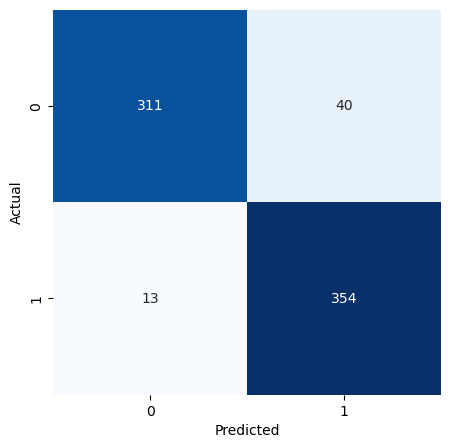

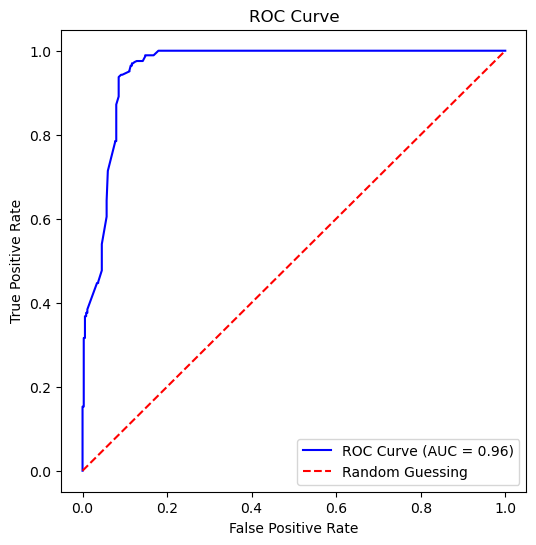

In [131]:
rf_model = joblib.load(os.path.join(models_directory, 'Random Forest.pkl'))
xgb_model = joblib.load(os.path.join(models_directory, 'XGBoost.pkl'))
# ROC curve and Precision-recall curve (PRC)
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, roc_auc_score, precision_recall_curve, auc

import matplotlib.pyplot as plt
# compute confusion matrix
cm = confusion_matrix(y_test, prediction)
# plot it
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
# save fig
plt.savefig(r'D:\my works\bloom\figure\confusion_matrix.png',dpi=600,bbox_inches='tight')
# ROC curve
# Compute the probabilities
y_probs = model.predict_proba(X_test)[:, 1]
# Compute the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
# Compute the AUC
roc_auc = roc_auc_score(y_test, y_probs)
# Plot the ROC curve
plt.figure(figsize=(6, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random Guessing')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
# save fig
plt.savefig(r'D:\my works\bloom\figure\roc_curve.png',dpi=600,bbox_inches='tight')

c:\Users\hafez\miniconda3\Lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeClassifier from version 1.4.1.post1 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\hafez\miniconda3\Lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator RandomForestClassifier from version 1.4.1.post1 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


FileNotFoundError: [Errno 2] No such file or directory: 'D:\\my works\\bloom\\figure\\confusion_matrix_Random Forest.png'

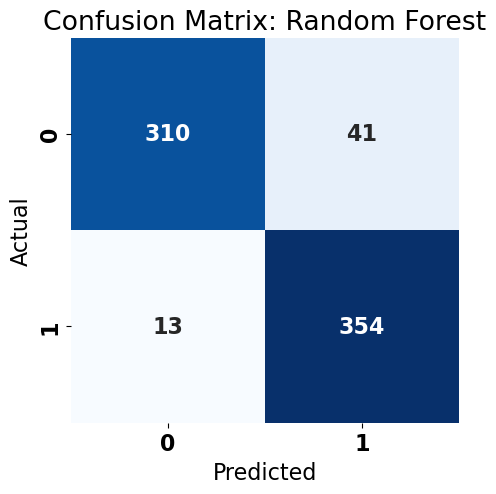

In [85]:
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score
import seaborn as sns
import matplotlib.pyplot as plt

def plot_metrics(model, X_test, y_test, model_name):
    # Compute predictions
    prediction = model.predict(X_test)
    # Compute confusion matrix
    cm = confusion_matrix(y_test, prediction)
    # Plot confusion matrix
    plt.figure(figsize=(5,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix: {model_name}')
    plt.savefig(f'D:\\my works\\bloom\\figure\\confusion_matrix_{model_name}.png', dpi=600, bbox_inches='tight')
    plt.show()

    # Compute the probabilities
    y_probs = model.predict_proba(X_test)[:, 1]
    # Compute the ROC curve
    fpr, tpr, thresholds = roc_curve(y_test, y_probs)
    # Compute the AUC
    roc_auc = roc_auc_score(y_test, y_probs)
    # Plot the ROC curve
    plt.figure(figsize=(6, 6))
    plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random Guessing')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve: {model_name}')
    plt.legend()
    plt.savefig(f'D:\\my works\\bloom\\figure\\roc_curve_{model_name}.png', dpi=600, bbox_inches='tight')
    plt.show()

# Load models
rf_model = joblib.load(os.path.join(models_directory, 'Random Forest.pkl'))
xgb_model = joblib.load(os.path.join(models_directory, 'XGBoost.pkl'))

# Plot metrics for each model
plot_metrics(rf_model, X_test, y_test, 'Random Forest')
plot_metrics(xgb_model, X_test, y_test, 'XGBoost')

c:\Users\hafez\miniconda3\Lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeClassifier from version 1.4.1.post1 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\hafez\miniconda3\Lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator RandomForestClassifier from version 1.4.1.post1 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


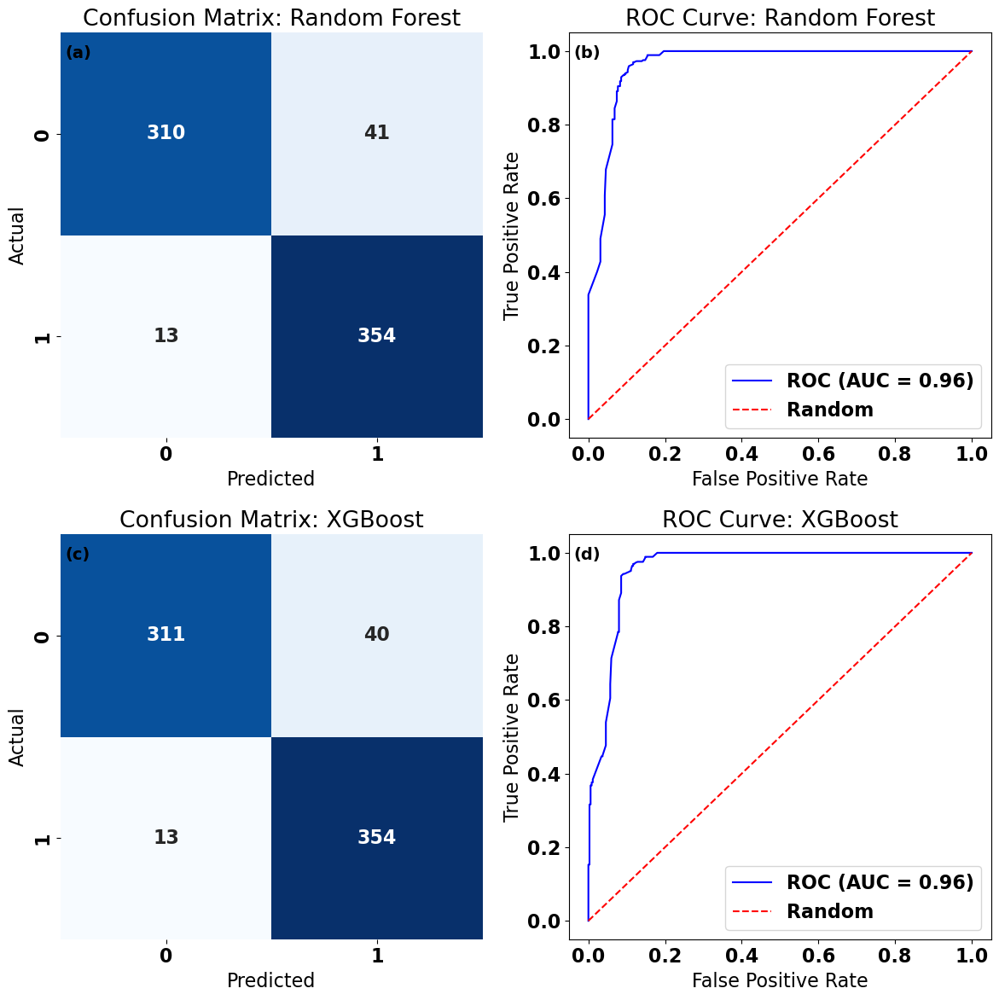

In [87]:
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score
import seaborn as sns
import os
import joblib
import matplotlib.pyplot as plt

def plot_metrics_2x2(rf_model, xgb_model, X_test, y_test):
    models = [('Random Forest', rf_model), ('XGBoost', xgb_model)]
    fig, axs = plt.subplots(2, 2, figsize=(12, 12))
    annotations = ['(a)', '(b)', '(c)', '(d)']

    for idx, (model_name, model) in enumerate(models):
        # Confusion Matrix
        prediction = model.predict(X_test)
        cm = confusion_matrix(y_test, prediction)
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, ax=axs[idx, 0])
        axs[idx, 0].set_xlabel('Predicted')
        axs[idx, 0].set_ylabel('Actual')
        axs[idx, 0].set_title(f'Confusion Matrix: {model_name}')
        axs[idx, 0].annotate(annotations[idx*2], xy=(0.01, 0.97), xycoords='axes fraction',
                             fontsize=14, fontweight='bold', ha='left', va='top')

        # ROC Curve
        y_probs = model.predict_proba(X_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, y_probs)
        roc_auc = roc_auc_score(y_test, y_probs)
        axs[idx, 1].plot(fpr, tpr, color='blue', label=f'ROC (AUC = {roc_auc:.2f})')
        axs[idx, 1].plot([0, 1], [0, 1], color='red', linestyle='--', label='Random')
        axs[idx, 1].set_xlabel('False Positive Rate')
        axs[idx, 1].set_ylabel('True Positive Rate')
        axs[idx, 1].set_title(f'ROC Curve: {model_name}')
        axs[idx, 1].legend()
        axs[idx, 1].annotate(annotations[idx*2+1], xy=(0.01, 0.97), xycoords='axes fraction',
                             fontsize=14, fontweight='bold', ha='left', va='top')

    plt.tight_layout()
    plt.savefig(r'C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\figure\metrics_2x2v1.jpg', dpi=600, bbox_inches='tight')
    plt.show()

# Usage:
models_directory=r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\models"
rf_model = joblib.load(os.path.join(models_directory, 'Random Forest.pkl'))
xgb_model = joblib.load(os.path.join(models_directory, 'XGBoost.pkl'))
plot_metrics_2x2(rf_model, xgb_model, X_test, y_test)

C:\Users\hp\AppData\Local\Temp\ipykernel_16640\3229481964.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=feature_importances, palette='viridis')


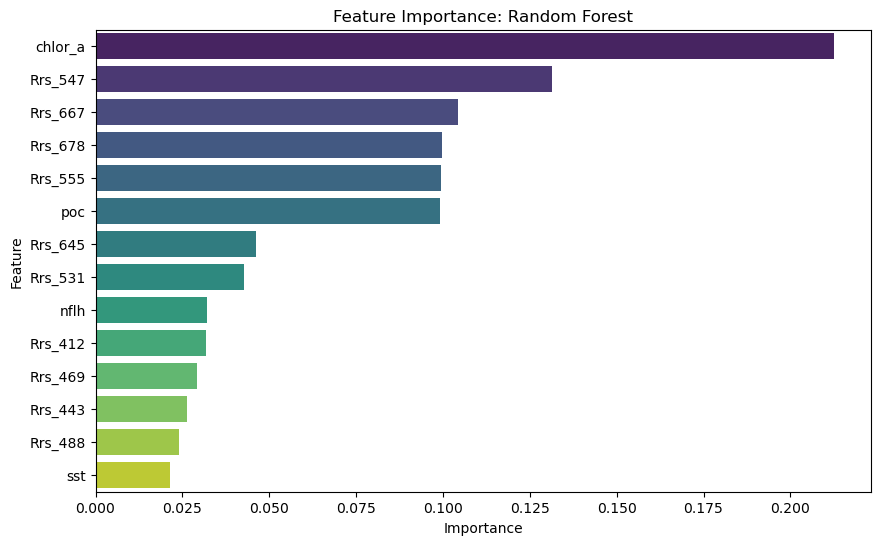

C:\Users\hp\AppData\Local\Temp\ipykernel_16640\3229481964.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='importance', y='feature', data=feature_importances, palette='viridis')


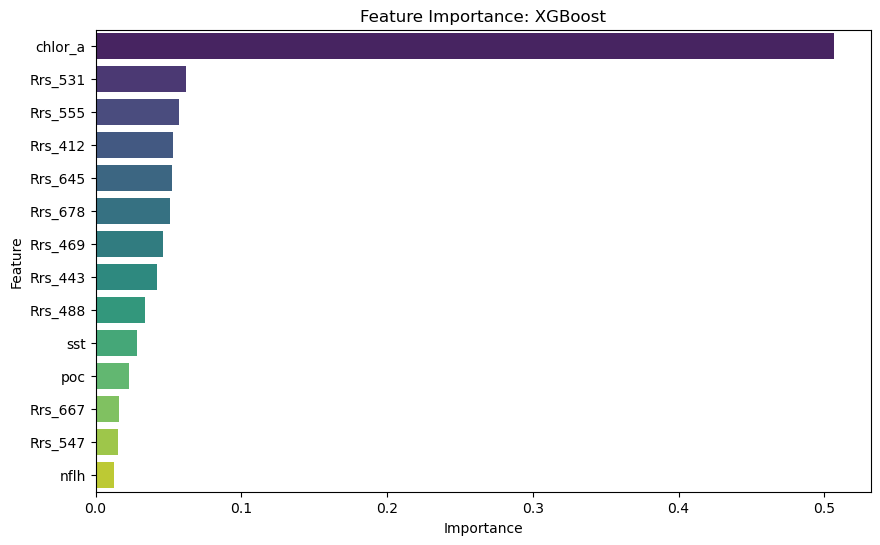

In [133]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_feature_importance(model, feature_names, model_name):
    # Get feature importances
    importances = model.feature_importances_
    # Create a DataFrame for visualization
    feature_importances = pd.DataFrame({'feature': feature_names, 'importance': importances})
    feature_importances = feature_importances.sort_values('importance', ascending=False)
    # Plot feature importances
    plt.figure(figsize=(10, 6))
    sns.barplot(x='importance', y='feature', data=feature_importances, palette='viridis')
    plt.title(f'Feature Importance: {model_name}')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.show()

# Assuming X_test is a DataFrame and columns are feature names
feature_names = ['chlor_a', 'nflh', 'poc', 'sst', 'Rrs_412',
       'Rrs_443', 'Rrs_469', 'Rrs_488', 'Rrs_531', 'Rrs_547', 'Rrs_555',
       'Rrs_645', 'Rrs_667', 'Rrs_678']
# Plot feature importance for each model
plot_feature_importance(rf_model, feature_names, 'Random Forest')
plot_feature_importance(xgb_model, feature_names, 'XGBoost')

In [92]:
# Open the multi-band raster file
with rasterio.open(r'D:\my works\bloom\data\MODIS\OCEANDATA_MODIS-Aqua_L3SMI2010_05.tif') as src:
    # Read the raster data into a numpy array
    array = src.read()
    #metadata
    meta = src.meta
print(array.shape)
# stack array into one array
array_stack=np.stack(array,axis=-1)
print(array_stack.shape)
# reshape array
array_reshaped=array_stack.reshape(-1,array_stack.shape[-1])
print(array_reshaped.shape)
# make dataframe
df_array=pd.DataFrame(array_reshaped,columns=[f'band{i}' for i in range(array_stack.shape[-1])])
df_array
# # rename columns 
df_array.columns=['chlor_a', 'nflh', 'poc', 'sst', 'Rrs_412',
       'Rrs_443', 'Rrs_469', 'Rrs_488', 'Rrs_531', 'Rrs_547', 'Rrs_555',
       'Rrs_645', 'Rrs_667', 'Rrs_678']
print(df_array.head(2))
# normalized
df_array = scaler.transform(df_array)
print(df_array.shape)
# load model
model_path = os.path.join(models_directory, 'Random Forest.pkl')
# load model
model = joblib.load(model_path)
# # now predict
prediction=model.predict(X_test)
# # now predict
prediction=model.predict(df_array)
# reshape prediction
prediction = prediction.reshape(array_stack.shape[0], array_stack.shape[1])
# Update the metadata to reflect the shape of 'prediction'
meta.update(count=1, height=prediction.shape[0], width=prediction.shape[1])
# Save prediction
with rasterio.open('D:\\my works\\bloom\\data\\prediction.tif', 'w', **meta) as dst:
    dst.write(prediction, 1)


(14, 850, 1936)
(850, 1936, 14)
(1645600, 14)
   chlor_a  nflh  poc  sst  Rrs_412  Rrs_443  Rrs_469  Rrs_488  Rrs_531  \
0      0.0   0.0  0.0  0.0      0.0      0.0      0.0      0.0      0.0   
1      0.0   0.0  0.0  0.0      0.0      0.0      0.0      0.0      0.0   

   Rrs_547  Rrs_555  Rrs_645  Rrs_667  Rrs_678  
0      0.0      0.0      0.0      0.0      0.0  
1      0.0      0.0      0.0      0.0      0.0  
(1645600, 14)


In [15]:
# files D:\my works\bloom\data\MODIS
rasters=glob.glob(r'D:\my works\bloom\data\modis out\*.tif')
# path
path=r"D:\my works\bloom\data\Predicted rast"
# now predict for all rasters
for raster in rasters:
    with rasterio.open(raster) as src:
        # Read the raster data into a numpy array
        array = src.read()
        #metadata
        meta = src.meta
    print(array.shape)
    # stack array into one array
    array_stack=np.stack(array,axis=-1)
    print(array_stack.shape)
    # reshape array
    array_reshaped=array_stack.reshape(-1,array_stack.shape[-1])
    print(array_reshaped.shape)
    # make dataframe
    df_array=pd.DataFrame(array_reshaped,columns=[f'band{i}' for i in range(array_stack.shape[-1])])
    df_array
    # # rename columns 
    df_array.columns=['chlor_a', 'nflh', 'poc', 'sst', 'Rrs_412',
           'Rrs_443', 'Rrs_469', 'Rrs_488', 'Rrs_531', 'Rrs_547', 'Rrs_555',
           'Rrs_645', 'Rrs_667', 'Rrs_678']
    print(df_array.head(2))
    # normalized
    
    df_array = scaler.transform(df_array)
    print(df_array.shape)
    # load model
    model_path = os.path.join(models_directory, 'XGBoost.pkl')
    # load model
    model = joblib.load(model_path)
    # # now predict
    prediction=model.predict(X_test)
    # # now predict
    prediction=model.predict(df_array)
    # reshape prediction
    prediction = prediction.reshape(array_stack.shape[0], array_stack.shape[1])
    # Update the metadata to reflect the shape of 'prediction'
    meta.update(count=1, height=prediction.shape[0], width=prediction.shape[1])
    # Save prediction
    with rasterio.open(os.path.join(path, f'{os.path.splitext(os.path.basename(raster))[0]}_XGB.tif'), 'w', **meta) as dst:
        dst.write(prediction, 1)
    # clear memory
    del array_stack, array_reshaped, df_array, prediction

(14, 850, 1936)
(850, 1936, 14)
(1645600, 14)
   chlor_a  nflh  poc  sst  Rrs_412  Rrs_443  Rrs_469  Rrs_488  Rrs_531  \
0      0.0   0.0  0.0  0.0      0.0      0.0      0.0      0.0      0.0   
1      0.0   0.0  0.0  0.0      0.0      0.0      0.0      0.0      0.0   

   Rrs_547  Rrs_555  Rrs_645  Rrs_667  Rrs_678  
0      0.0      0.0      0.0      0.0      0.0  
1      0.0      0.0      0.0      0.0      0.0  
(1645600, 14)
(14, 850, 1936)
(850, 1936, 14)
(1645600, 14)
   chlor_a  nflh  poc  sst  Rrs_412  Rrs_443  Rrs_469  Rrs_488  Rrs_531  \
0      0.0   0.0  0.0  0.0      0.0      0.0      0.0      0.0      0.0   
1      0.0   0.0  0.0  0.0      0.0      0.0      0.0      0.0      0.0   

   Rrs_547  Rrs_555  Rrs_645  Rrs_667  Rrs_678  
0      0.0      0.0      0.0      0.0      0.0  
1      0.0      0.0      0.0      0.0      0.0  
(1645600, 14)
(14, 850, 1936)
(850, 1936, 14)
(1645600, 14)
   chlor_a  nflh  poc  sst  Rrs_412  Rrs_443  Rrs_469  Rrs_488  Rrs_531  \
0      0.0   

In [16]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import glob
import os
import numpy as np

path=r"D:\my works\bloom\data\Predicted rast"
#find .tif
rasters=glob.glob(os.path.join(path,'*.tif'))

# read first
with rasterio.open(rasters[0]) as src:
    array = src.read(1)
    meta = src.meta
    resolution = src.res
    # crs
    crs = src.crs

    # Define the target CRS
    dst_crs = 'EPSG:3814'

    # Calculate the transform and the new dimensions
    transform, width, height = calculate_default_transform(src.crs, dst_crs, src.width, src.height, *src.bounds)

    # Create a new array to hold the reprojected data
    dst_array = np.empty((height, width))

    # Reproject the data
    reproject(
        source=array,
        destination=dst_array,
        src_transform=src.transform,
        src_crs=src.crs,
        dst_transform=transform,
        dst_crs=dst_crs,
        resampling=Resampling.nearest)

# print array and resolution
print(f"Original array shape: {array.shape}")
print(f"Reprojected array shape: {dst_array.shape}")
print(f"Original Resolution: {resolution}")
print(f"Original CRS: {crs}")
print(f"New CRS: {dst_crs}")
# reprojected resolution
dst_resolution = (transform.a, transform.e)
print(f"Reprojected Resolution: {dst_resolution}")

Original array shape: (850, 1936)
Reprojected array shape: (976, 1960)
Original Resolution: (0.008983152841195214, 0.008983152841195214)
Original CRS: EPSG:4326
New CRS: EPSG:3814
Reprojected Resolution: (906.05699435686, -906.05699435686)


In [21]:
rasters[0][-18:-8]

'2002-07-01'

In [22]:
# reprojected resolution
dst_resolution = (transform.a, transform.e)
print(f"Reprojected Resolution: {dst_resolution}")
# Assuming 0 and 1 are the classes in your raster
# Assuming 0 and 1 are the classes in your raster
class_0_area_sqm = np.count_nonzero(dst_array == 0) * (dst_resolution[0] * -dst_resolution[1])
class_1_area_sqm = np.count_nonzero(dst_array == 1) * (dst_resolution[0] * -dst_resolution[1])

# Convert to square kilometers
class_0_area_sqkm = class_0_area_sqm / 1e6
class_1_area_sqkm = class_1_area_sqm / 1e6

print(f"Area of class 0: {class_0_area_sqkm} square kilometers")
print(f"Area of class 1: {class_1_area_sqkm} square kilometers")
# calculate area of each file in rasters  and make dataframe: file name, class 0 area, class 1 area
df_area=[]
for raster in rasters:
    with rasterio.open(raster) as src:
        array = src.read(1)
        meta = src.meta
        resolution = src.res
        crs = src.crs
        dst_crs = 'EPSG:3814'
        transform, width, height = calculate_default_transform(src.crs, dst_crs, src.width, src.height, *src.bounds)
        dst_array = np.empty((height, width))
        reproject(
            source=array,
            destination=dst_array,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform,
            dst_crs=dst_crs,
            resampling=Resampling.nearest)
        dst_resolution = (transform.a, transform.e)
        class_0_area_sqm = np.count_nonzero(dst_array == 0) * (dst_resolution[0] * -dst_resolution[1])
        class_1_area_sqm = np.count_nonzero(dst_array == 1) * (dst_resolution[0] * -dst_resolution[1])
        class_0_area_sqkm = class_0_area_sqm / 1e6
        class_1_area_sqkm = class_1_area_sqm / 1e6
        name=raster[-18:-8]
        # make dataframe, then append to list
        df_temp=pd.DataFrame({'file':[name],'class_0_area_sqkm':[class_0_area_sqkm],'class_1_area_sqkm':[class_1_area_sqkm]})
        df_area.append(df_temp)
        del df_temp, array, dst_array, class_0_area_sqm, class_1_area_sqm, class_0_area_sqkm, class_1_area_sqkm
# convert list to dataframe
df_area=pd.concat(df_area,ignore_index=True)
# save to csv
df_area.to_csv(os.path.join(path,'area.csv'),index=False)
df_area

Reprojected Resolution: (906.05699435686, -906.05699435686)
Area of class 0: 1461363.0373606663 square kilometers
Area of class 1: 109060.96201322679 square kilometers


,file,class_0_area_sqkm,class_1_area_sqkm
0,2002-07-01,1.461363e+06,109060.962013
1,2002-08-01,1.487167e+06,83257.198658
2,2002-09-01,1.524132e+06,46291.944892
3,2002-10-01,1.511844e+06,58579.763991
4,2002-11-01,1.525554e+06,44870.078064
...,...,...,...
333,2009-03-01,1.536844e+06,33579.700187
334,2009-04-01,1.538245e+06,32179.177781
335,2009-05-01,1.537058e+06,33366.255975
336,2009-06-01,1.506612e+06,63812.430942


In [2]:
path=r"D:\my works\bloom\data\Predicted rast"
# read csv
df_area=pd.read_csv(os.path.join(path,'area.csv'))
df_area.head()

,file,class_1_area_sqkm
0,7/1/2002,109060.96200
1,8/1/2002,83257.19866
2,9/1/2002,46291.94489
3,10/1/2002,58579.76399
4,11/1/2002,44870.07806


In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
# add bold font and 12 all font
plt.rcParams.update({'font.size': 12, 'font.weight': 'bold'})
# select file, class_1_area_sqkm
df_hypo=df_area[['file','class_1_area_sqkm']]
# convert file to datetime
df_hypo['file']=pd.to_datetime(df_hypo['file'])
# sort by file
df_hypo.sort_values(by='file',inplace=True)


C:\Users\hafez\AppData\Local\Temp\ipykernel_22792\3568329679.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='month', y='class_1_area_sqkm', data=df_hypo, ax=ax3,palette=palette)
C:\Users\hafez\AppData\Local\Temp\ipykernel_22792\3568329679.py:28: UserWarning: The palette list has more values (12) than needed (9), which may not be intended.
  sns.boxplot(x='month', y='class_1_area_sqkm', data=df_hypo, ax=ax3,palette=palette)
C:\Users\hafez\AppData\Local\Temp\ipykernel_22792\3568329679.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='season', y='class_1_area_sqkm', data=df_hypo, ax=ax2, palette='Set3', inner=None)


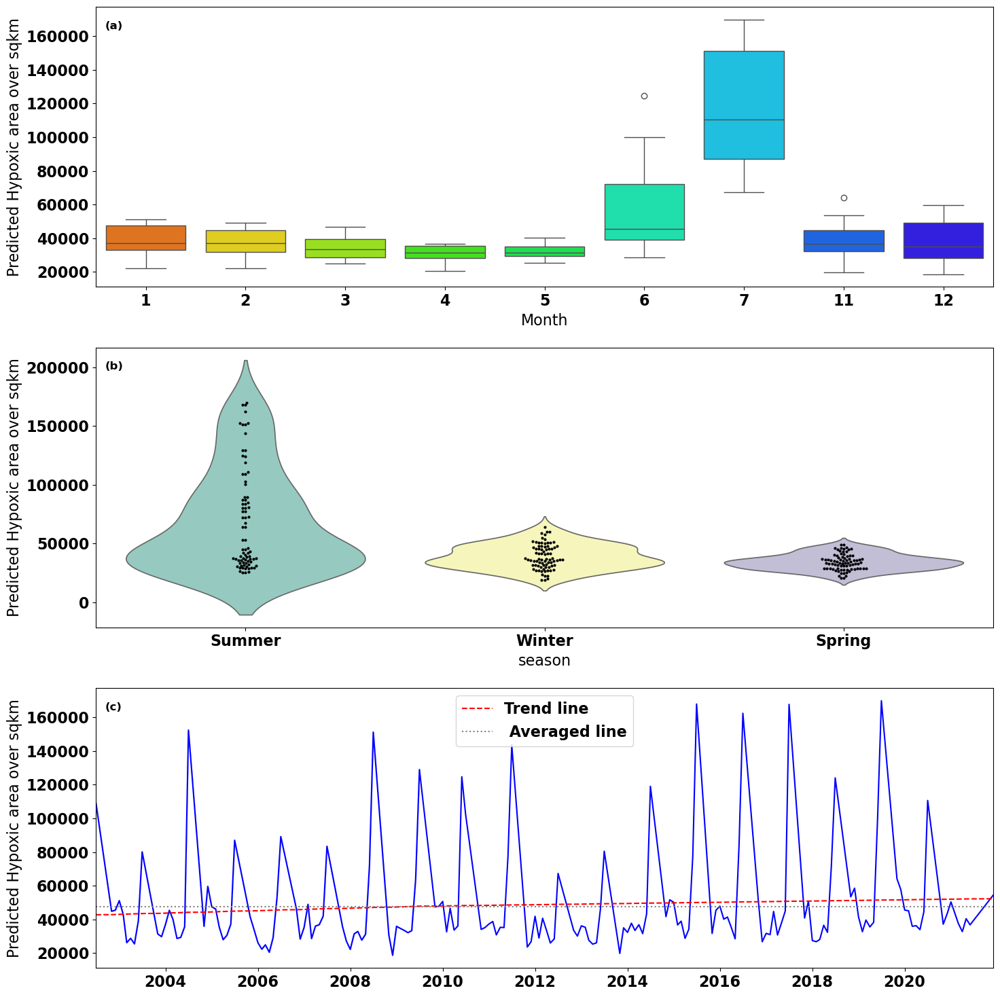

In [71]:

path=r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\Predicted rast"
# read csv
df_area=pd.read_csv(os.path.join(path,'area.csv'))
# select file, class_1_area_sqkm
df_hypo=df_area[['file','class_1_area_sqkm']]
# convert file to datetime
df_hypo['file']=pd.to_datetime(df_hypo['file'])
# sort by file
df_hypo.sort_values(by='file',inplace=True)
# Create a new column for the month
df_hypo['month'] = df_hypo['file'].dt.month

# Create a new column for the season
df_hypo['season'] = df_hypo['file'].dt.month%12 + 1
df_hypo['season'] = df_hypo['season'].apply(lambda x: 'Spring' if 3 <= x <= 5 else ('Summer' if 6 <= x <= 8 else ('Winter' if x == 12 or x <= 2 else None)))

# Remove rows with season as None (Autumn months)
df_hypo = df_hypo[df_hypo['season'].notna()]
palette = sns.color_palette("hsv", 12)

# Create a figure with two subplots
# font bold and 16
plt.rcParams.update({'font.size': 16, 'font.weight': 'bold'})
# Create a figure with three subplots
fig, (ax3, ax2, ax1) = plt.subplots(3, 1, figsize=(15,15))

# Create boxplot for each month on the third subplot
sns.boxplot(x='month', y='class_1_area_sqkm', data=df_hypo, ax=ax3,palette=palette)
# xticks Jan, Feb, Mar, Apr, May, Jun, Jul, Aug, Sep, Oct, Nov, Dec
#ax3.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
ax3.set_ylabel('Predicted Hypoxic area over sqkm')
ax3.set_xlabel('Month')
# add annotation (c)
ax3.annotate('(a)', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=12,horizontalalignment='left', verticalalignment='top')

# Create violinplots for each season on the second subplot
sns.violinplot(x='season', y='class_1_area_sqkm', data=df_hypo, ax=ax2, palette='Set3', inner=None)
sns.swarmplot(x='season', y='class_1_area_sqkm', data=df_hypo, ax=ax2, color='k', size=3)
ax2.set_ylabel('Predicted Hypoxic area over sqkm')
# add annotation (b)
ax2.annotate('(b)', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=12,
            horizontalalignment='left', verticalalignment='top')

# Plot the data on the first subplot
sns.lineplot(x=df_hypo['file'], y=df_hypo['class_1_area_sqkm'], ax=ax1, color='blue')
ax1.set_xlim(df_hypo['file'].min(),df_hypo['file'].max())
z = np.polyfit(range(len(df_hypo)), df_hypo['class_1_area_sqkm'], 1)
p = np.poly1d(z)
ax1.plot(df_hypo['file'],p(range(len(df_hypo))),"r--",label='Trend line')
mean_val = df_hypo['class_1_area_sqkm'].mean()
ax1.axhline(mean_val, color='gray', linestyle='dotted',label=' Averaged line')
ax1.set_ylabel('Predicted Hypoxic area over sqkm')
#no xlabel
ax1.set_xlabel('')
# add annotation (a)
ax1.annotate('(c)', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=12,
            horizontalalignment='left', verticalalignment='top')
ax1.legend(loc='upper center')


plt.tight_layout()
# save fig
plt.savefig(r'C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\figure\seasonal_analysis_v2.jpg',dpi=600,bbox_inches='tight')
plt.show()

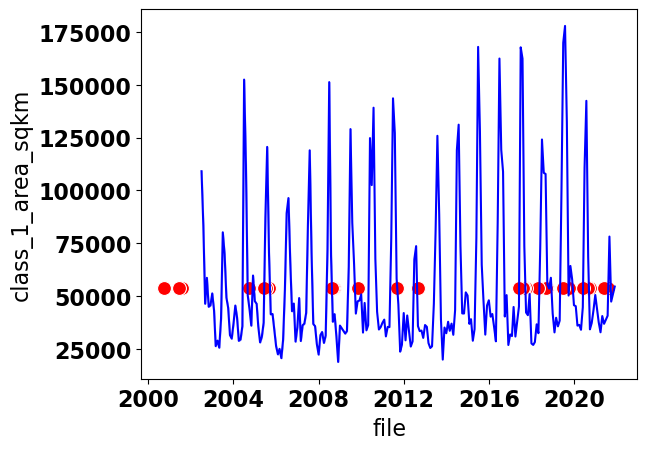

In [90]:

path=r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\Predicted rast"
# read csv
df_area=pd.read_csv(os.path.join(path,'area.csv'))
# select file, class_1_area_sqkm
df_hypo=df_area[['file','class_1_area_sqkm']]
# convert file to datetime
df_hypo['file']=pd.to_datetime(df_hypo['file'])
# sort by file
df_hypo.sort_values(by='file',inplace=True)
# Create a new column for the month
df_hypo['month'] = df_hypo['file'].dt.month
# D:\my works\bloom\data\Hurricane.csv
hurrican=pd.read_csv(r'C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\Hurricane.csv')
# convert Date column to datetime
# Create a function to convert dates
def convert_date(date):
    for fmt in ('%b-%Y', '%d-%b-%Y'):
        try:
            return pd.to_datetime(date, format=fmt)
        except ValueError:
            pass
    return pd.NaT  # Return not-a-time for invalid dates

# Apply the function to the Date column
hurrican['Date'] = hurrican['Date'].apply(convert_date)
sns.lineplot(x=df_hypo['file'], y=df_hypo['class_1_area_sqkm'], color='blue')

# Create a new column in hurricane data for plotting on y-axis
hurrican['class_1_area_sqkm'] = df_hypo['class_1_area_sqkm'].mean()  # or any other value you want to use

# Add the hurricane data as dot markers
sns.scatterplot(x=hurrican['Date'], y=hurrican['class_1_area_sqkm'], color='red', s=100)
# Show the plot
plt.show()

C:\Users\hafez\AppData\Local\Temp\ipykernel_22792\2661233499.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='month', y='class_1_area_sqkm', data=df_hypo, ax=ax3,palette=palette)
C:\Users\hafez\AppData\Local\Temp\ipykernel_22792\2661233499.py:26: UserWarning: The palette list has more values (12) than needed (9), which may not be intended.
  sns.boxplot(x='month', y='class_1_area_sqkm', data=df_hypo, ax=ax3,palette=palette)
C:\Users\hafez\AppData\Local\Temp\ipykernel_22792\2661233499.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='season', y='class_1_area_sqkm', data=df_hypo, ax=ax2, palette='Set3', inner=None)


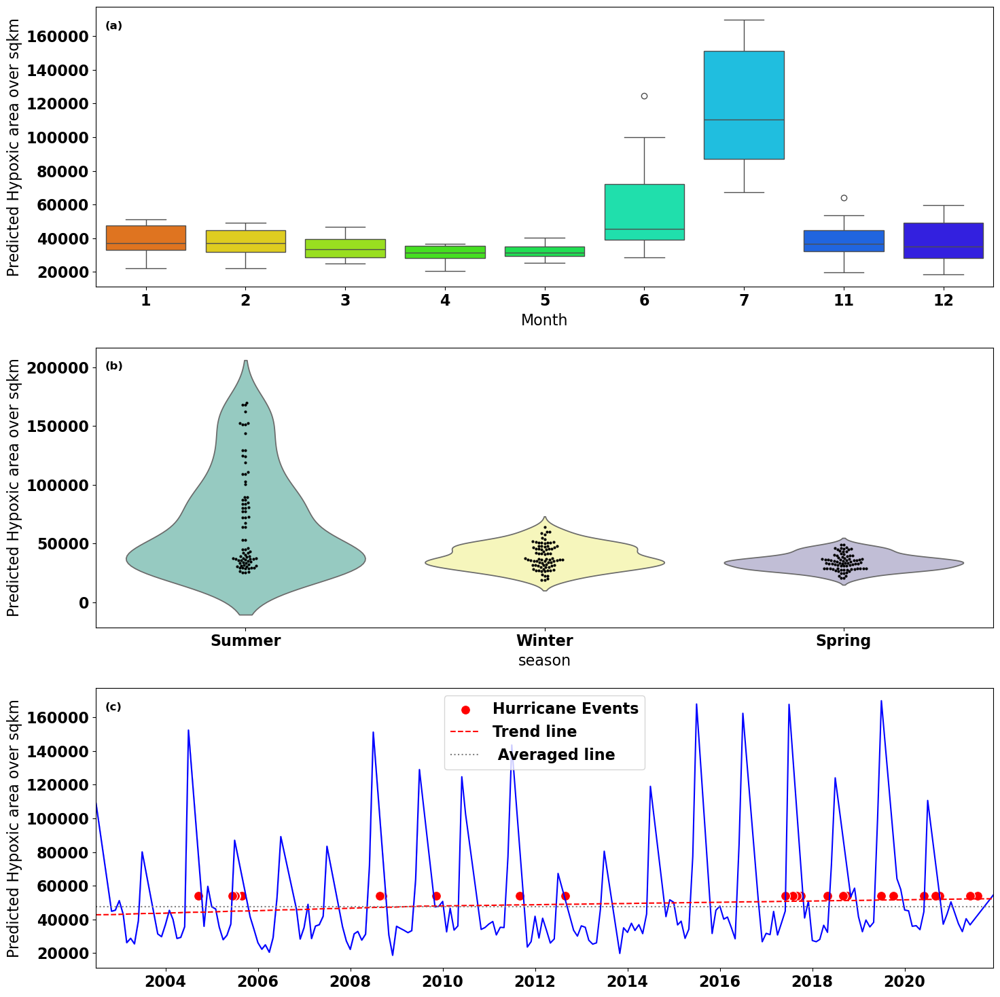

In [93]:

path=r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\Predicted rast"
# read csv
df_area=pd.read_csv(os.path.join(path,'area.csv'))
# select file, class_1_area_sqkm
df_hypo=df_area[['file','class_1_area_sqkm']]
# convert file to datetime
df_hypo['file']=pd.to_datetime(df_hypo['file'])
# sort by file
df_hypo.sort_values(by='file',inplace=True)
# Create a new column for the month
df_hypo['month'] = df_hypo['file'].dt.month

# Create a new column for the season
df_hypo['season'] = df_hypo['file'].dt.month%12 + 1
df_hypo['season'] = df_hypo['season'].apply(lambda x: 'Spring' if 3 <= x <= 5 else ('Summer' if 6 <= x <= 8 else ('Winter' if x == 12 or x <= 2 else None)))

# Remove rows with season as None (Autumn months)
df_hypo = df_hypo[df_hypo['season'].notna()]
palette = sns.color_palette("hsv", 12)

# Create a figure with two subplots
# Create a figure with three subplots
fig, (ax3, ax2, ax1) = plt.subplots(3, 1, figsize=(15,15))

# Create boxplot for each month on the third subplot
sns.boxplot(x='month', y='class_1_area_sqkm', data=df_hypo, ax=ax3,palette=palette)
# xticks Jan, Feb, Mar, Apr, May, Jun, Jul, Aug, Sep, Oct, Nov, Dec
#ax3.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
ax3.set_ylabel('Predicted Hypoxic area over sqkm')
ax3.set_xlabel('Month')
# add annotation (c)
ax3.annotate('(a)', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=12,horizontalalignment='left', verticalalignment='top')

# Create violinplots for each season on the second subplot
sns.violinplot(x='season', y='class_1_area_sqkm', data=df_hypo, ax=ax2, palette='Set3', inner=None)
sns.swarmplot(x='season', y='class_1_area_sqkm', data=df_hypo, ax=ax2, color='k', size=3)
ax2.set_ylabel('Predicted Hypoxic area over sqkm')
# add annotation (b)
ax2.annotate('(b)', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=12,
            horizontalalignment='left', verticalalignment='top')

# Plot the data on the first subplot
sns.lineplot(x=df_hypo['file'], y=df_hypo['class_1_area_sqkm'], ax=ax1, color='blue')
sns.scatterplot(x=hurrican['Date'], y=hurrican['class_1_area_sqkm'], color='red', s=100,ax=ax1, label='Hurricane Events')
ax1.set_xlim(df_hypo['file'].min(),df_hypo['file'].max())
z = np.polyfit(range(len(df_hypo)), df_hypo['class_1_area_sqkm'], 1)
p = np.poly1d(z)
ax1.plot(df_hypo['file'],p(range(len(df_hypo))),"r--",label='Trend line')
mean_val = df_hypo['class_1_area_sqkm'].mean()
ax1.axhline(mean_val, color='gray', linestyle='dotted',label=' Averaged line')
ax1.set_ylabel('Predicted Hypoxic area over sqkm')
#no xlabel
ax1.set_xlabel('')
# add annotation (a)
ax1.annotate('(c)', xy=(0.01, 0.95), xycoords='axes fraction', fontsize=12,
            horizontalalignment='left', verticalalignment='top')
ax1.legend(loc='upper center')


plt.tight_layout()
# save fig
plt.savefig(r'C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\figure\seasonal_analysis_v3.jpg',dpi=600,bbox_inches='tight')
plt.show()

In [11]:
df_hypo['month'].sort_values().unique()

array([ 1,  2,  3,  4,  5,  6,  7, 11, 12])

In [68]:
# generate table for seasonal: mean, max, min, std,cv
#df_hypo[['class_1_area_sqkm','season']].groupby('season').agg(['mean', 'max', 'min', 'std']).T
# calculate coefficient of variation
# Filter the data to include only the years 2000 to 2020
df_hypo = df_hypo[(df_hypo['file'].dt.year >= 2000) & (df_hypo['file'].dt.year < 2021)]

# Create a new column for the decade
df_hypo['decade'] = (df_hypo['file'].dt.year//10)*10

# Group by decade and calculate the change in hypoxic area
df_decadal_change = df_hypo.groupby('decade')['class_1_area_sqkm'].agg(lambda x: x.max() - x.min())

df_decadal_change


decade
2000    133709.66385
2010    150044.71352
2020     76709.38701
Name: class_1_area_sqkm, dtype: float64

Path: D:\my works\bloom\data\Predicted rast
Rasters: ['D:\\my works\\bloom\\data\\Predicted rast\\OCEANDATA_MODIS-Aqua_L3SMI2021-01-01_XGB.tif', 'D:\\my works\\bloom\\data\\Predicted rast\\OCEANDATA_MODIS-Aqua_L3SMI2021-02-01_XGB.tif', 'D:\\my works\\bloom\\data\\Predicted rast\\OCEANDATA_MODIS-Aqua_L3SMI2021-03-01_XGB.tif', 'D:\\my works\\bloom\\data\\Predicted rast\\OCEANDATA_MODIS-Aqua_L3SMI2021-04-01_XGB.tif', 'D:\\my works\\bloom\\data\\Predicted rast\\OCEANDATA_MODIS-Aqua_L3SMI2021-05-01_XGB.tif', 'D:\\my works\\bloom\\data\\Predicted rast\\OCEANDATA_MODIS-Aqua_L3SMI2021-06-01_XGB.tif', 'D:\\my works\\bloom\\data\\Predicted rast\\OCEANDATA_MODIS-Aqua_L3SMI2021-08-01_XGB.tif', 'D:\\my works\\bloom\\data\\Predicted rast\\OCEANDATA_MODIS-Aqua_L3SMI2021-09-01_XGB.tif', 'D:\\my works\\bloom\\data\\Predicted rast\\OCEANDATA_MODIS-Aqua_L3SMI2021-10-01_XGB.tif', 'D:\\my works\\bloom\\data\\Predicted rast\\OCEANDATA_MODIS-Aqua_L3SMI2021-12-01_XGB.tif']


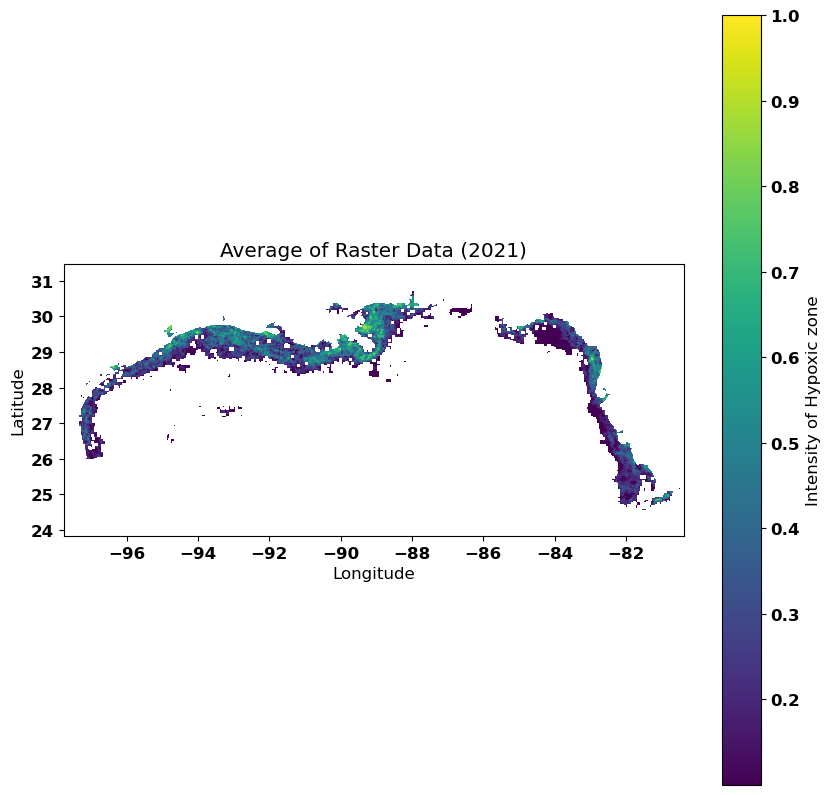

In [34]:
# plot rasterio
import rasterio
import rasterio.plot
path=r"D:\my works\bloom\data\Predicted rast"
# in path  select only 2021 contain files
rasters=glob.glob(os.path.join(path,'*2021*.tif'))
print(f'Path: {path}')
rasters=glob.glob(os.path.join(path,'*2021*.tif'))
print(f'Rasters: {rasters}')
# Read all files and create an array stack
array_stack = []
for raster in rasters:
    with rasterio.open(raster) as src:
        array = src.read(1)
        array_stack.append(array)

# Stack arrays along the first axis
array_stack = np.stack(array_stack, axis=0)

# Calculate the average
array_avg = np.nanmean(array_stack, axis=0)  # Use np.nanmean to ignore NaN values
# remove 0 values
array_avg[array_avg==0]=np.nan

# Extract geospatial information
with rasterio.open(rasters[0]) as src:
    transform = src.transform
    crs = src.crs
# Plot
plt.figure(figsize=(10, 10))
plt.imshow(array_avg, extent=rasterio.plot.plotting_extent(src), cmap='viridis')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(label='Intensity of Hypoxic zone')
plt.title('Average of Raster Data (2021)')
plt.show()

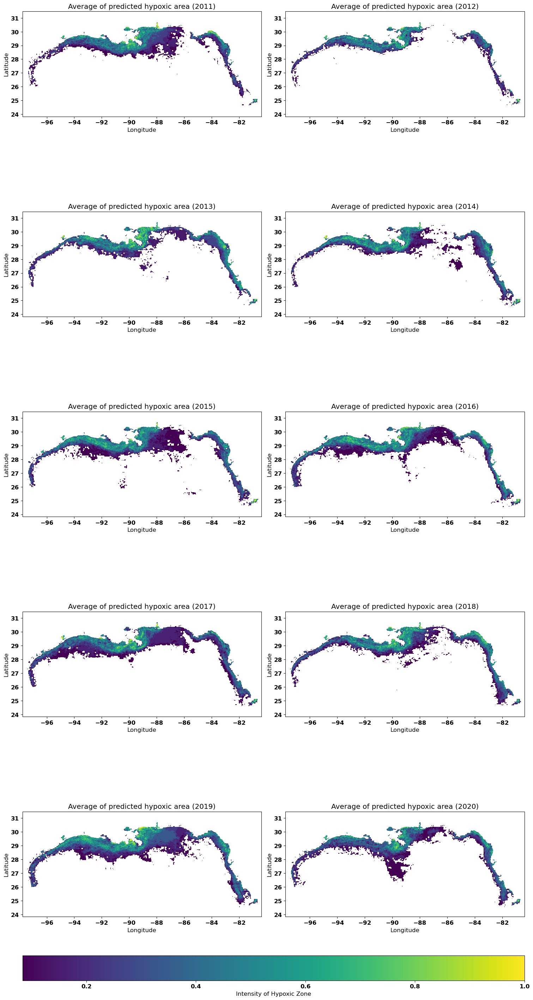

In [ ]:
import matplotlib.pyplot as plt
import rasterio
import rasterio.plot
import numpy as np
import glob
import os

path = r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\Predicted rast"
saved_file=r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\averagedPredicted"
fig, axs = plt.subplots(5, 2, figsize=(15, 30), constrained_layout=True)  # Create a figure with 10 subplots
axs = axs.ravel()  # Flatten the array of axes

# Define a variable to store the maximum intensity of the hypoxic zone across all plots
max_intensity = 0

for i, year in enumerate(range(2011, 2021)):
    # Select only files containing the current year
    rasters = glob.glob(os.path.join(path, f'*{year}*.tif'))

    # Read all files and create an array stack
    array_stack = []
    for raster in rasters:
        with rasterio.open(raster) as src:
            array = src.read(1)
            array_stack.append(array)

    # Stack arrays along the first axis
    array_stack = np.stack(array_stack, axis=0)

    # Calculate the average
    array_avg = np.nanmean(array_stack, axis=0)  # Use np.nanmean to ignore NaN values
    array_avg[array_avg == 0] = np.nan  # Remove 0 values

    # Extract geospatial information
    with rasterio.open(rasters[0]) as src:
        transform = src.transform
        crs = src.crs

    # Plot on the current subplot
    im = axs[i].imshow(array_avg, extent=rasterio.plot.plotting_extent(src), cmap='viridis')
    axs[i].set_xlabel('Longitude')
    axs[i].set_ylabel('Latitude')
    axs[i].set_title(f'Average of predicted hypoxic area ({year})')

    # Update max_intensity if necessary
    max_intensity = max(max_intensity, np.nanmax(array_avg))

# Add a colorbar to the figure
cbar = fig.colorbar(im, ax=axs, orientation='horizontal', pad=0.02)
cbar.set_label('Intensity of Hypoxic Zone')
# save fig
plt.savefig(r'D:\my works\bloom\figure\average_raster_data.jpg',dpi=600,bbox_inches='tight')
plt.show()
# clean memory
del array_stack, array_avg, transform, crs, im, cbar

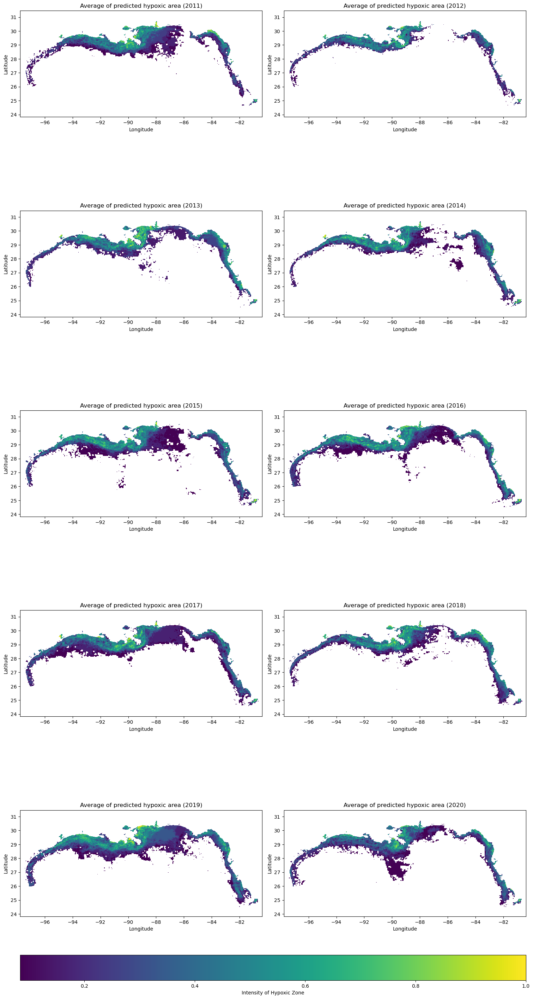

In [24]:
import matplotlib.pyplot as plt
import rasterio
import rasterio.plot
import numpy as np
import glob
import os

path = r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\Predicted rast"
saved_file=r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\averagedPredicted"
fig, axs = plt.subplots(5, 2, figsize=(15, 30), constrained_layout=True)  # Create a figure with 10 subplots
axs = axs.ravel()  # Flatten the array of axes

# Define a variable to store the maximum intensity of the hypoxic zone across all plots
max_intensity = 0

for i, year in enumerate(range(2011, 2021)):
    # Select only files containing the current year
    rasters = glob.glob(os.path.join(path, f'*{year}*.tif'))

    # Read all files and create an array stack
    array_stack = []
    for raster in rasters:
        with rasterio.open(raster) as src:
            array = src.read(1)
            array_stack.append(array)

    # Stack arrays along the first axis
    array_stack = np.stack(array_stack, axis=0)

    # Calculate the average
    array_avg = np.nanmean(array_stack, axis=0)  # Use np.nanmean to ignore NaN values
    array_avg[array_avg == 0] = np.nan  # Remove 0 values

    # Extract geospatial information
    with rasterio.open(rasters[0]) as src:
        transform = src.transform
        crs = src.crs

    # Plot on the current subplot
    im = axs[i].imshow(array_avg, extent=rasterio.plot.plotting_extent(src), cmap='viridis')
    axs[i].set_xlabel('Longitude')
    axs[i].set_ylabel('Latitude')
    axs[i].set_title(f'Average of predicted hypoxic area ({year})')

    # Update max_intensity if necessary
    max_intensity = max(max_intensity, np.nanmax(array_avg))

# Add a colorbar to the figure
cbar = fig.colorbar(im, ax=axs, orientation='horizontal', pad=0.02)
cbar.set_label('Intensity of Hypoxic Zone')
# save fig
#plt.savefig(r'D:\my works\bloom\figure\average_raster_data.jpg',dpi=600,bbox_inches='tight')
plt.show()
# clean memory
del array_stack, array_avg, transform, crs, im, cbar

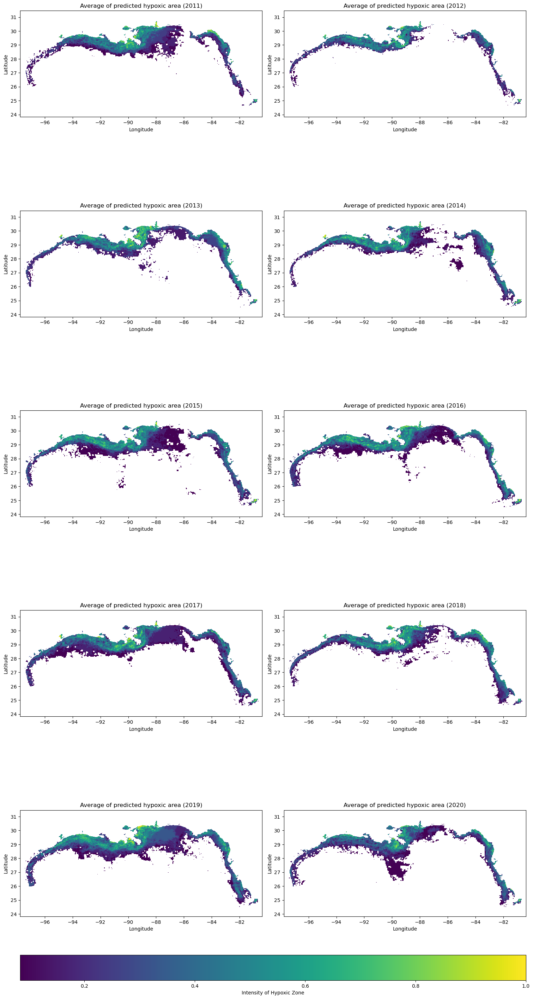

In [ ]:
import matplotlib.pyplot as plt
import rasterio
import rasterio.plot
import numpy as np
import glob
import os

path = r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\Predicted rast"
saved_file = r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\averagedPredicted"
os.makedirs(saved_file, exist_ok=True)

fig, axs = plt.subplots(5, 2, figsize=(15, 30), constrained_layout=True)
axs = axs.ravel()

max_intensity = 0

for i, year in enumerate(range(2011, 2021)):
    rasters = glob.glob(os.path.join(path, f'*{year}*.tif'))
    if not rasters:
        continue

    array_stack = []
    for raster in rasters:
        with rasterio.open(raster) as src:
            array = src.read(1)
            array_stack.append(array)

    array_stack = np.stack(array_stack, axis=0)
    array_avg = np.nanmean(array_stack, axis=0)
    array_avg[array_avg == 0] = np.nan

    # Extract geospatial info from the first raster
    with rasterio.open(rasters[0]) as src:
        transform = src.transform
        crs = src.crs
        meta = src.meta.copy()
        meta.update({
            "count": 1,
            "dtype": array_avg.dtype,
            "height": array_avg.shape[0],
            "width": array_avg.shape[1],
            "transform": transform,
            "crs": crs
        })

    # Save the averaged raster as GeoTIFF
    # out_tif = os.path.join(saved_file, f'average_predicted_hypoxic_{year}.tif')
    # with rasterio.open(out_tif, 'w', **meta) as dst:
    #     dst.write(array_avg, 1)

    # Plot on the current subplot
    im = axs[i].imshow(array_avg, extent=rasterio.plot.plotting_extent(src), cmap='viridis')
    axs[i].set_xlabel('Longitude')
    axs[i].set_ylabel('Latitude')
    axs[i].set_title(f'Average of predicted hypoxic area ({year})')

    max_intensity = max(max_intensity, np.nanmax(array_avg))

cbar = fig.colorbar(im, ax=axs, orientation='horizontal', pad=0.02)
cbar.set_label('Intensity of Hypoxic Zone')
plt.show()
del array_stack, array_avg, transform, crs, im, cbar

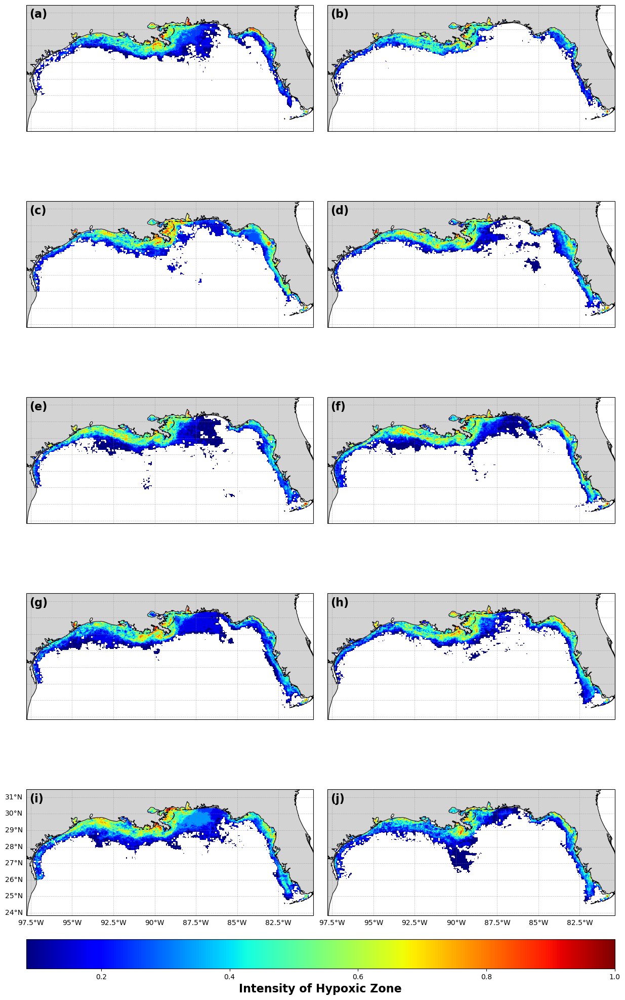

In [47]:
import matplotlib.pyplot as plt
import rasterio
import rasterio.plot
import numpy as np
import glob
import os
import cartopy.crs as ccrs
import cartopy.feature as cfeature

path = r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\Predicted rast"
saved_file = r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\averagedPredicted"
os.makedirs(saved_file, exist_ok=True)

fig, axs = plt.subplots(5, 2, figsize=(15, 30), 
                        gridspec_kw={'wspace': 0.05, 'hspace': 0.05},  # Reduce space between plots
                        subplot_kw={'projection': ccrs.PlateCarree()})
axs = axs.ravel()

for i, year in enumerate(range(2011, 2021)):
    rasters = glob.glob(os.path.join(path, f'*{year}*.tif'))
    if not rasters:
        continue

    array_stack = []
    for raster in rasters:
        with rasterio.open(raster) as src:
            array = src.read(1)
            array_stack.append(array)

    array_stack = np.stack(array_stack, axis=0)
    array_avg = np.nanmean(array_stack, axis=0)
    array_avg[array_avg == 0] = np.nan

    with rasterio.open(rasters[0]) as src:
        extent = rasterio.plot.plotting_extent(src)
        im = axs[i].imshow(array_avg, extent=extent, cmap='jet', transform=ccrs.PlateCarree())
        # Add shorelines and land
        axs[i].add_feature(cfeature.COASTLINE, linewidth=0.8, edgecolor='black', zorder=2)
        axs[i].add_feature(cfeature.LAND, facecolor='lightgrey', zorder=0)
        axs[i].set_title('')
        axs[i].annotate(f'({chr(97+i)})', xy=(0.01, 0.97), xycoords='axes fraction',
                        fontsize=16, fontweight='bold', ha='left', va='top')
        # add gridlines only left and bottom  and no labels in right and top
        # no labels on right and top
        gl = axs[i].gridlines(draw_labels=True, linewidth=0.5, color='gray',
                      alpha=0.5, linestyle='--', zorder=3)
        gl.top_labels = False
        gl.right_labels = False
         # Only show bottom x-labels for bottom row (i.e., i >= 8)
        gl.bottom_labels = True if i >= 8 else False

        # Only show left y-labels for the bottom-left subplot (i == 8)
        gl.left_labels = True if i == 8 else False
        gl.xlabel_style = {'size': 10}
        gl.ylabel_style = {'size': 10}

        # # Only first column gets xlabel and xticks
        # if i % 2 == 0:
        #     axs[i].set_xlabel('Longitude')
        #     #axs[i].set_xticks(np.linspace(extent[0], extent[1], 4))
        # else:
        #     axs[i].set_xlabel('')
        #     axs[i].set_xticks([])
        # # Only last plot of first column gets ylabel and yticks
        # if i == 8:
        #     axs[i].set_ylabel('Latitude')
        #     #axs[i].set_yticks(np.linspace(extent[2], extent[3], 4))
        # else:
        #     axs[i].set_ylabel('')
        #     axs[i].set_yticks([])
        # # Remove ticks for all other plots
        # if i % 2 == 1 or i != 8:
        #     axs[i].tick_params(left=False, bottom=False)

cbar = fig.colorbar(im, ax=axs, orientation='horizontal', pad=0.02)
cbar.set_label('Intensity of Hypoxic Zone', fontsize=16, fontweight='bold')
plt.show()
del array_stack, array_avg, im, cbar

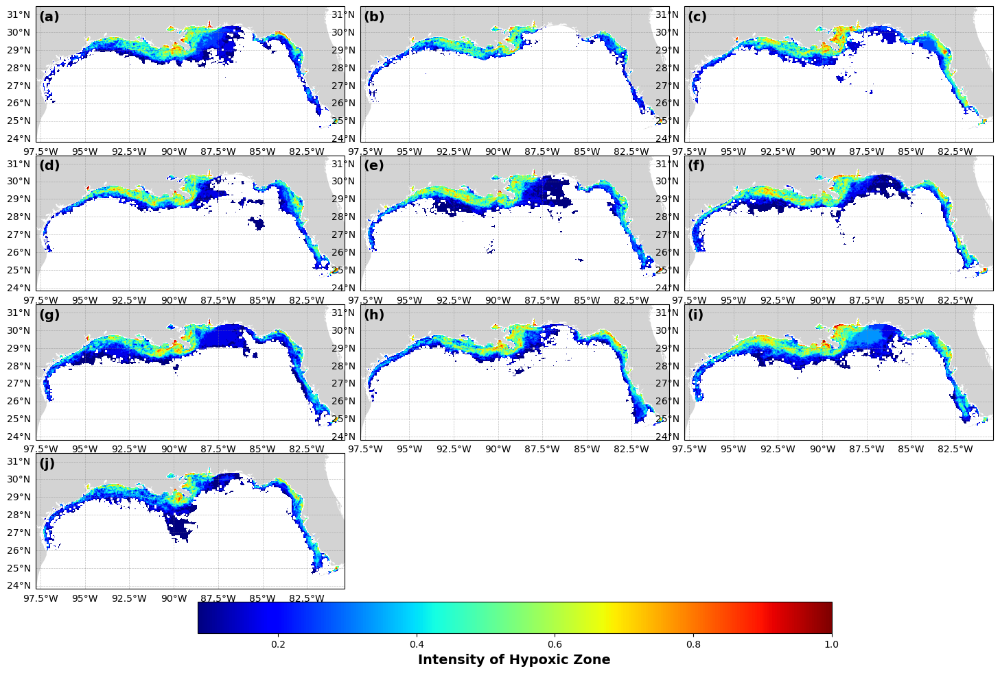

In [63]:
import matplotlib.pyplot as plt
import rasterio
import rasterio.plot
import numpy as np
import glob
import os
import cartopy.crs as ccrs
import cartopy.feature as cfeature

path = r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\Predicted rast"
saved_file = r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\averagedPredicted"
os.makedirs(saved_file, exist_ok=True)

fig, axs = plt.subplots(4, 3, figsize=(18, 12),
                        gridspec_kw={'wspace': 0.05, 'hspace': 0.05},
                        subplot_kw={'projection': ccrs.PlateCarree()})
axs = axs.ravel()

years = list(range(2011, 2021))[:12]  # 12 years for 3x4 grid

for i, year in enumerate(years):
    rasters = glob.glob(os.path.join(path, f'*{year}*.tif'))
    if not rasters:
        axs[i].axis('off')
        continue

    array_stack = []
    for raster in rasters:
        with rasterio.open(raster) as src:
            array = src.read(1)
            array_stack.append(array)

    array_stack = np.stack(array_stack, axis=0)
    array_avg = np.nanmean(array_stack, axis=0)
    array_avg[array_avg == 0] = np.nan

    with rasterio.open(rasters[0]) as src:
        extent = rasterio.plot.plotting_extent(src)
        im = axs[i].imshow(array_avg, extent=extent, cmap='jet', transform=ccrs.PlateCarree())
        #axs[i].add_feature(cfeature.COASTLINE, linewidth=0.8, edgecolor='black', zorder=2)
        axs[i].add_feature(cfeature.LAND, facecolor='lightgrey', zorder=0)
        #axs[i].set_title(f'{year}', fontsize=12, fontweight='bold')
        axs[i].annotate(f'({chr(97+i)})', xy=(0.01, 0.97), xycoords='axes fraction',
                        fontsize=14, fontweight='bold', ha='left', va='top')

        # Gridlines: only left and bottom, no right/top labels
        gl = axs[i].gridlines(draw_labels=True, linewidth=0.5, color='gray',
                              alpha=0.5, linestyle='--', zorder=2)
        gl.xlabel_style = {'size': 10}
        gl.ylabel_style = {'size': 10}
        # grid label inside the plot
        gl.xlabels_top = False
        gl.ylabels_right = False
        gl.top_labels = False
        gl.right_labels = False
    
        

# Hide any unused subplots
for j in range(len(years), len(axs)):
    axs[j].axis('off')

cbar = fig.colorbar(im, ax=axs, orientation='horizontal', pad=0.02, fraction=0.05)
cbar.set_label('Intensity of Hypoxic Zone', fontsize=14, fontweight='bold')
plt.show()
del array_stack, array_avg, im, cbar

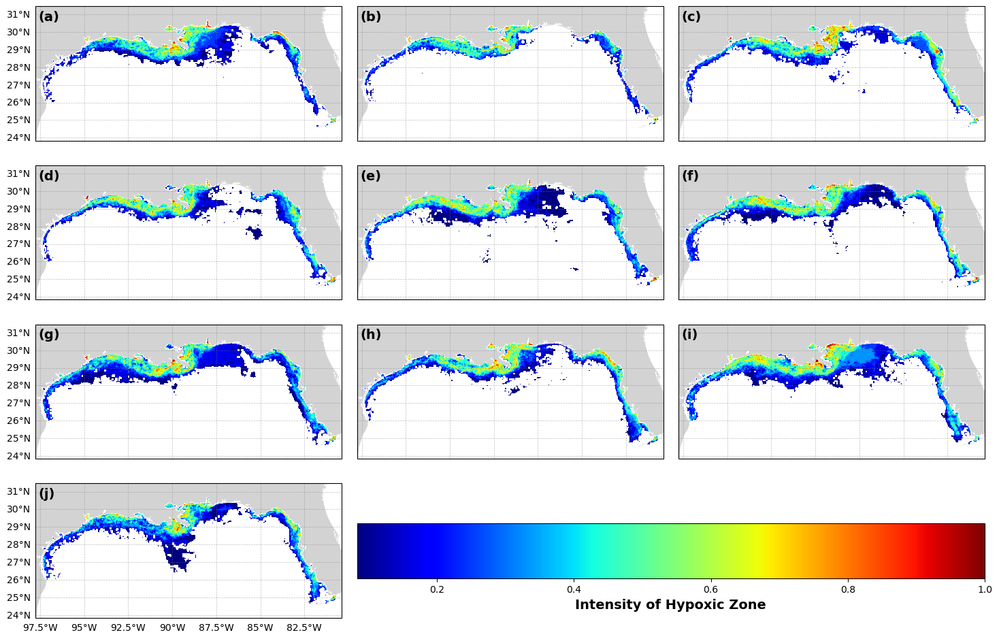

In [68]:
import matplotlib.pyplot as plt
import rasterio
import rasterio.plot
import numpy as np
import glob
import os
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from mpl_toolkits.axes_grid1 import make_axes_locatable

path = r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\Predicted rast"
saved_file = r"C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\averagedPredicted"
os.makedirs(saved_file, exist_ok=True)

fig, axs = plt.subplots(4, 3, figsize=(18, 12),
                        gridspec_kw={'wspace': 0.05, 'hspace': 0.05},
                        subplot_kw={'projection': ccrs.PlateCarree()})
axs = axs.ravel()

years = list(range(2011, 2021))[:12]  # 12 years for 3x4 grid

im = None  # Initialize im for colorbar

for i, year in enumerate(years):
    rasters = glob.glob(os.path.join(path, f'*{year}*.tif'))
    if not rasters:
        axs[i].axis('off')
        continue

    array_stack = []
    for raster in rasters:
        with rasterio.open(raster) as src:
            array = src.read(1)
            array_stack.append(array)

    array_stack = np.stack(array_stack, axis=0)
    array_avg = np.nanmean(array_stack, axis=0)
    array_avg[array_avg == 0] = np.nan

    with rasterio.open(rasters[0]) as src:
        extent = rasterio.plot.plotting_extent(src)
        im = axs[i].imshow(array_avg, extent=extent, cmap='jet', transform=ccrs.PlateCarree())
        #axs[i].add_feature(cfeature.COASTLINE, linewidth=0.8, edgecolor='black', zorder=2)
        axs[i].add_feature(cfeature.LAND, facecolor='lightgrey', zorder=0)
        axs[i].annotate(f'({chr(97+i)})', xy=(0.01, 0.97), xycoords='axes fraction',
                        fontsize=14, fontweight='bold', ha='left', va='top')

        # Gridlines: only left and bottom, no right/top labels
        gl = axs[i].gridlines(draw_labels=True, linewidth=0.5, color='gray',
                              alpha=0.5, linestyle='--', zorder=3)
        gl.top_labels = False
        gl.right_labels = False
        gl.xlabel_style = {'size': 10}
        gl.ylabel_style = {'size': 10}
        gl.left_labels = (i % 3 == 0)
        gl.bottom_labels = (i // 3 == 3)
        if not gl.left_labels:
            axs[i].set_yticks([])
        if not gl.bottom_labels:
            axs[i].set_xticks([])

# Hide any unused subplots
for j in range(len(years), len(axs)):
    axs[j].axis('off')

# Place colorbar in the last two empty subplots (axs[9] and axs[10])
from matplotlib.gridspec import GridSpec
gs = axs[0].get_gridspec()
# Remove the last two axes to make space for colorbar


# Create a new axis spanning the last row, columns 1 and 2
cax = fig.add_subplot(gs[3, 1:3])
cbar = fig.colorbar(im, cax=cax, orientation='horizontal', aspect=30)
cbar.set_label('Intensity of Hypoxic Zone', fontsize=14, fontweight='bold')
cax.set_aspect(0.08)  # Lower value = thinner
# save fig
plt.savefig(os.path.join(saved_file, 'average_predicted_hypoxic_2011_2020.jpg'), dpi=600, bbox_inches='tight')
plt.show()
del array_stack, array_avg, im, cbar
# caption: Average predicted hypoxic zone intensity from 2011 to 2020:Here

In [16]:
from scipy.stats import wilcoxon

# Performance metrics for each classifier
metrics = {
    "XGBoost": [92.62, 92.85, 92.62, 92.60],
    "RF": [92.48, 92.73, 92.48, 92.46],
    "KNN": [91.64, 92.05, 91.64, 91.61],
    "DT": [90.67, 90.75, 90.67, 90.66],
    "SVM": [88.30, 89.96, 88.30, 88.15],
    "MLP": [88.02, 89.48, 88.02, 87.88],
    "LR": [88.02, 89.97, 88.02, 87.84],
    "NB": [82.59, 82.61, 82.59, 82.58],
    "ANN": [87.88, 81.00, 99.00, 89.00]
}

# List of classifier names
classifiers = list(metrics.keys())

# Conduct pairwise Wilcoxon signed-rank tests
results = {}
for i in range(len(classifiers)):
    for j in range(i+1, len(classifiers)):
        clf1 = classifiers[i]
        clf2 = classifiers[j]
        stat, p = wilcoxon(metrics[clf1], metrics[clf2])
        results[(clf1, clf2)] = p

# Print the p-values for all pairs
# print("P-values for all pairs:")
# for pair, p in results.items():
#     print(f"{pair}: {p}")

# Set the significance level
alpha = 0.05

# Find the pairs with p-values less than alpha
significant_pairs = {pair: p for pair, p in results.items() if p < alpha}
# Print the significant pairs
# print("\nSignificant pairs (p < 0.05):")
# for pair, p in significant_pairs.items():
#     print(f"{pair}: {p}")
#  make pandas dataframe
df_results=pd.DataFrame(results.items(),columns=['pair','p-value'])
# filter which p-value less than alpha
df_results[df_results['p-value']<alpha]
df_results

c:\Users\hp\miniconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  res = hypotest_fun_out(*samples, **kwds)
c:\Users\hp\miniconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: Sample size too small for normal approximation.
  res = hypotest_fun_out(*samples, **kwds)


,pair,p-value
0,"(XGBoost, RF)",0.125000
1,"(XGBoost, KNN)",0.125000
2,"(XGBoost, DT)",0.125000
3,"(XGBoost, SVM)",0.125000
4,"(XGBoost, MLP)",0.125000
5,"(XGBoost, LR)",0.125000
6,"(XGBoost, NB)",0.125000
7,"(XGBoost, ANN)",0.625000
8,"(RF, KNN)",0.125000
9,"(RF, DT)",0.125000


C:\Users\hp\AppData\Local\Temp\ipykernel_15404\1024067774.py:5: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_hurricane['Date']=pd.to_datetime(df_hurricane['Date'])


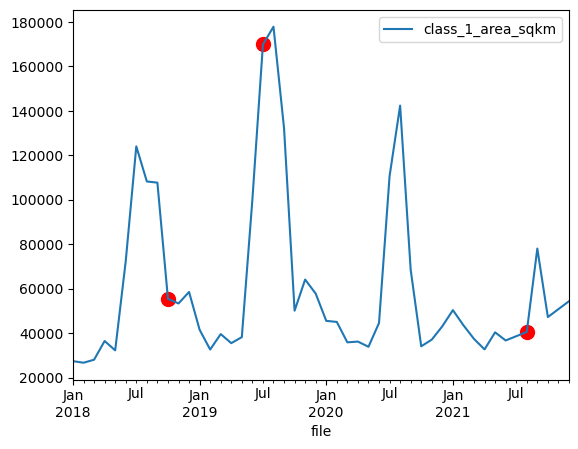

In [35]:
path_hu=r"D:\my works\bloom\data\Hurricane.csv"
# read csv
df_hurricane=pd.read_csv(path_hu)
# convert Date column to datetime
df_hurricane['Date']=pd.to_datetime(df_hurricane['Date'])
# keep only month-year
df_hurricane['Date']=df_hurricane['Date'].dt.to_period('M')
df_hurricane.head()
path=r"D:\my works\bloom\data\Predicted rast"
# # read csv
df_area=pd.read_csv(os.path.join(path,'area.csv'))
# select file, class_1_area_sqkm
df_hypo=df_area[['file','class_1_area_sqkm']]
# convert file to datetime
df_hypo['file']=pd.to_datetime(df_hypo['file'])
#  keep only month-year
df_hypo['file']=df_hypo['file'].dt.to_period('M')
# # merged df_hypo and df_hurricane
# df_merged=pd.merge(df_hypo,df_hurricane,left_on='file',right_on='Date',how='left')
# df_merged.head()
# plot between 2004 to 2005
df_hypo[df_hypo['file'].between('2018-01','2021-12')].plot(x='file',y='class_1_area_sqkm',kind='line')
# marker on  sep 2004,july 2005,aug 2005
plt.scatter(x=['2018-10','2019-07','2021-08'],y=[df_hypo.loc[df_hypo['file']=='2018-10','class_1_area_sqkm'].values[0],
                                                  df_hypo.loc[df_hypo['file']=='2019-07','class_1_area_sqkm'].values[0],
                                                  df_hypo.loc[df_hypo['file']=='2021-08','class_1_area_sqkm'].values[0]],color='red',s=100)

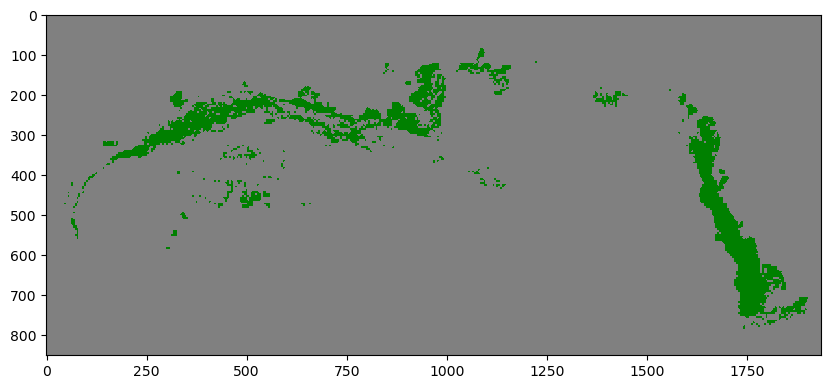

In [136]:
import matplotlib.colors as colors

# Create a custom colormap
cmap = colors.ListedColormap([ 'grey','green'])

# plot prediction
plt.figure(figsize=(10,10))
plt.imshow(prediction, cmap=cmap)

In [98]:
import tensorflow as tf

(2392, 14)
(2392, 14)


c:\Users\hafez\miniconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7517 - loss: 0.6052 - val_accuracy: 0.8774 - val_loss: 0.3888
Epoch 2/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8880 - loss: 0.3431 - val_accuracy: 0.8774 - val_loss: 0.3267
Epoch 3/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8696 - loss: 0.3359 - val_accuracy: 0.8802 - val_loss: 0.3096
Epoch 4/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8618 - loss: 0.3304 - val_accuracy: 0.8802 - val_loss: 0.2954
Epoch 5/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8755 - loss: 0.3076 - val_accuracy: 0.8635 - val_loss: 0.3369
Epoch 6/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8726 - loss: 0.3000 - val_accuracy: 0.8788 - val_loss: 0.2836
Epoch 7/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8789 - loss: 0.2971 - val_accuracy: 0.8802 - val_loss: 0.2859
Epoch 8/10
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8746 - loss: 0.2936 - val_accuracy: 0.8788 - val_loss:

              precision    recall  f1-score   support

           0       0.99      0.76      0.86       351
           1       0.81      0.99      0.89       367

    accuracy                           0.88       718
   macro avg       0.90      0.88      0.88       718
weighted avg       0.90      0.88      0.88       718

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8888 - loss: 0.2630
Test loss: 0.2768329977989197
Test accuracy: 0.8802228569984436


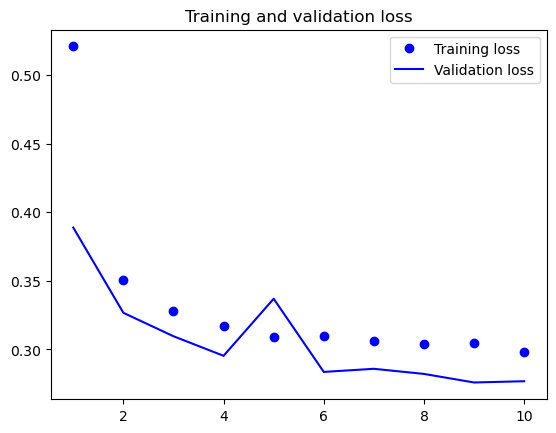

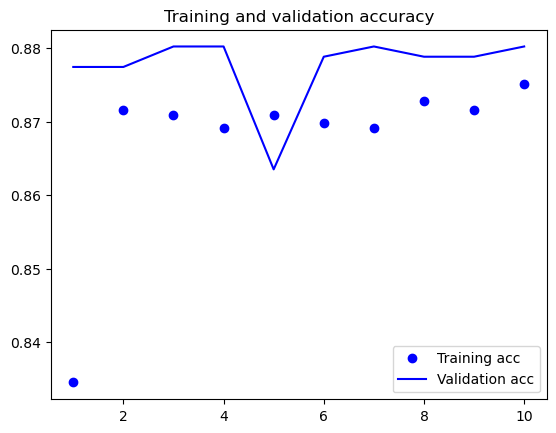

In [18]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv1D, MaxPooling1D
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report
import numpy as np,os,glob
import matplotlib.pyplot as plt
import pandas as pd

# path=r"/content/sample_data/"
# # find all "train" containing .csv files
# files = glob.glob(os.path.join(path, "*train*.csv"))
# # read first only
# df=pd.read_csv(files[0])
# print(df)
# df.drop(columns=['OID_', 'latitude', 'longitude', 'activitystartdate'], inplace=True)
# # read next all and rename columns based on first file columns
# for file in files[1:]:
#     df1 = pd.read_csv(file)
#     df1.drop(columns=['OID_', 'latitude', 'longitude', 'activitystartdate'], inplace=True)
#     df1.columns = df.columns
#     df = pd.concat([df, df1], ignore_index=True)
# # remove nan values
# df.dropna(inplace=True)
# print(df.shape)
# print(df.columns)
# print(df.head(2))

# # Define the feature columns and target variable
# feature_columns = ['chlor_a', 'nflh', 'poc', 'sst', 'Rrs_412',
#        'Rrs_443', 'Rrs_469', 'Rrs_488', 'Rrs_531', 'Rrs_547', 'Rrs_555',
#        'Rrs_645', 'Rrs_667', 'Rrs_678']
# target_column = 'resultmeasurevalue_mg_l'

# # Create a function to convert regression target to classification labels
# def convert_to_class(value):
#     #if value less 2 then 0 else 1 # 0:Hypoxic, 1:Nonhypoxic
#     return 0 if value < 2 else 1

# # Convert the target variable to classification labels
# df['class_label'] = df[target_column].apply(convert_to_class)
# # drop target column
# df.drop(columns=[target_column], inplace=True)
# print(df['class_label'].value_counts())
# from sklearn.utils import resample

# # Separate majority and minority classes
# df_majority = df[df.class_label==1]
# df_minority = df[df.class_label==0]

# # Downsample majority class
# df_majority_downsampled = resample(df_majority, 
#                                  replace=False,    # sample without replacement
#                                  n_samples=df_minority.shape[0],     # to match minority class
#                                  random_state=123) # reproducible results

# # Combine minority class with downsampled majority class
# df_balanced = pd.concat([df_minority, df_majority_downsampled])

# # Display new class counts
# print(df_balanced.class_label.value_counts())

# Load the data
# Define the feature columns and target variable
# feature_columns = ['chlor_a', 'nflh', 'poc', 'sst', 'Rrs_412',
#        'Rrs_443', 'Rrs_469', 'Rrs_488', 'Rrs_531', 'Rrs_547', 'Rrs_555',
#        'Rrs_645', 'Rrs_667', 'Rrs_678']
# target_column = 'resultmeasurevalue_mg_l'

# Separate features and target variable
X = df_balanced[feature_columns]
# normalize
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
print(X.shape)
y = df_balanced['class_label']
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

# Load the data
# Define the feature columns and target variable
# feature_columns = ['chlor_a', 'nflh', 'poc', 'sst', 'Rrs_412',
#        'Rrs_443', 'Rrs_469', 'Rrs_488', 'Rrs_531', 'Rrs_547', 'Rrs_555',
#        'Rrs_645', 'Rrs_667', 'Rrs_678']
# target_column = 'resultmeasurevalue_mg_l'

# Separate features and target variable
X = df_balanced[feature_columns]
# normalize
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
print(X.shape)
y = df_balanced['class_label']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

# Define the TensorFlow model: feed forward model
model = Sequential()
model.add(Dense(128, activation='relu', input_shape=(X_train.shape[1],)))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(loss='binary_crossentropy', optimizer=Adam(), metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10)

# Evaluate the model
y_pred = (model.predict(X_test) > 0.5).astype("int32")
print(classification_report(y_test, y_pred))

# Save the TensorFlow model
model.save(r'C:\Users\hafez\MSU\Research\msGOM\mssound\bloom\data\models\modelsTensorFlow_Model.h5')
# Evaluate the model
evaluation_results = model.evaluate(X_test, y_test)

# Print the evaluation results
print('Test loss:', evaluation_results[0])
print('Test accuracy:', evaluation_results[1])
# Plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
plt.figure()
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.show()
#del model


In [20]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np

# Prepare data
X = df_balanced[feature_columns].values
y = df_balanced['class_label'].values

# Normalize features
scaler = MinMaxScaler()
X = scaler.fit_transform(X)

# Set up cross-validation
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

accs, precs, recs, f1s = [], [], [], []

for train_idx, test_idx in kf.split(X, y):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    # Define and train the model
    model = Sequential([
        Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1, activation='sigmoid')
    ])
    model.compile(loss='binary_crossentropy', optimizer=Adam(), metrics=['accuracy'])
    model.fit(X_train, y_train, epochs=10, verbose=0)
    
    # Predict and calculate metrics
    y_pred = (model.predict(X_test) > 0.5).astype("int32").flatten()
    accs.append(accuracy_score(y_test, y_pred))
    precs.append(precision_score(y_test, y_pred, zero_division=1))
    recs.append(recall_score(y_test, y_pred, zero_division=1))
    f1s.append(f1_score(y_test, y_pred, zero_division=1))

print(f"TensorFlow Model (5-fold CV):")
print(f"Accuracy:  {np.mean(accs):.4f} ± {np.std(accs):.4f}")
print(f"Precision: {np.mean(precs):.4f} ± {np.std(precs):.4f}")
print(f"Recall:    {np.mean(recs):.4f} ± {np.std(recs):.4f}")
print(f"F1-score:  {np.mean(f1s):.4f} ± {np.std(f1s):.4f}")

c:\Users\hafez\miniconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


c:\Users\hafez\miniconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


c:\Users\hafez\miniconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


c:\Users\hafez\miniconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


c:\Users\hafez\miniconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
TensorFlow Model (5-fold CV):
Accuracy:  0.8725 ± 0.0087
Precision: 0.8064 ± 0.0110
Recall:    0.9808 ± 0.0157
F1-score:  0.8849 ± 0.0077


In [ ]:

# Separate features and target variable
X = df_balanced[feature_columns]
# normalize
scaler = MinMaxScaler()
X = scaler.fit_transform(X)
print(X.shape)
y = df_balanced['class_label']

# Reshape the data for 1D CNN
X = np.expand_dims(X, axis=2)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

# Define the 1D CNN model
model = Sequential()
model.add(Conv1D(32, 3, activation='relu', input_shape=X_train.shape[1:]))
model.add(MaxPooling1D(2))
model.add(Dropout(0.5))
model.add(Conv1D(64, 3, activation='relu'))
model.add(MaxPooling1D(2))
model.add(Dropout(0.5))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(loss='binary_crossentropy', optimizer=Adam(), metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10)

# Evaluate the model
y_pred = model.predict(X_test).round()
print(classification_report(y_test, y_pred))
model.save('/content/sample_data/1D_CNN_Model.h5')
from tensorflow.keras.models import load_model
# Load the model
model = load_model('/content/sample_data/1D_CNN_Model.h5')

In [62]:
#D:\my works\bloom\data\csv\sampled_data.csv
df=pd.read_csv(r'D:\my works\bloom\data\csv\sampled_data.csv')
# remove -9999 containing rows across all columns
df=df[~df.isin([-9999]).any(axis=1)]
#remove nan values
df=df.dropna()
# remove o2_NGOM_1 and renaname 'RASTERVALU' to 'o2_NGOM_1'
#df=df.drop(columns=['o2_NGOM_1'])
#df=df.rename(columns={'RASTERVALU':'o2_NGOM_1'})
# remove 'RASTERVALU'
df=df.drop(columns=['RASTERVALU'])
# remove value if o2 greater than 5.5
df=df[df['o2_NGOM_1']<5.5]
print(df.columns)
# print print max and min of all columns
for col in df.columns:
    print(f'{col} max {df[col].max()} min {df[col].min()}')
df.shape

Index(['dissic_N_1', 'ph_NGOM_1', 'talk_NGO_1', 'spco2_NGOM', 'bottomT__1',
       'mlotst_NGO', 'so_NGOM', 'thetao_N_1', 'uo_NGOM_1', 'chl_NGOM',
       'no3_NGOM_1', 'nppv_NGO_1', 'po4_NGOM_1', 'si_NGOM_1', 'o2_NGOM_1',
       'vo_NGOM_1'],
      dtype='object')
dissic_N_1 max 2.0832 min 1.90677
ph_NGOM_1 max 8.0592203 min 7.9682398
talk_NGO_1 max 2.44173 min 2.13626
spco2_NGOM max 47.825901 min 35.3530998
bottomT__1 max 30.4470656365 min 7.20514543355
mlotst_NGO max 19.2266618907 min 10.0711086094
so_NGOM max 36.3734854851 min 24.9259925913
thetao_N_1 max 30.3467207775 min 25.5374919847
uo_NGOM_1 max 0.595721304 min -0.114139225
chl_NGOM max 1.38608 min 0.0774468
no3_NGOM_1 max 19.3297997 min 0.0072864
nppv_NGO_1 max 155.7409973 min 0.982543
po4_NGOM_1 max 0.0128205 min 2.86e-05
si_NGOM_1 max 16.0599003 min 3.9551599
o2_NGOM_1 max 5.4998102 min 0.0576959
vo_NGOM_1 max 0.742319404 min -0.2341018


(8336, 16)

model fitting: RandomForestRegressor()
model fitting: LinearRegression()
model fitting: Ridge()
model fitting: Lasso()
model fitting: ElasticNet()
model fitting: SVR()
model fitting: GradientBoostingRegressor()
model fitting: MLPRegressor()
model fitting: KNeighborsRegressor()
model fitting: DecisionTreeRegressor()
model fitting: BayesianRidge()
model fitting: AdaBoostRegressor()
model fitting: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_

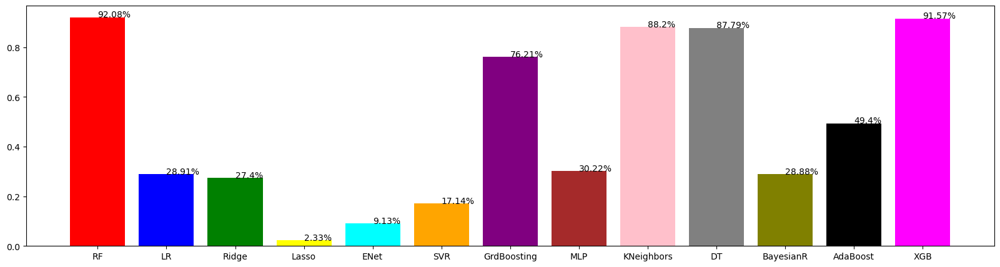

In [63]:
# x features except siconc_NGO
fields= ['o2_NGOM_1', 'dissic_N_1',
       'ph_NGOM_1', 'talk_NGO_1', 'spco2_NGOM', 'bottomT__1', 'mlotst_NGO',
       'siconc_NGO', 'so_NGOM', 'thetao_N_1', 'uo_NGOM_1','vo_NGOM_1',
       'chl_NGOM', 'no3_NGOM_1', 'nppv_NGO_1', 'po4_NGOM_1', 'si_NGOM_1']
x=df[['dissic_N_1',
       'ph_NGOM_1', 'talk_NGO_1', 'spco2_NGOM', 'bottomT__1', 'mlotst_NGO', 'so_NGOM', 'thetao_N_1', 'uo_NGOM_1','vo_NGOM_1',
       'chl_NGOM', 'no3_NGOM_1', 'nppv_NGO_1', 'po4_NGOM_1', 'si_NGOM_1']]
# y target
y=df['o2_NGOM_1']
# Set random seed for reproducibility
np.random.seed(42)
# split train and test
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=0)
models_directory=r'D:\my works\bloom\data\models'
# define function to calculate MAPE
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
# define model
def model_score(model,model_name):
    print(f'model fitting: {model}')
    model.fit(x_train,y_train)
    # save model
    model_path = os.path.join(models_directory, f'{model_name}.pkl')
    joblib.dump(model, model_path)
    y_pred = model.predict(x_test)
    r2 = model.score(x_test,y_test) # R2 score
    mae = mean_absolute_error(y_test, y_pred) # Mean Absolute Error
    rmse = np.sqrt(mean_squared_error(y_test, y_pred)) # Root Mean Squared Error
    #evs = explained_variance_score(y_test, y_pred) # Explained Variance Score
    mape=mean_absolute_percentage_error(y_test, y_pred) # Mean Absolute Percentage Error
    return r2, mae, rmse, mape
#models=[LinearRegression(),SVR(),RandomForestRegressor(),DecisionTreeRegressor(),KNeighborsRegressor(),GradientBoostingRegressor(),AdaBoostRegressor(),XGBRegressor()]
#model_names=['LinearRegression','SVR','RandomForestRegressor','DecisionTreeRegressor','KNeighborsRegressor','GradientBoostingRegressor','AdaBoostRegressor','XGBRegressor']
models=[RandomForestRegressor(),LinearRegression(),Ridge(),Lasso(),ElasticNet(),SVR(),GradientBoostingRegressor(),MLPRegressor(),KNeighborsRegressor(),DecisionTreeRegressor(),BayesianRidge(),AdaBoostRegressor(),XGBRegressor()]
model_names=['RF','LR','Ridge','Lasso','ENet','SVR','GrdBoosting','MLP','KNeighbors','DT','BayesianR','AdaBoost','XGB']

scores=[]
for model, name in zip(models, model_names):
    r2, mae, rmse, mape = model_score(model, name)
    scores.append((r2, mae, rmse, mape))

# plot
plt.figure(figsize=(20,5))
# Unpack scores into separate lists for plotting
r2_scores, mae_scores, rmse_scores, mape_scores = zip(*scores)
plt.bar(model_names, r2_scores, color=['red','blue','green','yellow','cyan','orange','purple','brown','pink','gray','olive','black','magenta'])
# add percentage in bar
for i in range(len(r2_scores)):
    plt.text(i, r2_scores[i], str(round(r2_scores[i]*100,2))+'%')

In [64]:
for model, name in zip(models, model_names):
    r2, mae, rmse, mape = model_score(model, name)
    scores.append((name, r2, mae, rmse, mape))  # Include the model name

# Convert the scores list to a DataFrame
scores_df = pd.DataFrame(scores, columns=['Model', 'R2', 'MAE', 'RMSE', 'mape'])

scores_df

model fitting: RandomForestRegressor()
model fitting: LinearRegression()
model fitting: Ridge()
model fitting: Lasso()
model fitting: ElasticNet()
model fitting: SVR()
model fitting: GradientBoostingRegressor()
model fitting: MLPRegressor()
model fitting: KNeighborsRegressor()
model fitting: DecisionTreeRegressor()
model fitting: BayesianRidge()
model fitting: AdaBoostRegressor()
model fitting: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_

,Model,R2,MAE,RMSE,mape
0,0.9208,0.108552,0.220500,2.921574,NaN
1,0.2891,0.504878,0.660615,13.749285,NaN
2,0.274048,0.510279,0.667572,13.914711,NaN
3,0.023293,0.615989,0.774331,16.732522,NaN
4,0.091309,0.585796,0.746883,16.070366,NaN
5,0.17137,0.497647,0.713222,14.539398,NaN
6,0.762107,0.255440,0.382151,6.990983,NaN
7,0.302154,0.513750,0.654522,13.453282,NaN
8,0.882015,0.143697,0.269128,3.820755,NaN
9,0.877922,0.125232,0.273756,3.411276,NaN


In [70]:

# select rows from 13th to last
scores_df=scores_df.iloc[13:,:]
scores_df

,Model,R2,MAE,RMSE,mape
13,RF,0.921010,0.108578,0.220206,2.912348
14,LR,0.289100,0.504878,0.660615,13.749285
15,Ridge,0.274048,0.510279,0.667572,13.914711
16,Lasso,0.023293,0.615989,0.774331,16.732522
17,ENet,0.091309,0.585796,0.746883,16.070366
18,SVR,0.171370,0.497647,0.713222,14.539398
19,GrdBoosting,0.762079,0.255485,0.382174,6.991850
20,MLP,0.357503,0.468684,0.628029,12.889582
21,KNeighbors,0.882015,0.143697,0.269128,3.820755
22,DT,0.877203,0.127030,0.274560,3.449214


In [74]:
# sort by R2
scores_df=scores_df.sort_values('R2',ascending=False)

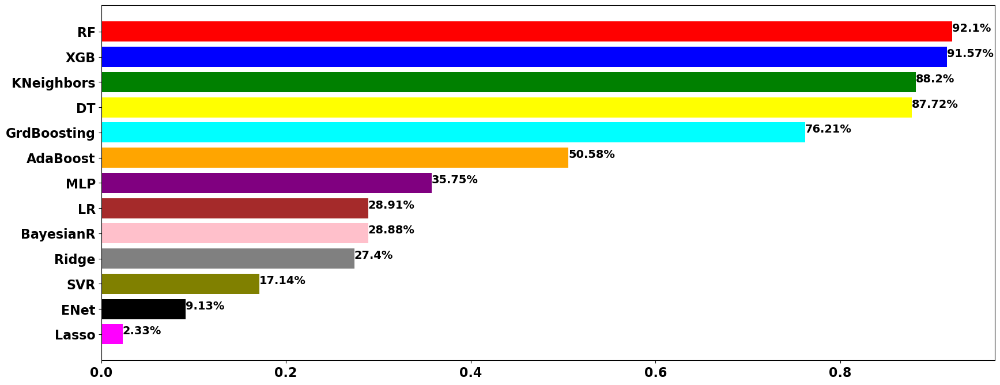

In [75]:
# plot
plt.figure(figsize=(20,8))
# horizontal bar plot with different color for each bar
colors = ['red','blue','green','yellow','cyan','orange','purple','brown','pink','gray','olive','black','magenta'] * len(scores)  # Repeat color list
plt.barh(scores_df['Model'], scores_df['R2'], color=colors)
# add percentage on bar
for i in range(len(scores_df['R2'])):
    plt.text(scores_df['R2'].iloc[i], i, str(round(scores_df['R2'].iloc[i]*100,2))+'%', fontsize=14, fontweight='bold')  # Note the swapped coordinates for text)
plt.gca().invert_yaxis()  # Invert y-axis to have highest score at the top
# font 16 and bold in both x and y axis
plt.xticks(fontsize=16, fontweight='bold')
plt.yticks(fontsize=16, fontweight='bold')
# save figure
output_dir = r'D:\my works\bloom\figure'
os.makedirs(output_dir, exist_ok=True)  # Create directory if it doesn't exist
plt.savefig(os.path.join(output_dir, 'models.jpg'), dpi=400, bbox_inches='tight')

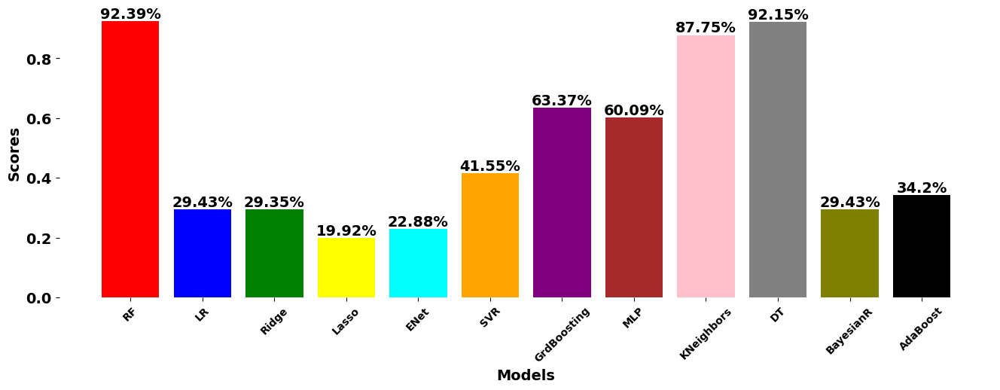

In [33]:
# model score which 
plt.figure(figsize=(16,5))
plt.bar(model_names,scores,color=['red','blue','green','yellow','cyan','orange','purple','brown','pink','gray','olive','black'])
# fontsize in x axis and y axis
plt.xlabel('Models',fontsize=14,fontweight='bold')
# xticks
plt.xticks(rotation=45,fontsize=10,fontweight='bold')
plt.ylabel('Scores',fontsize=14,fontweight='bold')
# yticks
plt.yticks(fontsize=14,fontweight='bold')
# no plot frame
plt.box(False)
# add percentage in bar
for i in range(len(scores)):
    plt.text(i,scores[i],str(round(scores[i]*100,2))+'%',ha='center',va='bottom',fontweight='bold',fontsize=14)

In [38]:
# Plot which variable is important
# load Rf model from disk
model_path = os.path.join(models_directory, 'RF.pkl')
model = joblib.load(model_path)
np.random.seed(42)
# # R2 score, Mean squared error, Explained variance score,Root mean squared error,Mean absolute error
# from sklearn.metrics import mean_squared_error, r2_score,explained_variance_score,mean_absolute_error
# model_score_df=pd.DataFrame({'R2 score':[r2_score(y_test,model.predict(x_test))],'Mean squared error':[mean_squared_error(y_test,model.predict(x_test))],'Explained variance score':[explained_variance_score(y_test,model.predict(x_test))],'Root mean squared error':[np.sqrt(mean_squared_error(y_test,model.predict(x_test)))],'Mean absolute error':[mean_absolute_error(y_test,model.predict(x_test))]})
# model_score_df
# # for all models
# model_score_df=pd.DataFrame()
# for model, name in zip(models, model_names):
#     model_score_df=model_score_df.append(pd.DataFrame({'Model':name,'R2 score':[r2_score(y_test,model.predict(x_test))],'Mean squared error':[mean_squared_error(y_test,model.predict(x_test))],'Explained variance score':[explained_variance_score(y_test,model.predict(x_test))],'Root mean squared error':[np.sqrt(mean_squared_error(y_test,model.predict(x_test)))],'Mean absolute error':[mean_absolute_error(y_test,model.predict(x_test))]}))
# model_score_df
# # print model score
# print(model.score(x_test,y_test)*100)
# get feature importance
importance=model.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
    print(f'Feature: {x.columns[i]}, Score: {v}')
# make dataframe
df_importance=pd.DataFrame({'Features':x.columns,'Importance':importance})
df_importance=df_importance.sort_values(by='Importance',ascending=False)
df_importance

Feature: dissic_N_1, Score: 0.003311761888928779
Feature: ph_NGOM_1, Score: 0.012327452153043065
Feature: talk_NGO_1, Score: 0.003777111418521695
Feature: spco2_NGOM, Score: 0.022176030167854195
Feature: bottomT__1, Score: 0.1040645383292506
Feature: mlotst_NGO, Score: 0.062312984467032984
Feature: so_NGOM, Score: 0.1552740182947556
Feature: thetao_N_1, Score: 0.06198705055484548
Feature: uo_NGOM_1, Score: 0.061876625414079414
Feature: vo_NGOM_1, Score: 0.14929298405994798
Feature: chl_NGOM, Score: 0.004222919955489491
Feature: no3_NGOM_1, Score: 0.0010239288619463707
Feature: nppv_NGO_1, Score: 0.01652086550907259
Feature: po4_NGOM_1, Score: 0.26737060704035465
Feature: si_NGOM_1, Score: 0.07446112188487687


,Features,Importance
13,po4_NGOM_1,0.267371
6,so_NGOM,0.155274
9,vo_NGOM_1,0.149293
4,bottomT__1,0.104065
14,si_NGOM_1,0.074461
5,mlotst_NGO,0.062313
7,thetao_N_1,0.061987
8,uo_NGOM_1,0.061877
3,spco2_NGOM,0.022176
12,nppv_NGO_1,0.016521


In [76]:
# Open the multi-band raster file
with rasterio.open('D:\\my works\\bloom\\data\\multiband.tif') as src:
    # Read the raster data into a numpy array
    array = src.read()
    #metadata
    meta = src.meta
print(array.shape)
# stack array into one array
array_stack=np.stack(array,axis=-1)
print(array_stack.shape)
# reshape array
array_reshaped=array_stack.reshape(-1,array_stack.shape[-1])
print(array_reshaped.shape)
# make dataframe
df_array=pd.DataFrame(array_reshaped,columns=[f'band{i}' for i in range(array_stack.shape[-1])])
# rename columns ['dissic_N_1','ph_NGOM_1', 'talk_NGO_1', 'spco2_NGOM', 'bottomT__1', 'mlotst_NGO', 'so_NGOM', 'thetao_N_1', 'uo_NGOM_1','vo_NGOM_1','chl_NGOM', 'no3_NGOM_1', 'nppv_NGO_1', 'po4_NGOM_1', 'si_NGOM_1']
df_array.columns=['dissic_N_1','ph_NGOM_1', 'talk_NGO_1', 'spco2_NGOM', 'bottomT__1', 'mlotst_NGO', 'so_NGOM', 'thetao_N_1', 'uo_NGOM_1','vo_NGOM_1','chl_NGOM', 'no3_NGOM_1', 'nppv_NGO_1', 'po4_NGOM_1', 'si_NGOM_1']
df_array.head(2)
# now predict
prediction=model.predict(df_array)
# reshape prediction
prediction = prediction.reshape(array_stack.shape[0], array_stack.shape[1])
# Update the metadata to reflect the shape of 'prediction'
meta.update(count=1, height=prediction.shape[0], width=prediction.shape[1])
# Save prediction
with rasterio.open('D:\\my works\\bloom\\data\\prediction.tif', 'w', **meta) as dst:
    dst.write(prediction, 1)

(15, 92, 209)


In [81]:
# stack array into one array
array_stack=np.stack(array,axis=-1)
print(array_stack.shape)
# reshape array
array_reshaped=array_stack.reshape(-1,array_stack.shape[-1])
print(array_reshaped.shape)
# make dataframe
df_array=pd.DataFrame(array_reshaped,columns=[f'band{i}' for i in range(array_stack.shape[-1])])
# rename columns ['dissic_N_1','ph_NGOM_1', 'talk_NGO_1', 'spco2_NGOM', 'bottomT__1', 'mlotst_NGO', 'so_NGOM', 'thetao_N_1', 'uo_NGOM_1','vo_NGOM_1','chl_NGOM', 'no3_NGOM_1', 'nppv_NGO_1', 'po4_NGOM_1', 'si_NGOM_1']
df_array.columns=['dissic_N_1','ph_NGOM_1', 'talk_NGO_1', 'spco2_NGOM', 'bottomT__1', 'mlotst_NGO', 'so_NGOM', 'thetao_N_1', 'uo_NGOM_1','vo_NGOM_1','chl_NGOM', 'no3_NGOM_1', 'nppv_NGO_1', 'po4_NGOM_1', 'si_NGOM_1']
df_array.head(2)

(92, 209, 15)
(19228, 15)


,dissic_N_1,ph_NGOM_1,talk_NGO_1,spco2_NGOM,bottomT__1,mlotst_NGO,so_NGOM,thetao_N_1,uo_NGOM_1,vo_NGOM_1,chl_NGOM,no3_NGOM_1,nppv_NGO_1,po4_NGOM_1,si_NGOM_1
0,-32767.0,9.969210e+36,9.969210e+36,-32767.0,9.969210e+36,9.969210e+36,9.969210e+36,9.969210e+36,9.969210e+36,-32767.0,9.969210e+36,9.969210e+36,-32767.0,-32767.0,-32767.0
1,-32767.0,9.969210e+36,9.969210e+36,-32767.0,9.969210e+36,9.969210e+36,9.969210e+36,9.969210e+36,9.969210e+36,-32767.0,9.969210e+36,9.969210e+36,-32767.0,-32767.0,-32767.0


In [82]:
# now predict
prediction=model.predict(df_array)

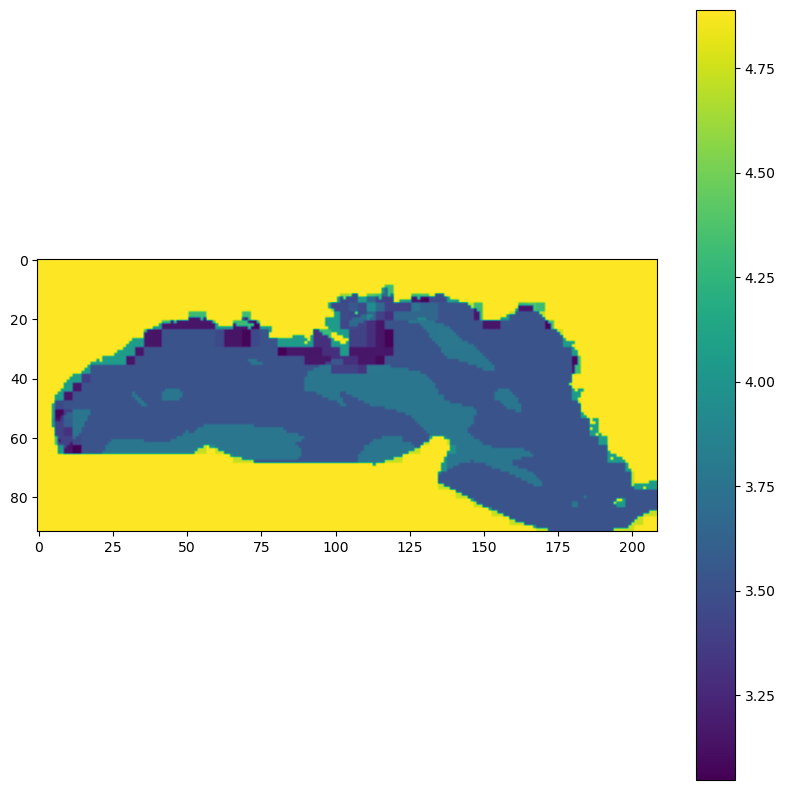

In [83]:
# reshape prediction
prediction = prediction.reshape(array_stack.shape[0], array_stack.shape[1])

# plot prediction
plt.figure(figsize=(10, 10))  # Optional: Set the figure size
img = plt.imshow(prediction)
plt.colorbar(img)  # Add a colorbar
plt.show()

In [58]:
prediction.shape

(92, 209)

In [84]:
# Update the metadata to reflect the shape of 'prediction'
meta.update(count=1, height=prediction.shape[0], width=prediction.shape[1])
# Save prediction
with rasterio.open('D:\\my works\\bloom\\data\\prediction.tif', 'w', **meta) as dst:
    dst.write(prediction, 1)

In [27]:
import pandas as pd
from sklearn.metrics import mean_absolute_error, mean_squared_error, explained_variance_score
np.random.seed(46)
# define model
def model_score(model, model_name):
    print(f'model fitting: {model}')
    model.fit(x_train, y_train)
    
    # save model D:\my works\bloom\data\models
    model_path = os.path.join(models_directory, f'{model_name}.pkl')
    joblib.dump(model, model_path)
    
    # evaluate model
    y_pred = model.predict(x_test)
    r2 = model.score(x_test, y_test)  # R2 score
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    evs = explained_variance_score(y_test, y_pred)
    
    return pd.DataFrame({'Model': [model_name], 'R2': [r2], 'MAE': [mae], 'RMSE': [rmse], 'EVS': [evs]})

# models = [
#     RandomForestRegressor(), LinearRegression(), Ridge(), Lasso(), ElasticNet(),
#     SVR(), GradientBoostingRegressor(), MLPRegressor(), KNeighborsRegressor(),
#     DecisionTreeRegressor(), BayesianRidge(), AdaBoostRegressor()
# ]

model_names = ['RF', 'LR', 'Ridge', 'Lasso', 'ENet', 'SVR', 'GrdBoosting', 'MLP', 'KNeighbors', 'DT', 'BayesianR', 'AdaBoost', 'XGB']

model_score_df = pd.DataFrame()

for model, name in zip(models, model_names):
    model_metrics = model_score(model, name)
    model_score_df = pd.concat([model_score_df, model_metrics], ignore_index=True)

# display the dataframe
print(model_score_df)


model fitting: AdaBoostRegressor()
model fitting: BayesianRidge()
model fitting: DecisionTreeRegressor()
model fitting: ElasticNet()
model fitting: GradientBoostingRegressor()
model fitting: KNeighborsRegressor()
model fitting: Lasso()
model fitting: LinearRegression()
model fitting: MLPRegressor()
model fitting: RandomForestRegressor()
model fitting: Ridge()
model fitting: SVR()
model fitting: XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_

In [28]:
model_score_df

,Model,R2,MAE,RMSE,EVS
0,RF,0.711801,0.501864,0.595223,0.716863
1,LR,0.458144,0.609681,0.816160,0.458438
2,Ridge,0.875923,0.216577,0.390552,0.875932
3,Lasso,0.023037,0.856757,1.095904,0.023445
4,ENet,0.870222,0.289822,0.399424,0.870489
5,SVR,0.879256,0.240264,0.385271,0.879265
6,GrdBoosting,0.010685,0.862004,1.102811,0.011187
7,MLP,0.466096,0.607418,0.810150,0.466824
8,KNeighbors,0.456935,0.634761,0.817070,0.510337
9,DT,0.917181,0.190290,0.319079,0.917183


In [19]:
# x=df[['dissic_N_1',
#        'ph_NGOM_1', 'talk_NGO_1', 'spco2_NGOM', 'bottomT__1', 'mlotst_NGO', 'so_NGOM', 'thetao_N_2', 'uo_NGOM_1',
#        'chl_NGOM', 'no3_NGOM_1', 'nppv_NGO_1', 'po4_NGOM_1', 'si_NGOM_1']]
# # y target
# y=df['o2_NGOM_1']
# Set random seed for reproducibility
np.random.seed(42)
# split train and test
#x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=0)
# R2 score, Mean squared error, Explained variance score,Root mean squared error,Mean absolute error
from sklearn.metrics import mean_squared_error, r2_score,explained_variance_score,mean_absolute_error
models=glob.glob(r'D:\my works\bloom\data\models\*.pkl')
models=[joblib.load(i) for i in models]
model_names=['RF','LR','Ridge','Lasso','ENet','SVR','GrdBoosting','MLP','KNeighbors','DT','BayesianR','AdaBoost','XGB']
# short names models performance metrics: R2 score: R2, Mean squared error: MSE, Explained variance score: EVS,Root mean squared error: RMSE,Mean absolute error: MAE
model_score_df=pd.DataFrame()
# for all models
model_score_df = pd.DataFrame()
for model, name in zip(models, model_names):
    model_score_df = pd.concat([model_score_df, pd.DataFrame({'Model': name,
                                                               'R2': [r2_score(y_test, model.predict(x_test))],
                                                               'MSE': [mean_squared_error(y_test, model.predict(x_test))],
                                                               'EVS': [explained_variance_score(y_test, model.predict(x_test))],
                                                               'RMSE': [np.sqrt(mean_squared_error(y_test, model.predict(x_test)))],
                                                               'MAE': [mean_absolute_error(y_test, model.predict(x_test))]})], ignore_index=True)



In [20]:
model_score_df
# only numeric columns with 2 decimal places
model_score_df.round(2)
#  sort by R2 score
model_score_df.sort_values(by='R2',ascending=False).round(2)

,Model,R2,MSE,EVS,RMSE,MAE
9,DT,0.92,0.10,0.92,0.32,0.19
12,XGB,0.91,0.11,0.91,0.33,0.21
5,SVR,0.88,0.15,0.88,0.39,0.24
2,Ridge,0.88,0.15,0.88,0.39,0.22
4,ENet,0.87,0.16,0.87,0.40,0.29
0,RF,0.69,0.38,0.70,0.62,0.52
7,MLP,0.47,0.66,0.47,0.81,0.61
1,LR,0.46,0.67,0.46,0.82,0.61
10,BayesianR,0.42,0.72,0.42,0.85,0.64
8,KNeighbors,0.34,0.81,0.35,0.90,0.66


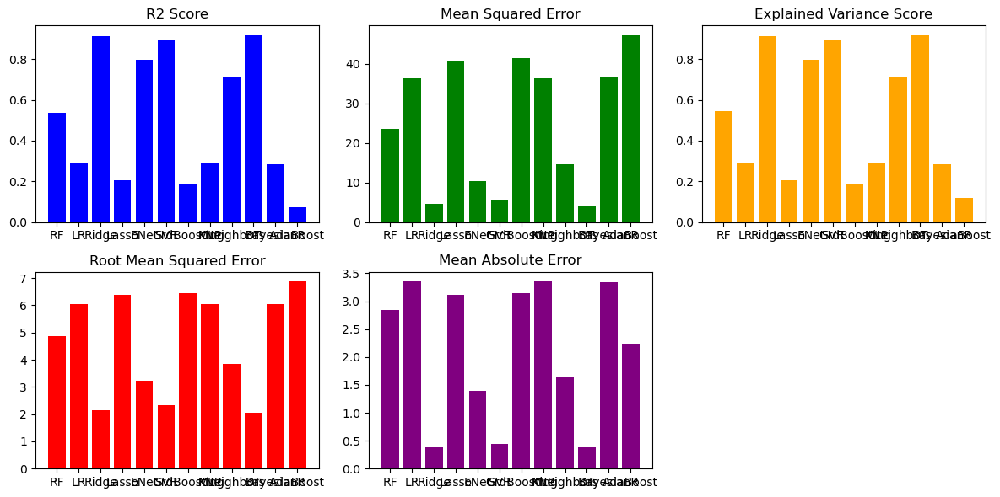

In [15]:
model_score_df
import matplotlib.pyplot as plt

# Assuming 'model_score_df' is replaced with the appropriate DataFrame containing model performance metrics

# Set the figure size
plt.figure(figsize=(12, 6))

# Plotting R2 scores
plt.subplot(2, 3, 1)
plt.bar(model_score_df['Model'], model_score_df['R2'], color='blue')
plt.title('R2 Score')

# Plotting MSE
plt.subplot(2, 3, 2)
plt.bar(model_score_df['Model'], model_score_df['MSE'], color='green')
plt.title('Mean Squared Error')

# Plotting EVS
plt.subplot(2, 3, 3)
plt.bar(model_score_df['Model'], model_score_df['EVS'], color='orange')
plt.title('Explained Variance Score')

# Plotting RMSE
plt.subplot(2, 3, 4)
plt.bar(model_score_df['Model'], model_score_df['RMSE'], color='red')
plt.title('Root Mean Squared Error')

# Plotting MAE
plt.subplot(2, 3, 5)
plt.bar(model_score_df['Model'], model_score_df['MAE'], color='purple')
plt.title('Mean Absolute Error')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


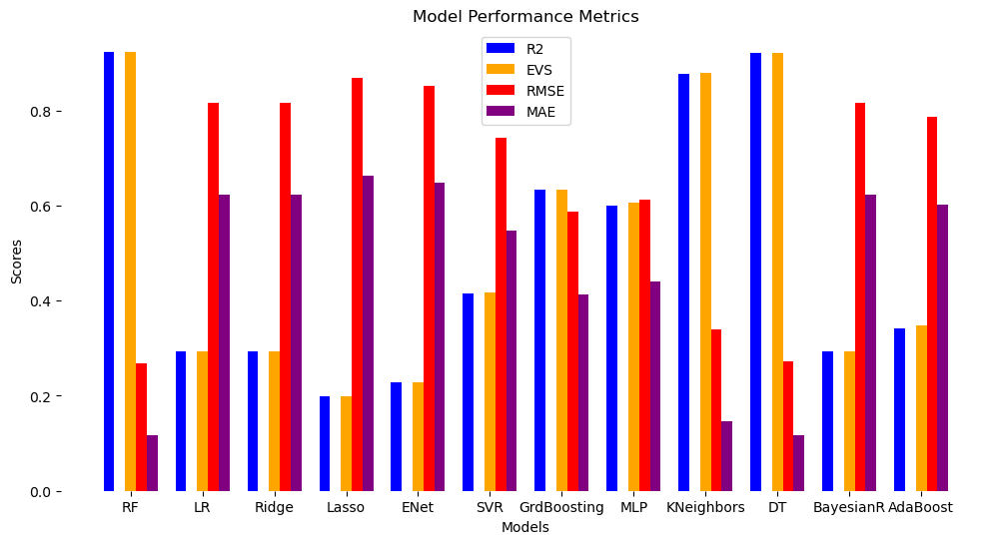

In [58]:

# Set the figure size
plt.figure(figsize=(12, 6))

# Bar width
bar_width = 0.15
index = np.arange(len(model_score_df['Model']))

# Plotting R2 scores
plt.bar(index - 2 * bar_width, model_score_df['R2'], width=bar_width, label='R2', color='blue')

# Plotting MSE
#plt.bar(index - bar_width, model_score_df['MSE'], width=bar_width, label='MSE', color='green')

# Plotting EVS
plt.bar(index, model_score_df['EVS'], width=bar_width, label='EVS', color='orange')

# Plotting RMSE
plt.bar(index + bar_width, model_score_df['RMSE'], width=bar_width, label='RMSE', color='red')

# Plotting MAE
plt.bar(index + 2 * bar_width, model_score_df['MAE'], width=bar_width, label='MAE', color='purple')

# Set x-axis labels and ticks
plt.xticks(index, model_score_df['Model'])

# Add labels and title
plt.xlabel('Models')
plt.ylabel('Scores')
plt.title('Model Performance Metrics')
plt.legend()
# no plot frame
plt.box(False)

# save figure
plt.savefig(r'D:\my works\bloom\figure\model_performance_metrics.png',dpi=500,bbox_inches='tight')
# Show the plot
plt.show()

In [12]:
# load all models
models=glob.glob(r'D:\my works\bloom\data\models\*.pkl')
# load all models
models=[joblib.load(i) for i in models]

In [49]:
# load random forest model
model_path = os.path.join(models_directory, 'RF.pkl')
model = joblib.load(model_path)
# feature importance
importance=model.feature_importances_
print(importance)
# make dataframe
df_importance=pd.DataFrame({'Features':x.columns,'Importance':importance})
# sort by importance
df_importance=df_importance.sort_values(by='Importance',ascending=False)
df_importance

[0.04003562 0.04730758 0.02459231 0.04852038 0.31043184 0.03362637
 0.08747362 0.03659782 0.03573652 0.09761405 0.1258367  0.04180975
 0.01981849 0.05059895]


,Features,Importance
4,bottomT__1,0.310432
10,no3_NGOM_1,0.125837
9,chl_NGOM,0.097614
6,so_NGOM,0.087474
13,si_NGOM_1,0.050599
3,spco2_NGOM,0.048520
1,ph_NGOM_1,0.047308
11,nppv_NGO_1,0.041810
0,dissic_N_1,0.040036
7,thetao_N_2,0.036598


In [50]:
df_importance['Features'].tolist()
# rename features: 

df_importance['Features']=df_importance['Features'].replace({'bottomT__1': 'Bottom Temperature',
 'uo_NGOM_1': 'Zonal Velocity',
 'thetao_N_2': 'Potential Temperature',
 'spco2_NGOM': 'Surface Partial Pressure of CO2',
 'no3_NGOM_1': 'Nitrate',
 'so_NGOM': 'Salinity',
 'talk_NGO_1': 'Total alkalinity',
 'ph_NGOM_1': 'pH',
 'chl_NGOM': 'Chlorophyll_a',
 'nppv_NGO_1': 'Net Primary Production of Biomass by Phytoplankton',
 'dissic_N_1': 'Dissolved inorganic carbon',
 'si_NGOM_1': 'Silicate',
 'po4_NGOM_1': 'Phosphate',
 'mlotst_NGO': 'Mixed Layer Thickness'})

In [55]:
df_importance

,Features,Importance
4,Bottom Temperature,0.310432
10,Nitrate,0.125837
9,Chlorophyll_a,0.097614
6,Salinity,0.087474
13,Silicate,0.050599
3,Surface Partial Pressure of CO2,0.048520
1,pH,0.047308
11,Net Primary Production of Biomass by Phytoplan...,0.041810
0,Dissolved inorganic carbon,0.040036
7,Potential Temperature,0.036598


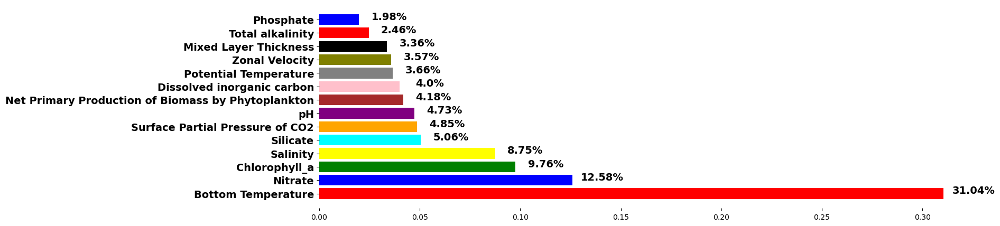

In [56]:
# plot
plt.figure(figsize=(16,5))
plt.barh(df_importance['Features'],df_importance['Importance'],color=['red','blue','green','yellow','cyan','orange','purple','brown','pink','gray','olive','black'])
# fontsize in yticks
plt.yticks(fontsize=14,fontweight='bold')
# no plot border
plt.box(False)
#  add percentage in bar
for i in range(len(df_importance)):
    plt.text(df_importance['Importance'][i]+0.015,df_importance['Features'][i],str(round(df_importance['Importance'][i]*100,2))+'%',ha='center',fontweight='bold',fontsize=14)
# save plot
plt.savefig(r'D:\my works\bloom\figure\feature_importance.jpg',dpi=500,bbox_inches='tight')

In [11]:
df.head(2)

,CID,ID,POINT_X,POINT_Y,o2_NGOM_1,dissic_N_1,ph_NGOM_1,talk_NGO_1,spco2_NGOM,bottomT__1,...,so_NGOM,thetao_N_1,thetao_N_2,uo_NGOM_1,chl_NGOM,no3_NGOM_1,nppv_NGO_1,po4_NGOM_1,si_NGOM_1,geometry
0,7,0,-93.761681,26.512224,2.90979,2.06197,8.01503,2.41947,41.8682,4.119358,...,34.269234,29.838404,0.000610,0.000610,0.081893,0.031123,1.19606,0.000037,3.94601,POINT (-93.76168 26.51222)
1,11,0,-96.411068,26.339934,3.99119,2.04872,8.03178,2.41939,39.2181,24.244728,...,36.255989,29.034181,0.189215,0.189215,0.115979,0.007286,5.03648,0.000168,4.45729,POINT (-96.41107 26.33993)


In [52]:
# load model
for i in range(len(model_names)):
    model_path = os.path.join(models_directory, f'{model_names[i]}.pkl')
    models[i] = joblib.load(model_path)
# predict by x and add predicted values to df column name: o2_pred_modelname
for i in range(len(model_names)):
    df['o2_pred_'+model_names[i]]=models[i].predict(x)
df.head(2)

,CID,ID,POINT_X,POINT_Y,dissic_N_1,ph_NGOM_1,talk_NGO_1,spco2_NGOM,bottomT__1,mlotst_NGO,...,o2_pred_Ridge,o2_pred_Lasso,o2_pred_ENet,o2_pred_SVR,o2_pred_GrdBoosting,o2_pred_MLP,o2_pred_KNeighbors,o2_pred_DT,o2_pred_BayesianR,o2_pred_AdaBoost
0,7,0,-93.761681,26.512224,2.06197,8.01503,2.41947,41.8682,4.119358,10.528886,...,4.093440,4.254877,4.180348,4.184162,3.858006,4.063856,3.430418,3.430418,4.124307,4.279347
1,11,0,-96.411068,26.339934,2.04872,8.03178,2.41939,39.2181,24.244728,11.749627,...,4.470894,4.821047,4.756406,4.711878,4.050518,4.538002,3.372472,3.362186,4.435535,4.379450


In [53]:
# select only predicted columns and POINT_X, POINT_Y with regrex
df1=df.filter(regex='o2_pred_*|POINT_X|POINT_Y')
df1.head(2)

,POINT_X,POINT_Y,o2_pred_RF,o2_pred_LR,o2_pred_Ridge,o2_pred_Lasso,o2_pred_ENet,o2_pred_SVR,o2_pred_GrdBoosting,o2_pred_MLP,o2_pred_KNeighbors,o2_pred_DT,o2_pred_BayesianR,o2_pred_AdaBoost
0,-93.761681,26.512224,3.441909,4.127326,4.093440,4.254877,4.180348,4.184162,3.858006,4.063856,3.430418,3.430418,4.124307,4.279347
1,-96.411068,26.339934,3.362142,4.438845,4.470894,4.821047,4.756406,4.711878,4.050518,4.538002,3.372472,3.362186,4.435535,4.379450


In [54]:
# save to csv
df1.to_csv(r'D:\my works\bloom\data\predicted csv\predicted_o2.csv',index=False)

In [ ]:
# 11 plots

In [ ]:
# split train and test
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=0)
# Create dictionaries to store metrics
mse_scores = {}
rmse_scores = {}
r2_scores = {}

# Iterate through models
for model_name, model in zip(model_names, models):
    # Fit the model
    model.fit(x_train, y_train)
    
    # Make predictions
    y_pred = model.predict(x_test)
    
    # Calculate MSE, RMSE, and R²
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    
    # Store scores in dictionaries
    mse_scores[model_name] = mse
    rmse_scores[model_name] = rmse
    r2_scores[model_name] = r2

# Print the scores for each model
for model_name in model_names:
    print(f"{model_name}:")
    print(f"MSE: {mse_scores[model_name]}")
    print(f"RMSE: {rmse_scores[model_name]}")
    print(f"R-squared (R²): {r2_scores[model_name]}")
    print()

In [ ]:
import numpy as np
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold

# Define the number of folds for cross-validation
n_folds = 5  # You can adjust this based on your preference

# Create a KFold cross-validation object
kf = KFold(n_splits=n_folds, shuffle=True, random_state=0)

# Initialize lists to store metric scores for each fold
mse_scores = []
rmse_scores = []
r2_scores = []

# Perform cross-validation
for train_idx, val_idx in kf.split(x_train, y_train):
    x_train_fold, y_train_fold = x_train.iloc[train_idx], y_train.iloc[train_idx]
    x_val_fold, y_val_fold = x_train.iloc[val_idx], y_train.iloc[val_idx]

    # Fit the model on the training fold
    model.fit(x_train_fold, y_train_fold, epochs=100, verbose=0)

    # Predict on the validation fold
    y_pred_fold = model.predict(x_val_fold)

    # Calculate MSE, RMSE, and R² for the fold
    mse_fold = mean_squared_error(y_val_fold, y_pred_fold)
    rmse_fold = np.sqrt(mse_fold)
    r2_fold = r2_score(y_val_fold, y_pred_fold)

    # Append fold scores to the lists
    mse_scores.append(mse_fold)
    rmse_scores.append(rmse_fold)
    r2_scores.append(r2_fold)

# Calculate the mean and standard deviation of scores across folds
mean_mse = np.mean(mse_scores)
mean_rmse = np.mean(rmse_scores)
mean_r2 = np.mean(r2_scores)

std_mse = np.std(mse_scores)
std_rmse = np.std(rmse_scores)
std_r2 = np.std(r2_scores)

# Print the average scores and their standard deviations
print(f"Mean MSE across {n_folds} folds: {mean_mse:.4f} (std: {std_mse:.4f})")
print(f"Mean RMSE across {n_folds} folds: {mean_rmse:.4f} (std: {std_rmse:.4f})")
print(f"Mean R-squared across {n_folds} folds: {mean_r2:.4f} (std: {std_r2:.4f})")


In [ ]:
[mse_scores[model_name] for model_name in model_names]

In [ ]:
# Define the scores for each metric
mse_values = [mse_scores[model_name] for model_name in model_names]
rmse_values = [rmse_scores[model_name] for model_name in model_names]
r2_values = [r2_scores[model_name] for model_name in model_names]

# Create a bar plot
fig, ax = plt.subplots(figsize=(12, 6))

# Set the bar width
bar_width = 0.25

# Define the x-axis positions for the bars
index = range(len(model_names))

# Create bars for MSE, RMSE, and R²
bar1 = ax.bar(index, mse_values, bar_width, label='MSE')
bar2 = ax.bar([i + bar_width for i in index], rmse_values, bar_width, label='RMSE')
bar3 = ax.bar([i + 2 * bar_width for i in index], r2_values, bar_width, label='R-squared')
# add text  mse_values, rmse_values, r2_values
for i in range(len(mse_values)):
    plt.text(i,mse_values[i],str(round(mse_values[i],2)))
    plt.text(i+bar_width,rmse_values[i],str(round(rmse_values[i],2)))
    plt.text(i+2*bar_width,r2_values[i],str(round(r2_values[i],2)))

# Set the x-axis labels
ax.set_xlabel('Regression Models')
ax.set_xticks([i + bar_width for i in index])
ax.set_xticklabels(model_names, rotation=45, ha='right')

# Set the y-axis label
ax.set_ylabel('Scores')

# Set the plot title
ax.set_title('Regression Model Performance Comparison')

# Add a legend
ax.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
# plot
plt.figure(figsize=(20,5))
plt.bar(model_names,scores)
# add percentage in bar
for i in range(len(scores)):
    plt.text(i,scores[i],str(round(scores[i]*100,2))+'%')

In [ ]:
!pip install tensorflow
# tensorflow model 
# 1d CNN
from keras.models import Sequential
from keras.layers import Dense, Conv1D, Flatten, MaxPooling1D, Dropout
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing

In [ ]:

# define model
model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[len(x.keys())]),
    layers.Dense(64, activation='relu'),
    layers.Dense(1)
    ])
# compile model
model.compile(loss='mean_absolute_error',optimizer=tf.keras.optimizers.Adam(0.001))
# fit model
history = model.fit(x_train, y_train, epochs=100, validation_split = 0.2, verbose=0)
# plot loss
plt.plot(history.history['loss'],label='train')
plt.plot(history.history['val_loss'],label='test')
plt.legend()
# print score
model.evaluate(x_test,y_test)
# Assuming you have already trained your model and have predictions
y_pred = model.predict(x_test)

# Calculate MSE and RMSE
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

# Calculate R-squared (R²)
r2 = r2_score(y_test, y_pred)

# Print the values
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R²): {r2}")

In [ ]:
# print score
model.evaluate(x_test,y_test)

In [ ]:
# split train and test
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=0)
# Standardize your feature data
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

# Reshape your input data
x_train = x_train[:, :, np.newaxis]  # Add a new axis to match the Conv1D input shape
x_test = x_test[:, :, np.newaxis]

# Build your 1D CNN model
model = keras.Sequential([
    keras.layers.Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=(x_train.shape[1], 1)),
    keras.layers.Flatten(),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(1)  # Output layer for regression
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')  # Use mean squared error for regression

# Train the model
epochs = 50
batch_size = 32
history = model.fit(x_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(x_test, y_test))
# plot loss
plt.plot(history.history['loss'],label='train')
plt.plot(history.history['val_loss'],label='test')
plt.legend()
# Evaluate the model
loss = model.evaluate(x_test, y_test)
print(f"Mean Squared Error on Test Data: {loss}")
# Assuming you have already trained your model and have predictions
y_pred = model.predict(x_test)

# Calculate MSE and RMSE
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

# Calculate R-squared (R²)
r2 = r2_score(y_test, y_pred)

# Print the values
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared (R²): {r2}")

#  Andaman sea 

In [4]:
# read all nc files:E:\my works\andaman\data\nc\chla
#sla=xr.open_mfdataset(r'E:\my works\andaman\data\nc\sealevel\*.nc',combine='by_coords')
ds=xr.open_dataset(r"E:\my works\andaman\data\nc\sealevel\2014\dt_global_twosat_phy_l4_20140101_vDT2021.nc")
ds=ds.sel(latitude=slice(4,18),longitude=slice(87,99))
ds
# 

<xarray.Dataset>
Dimensions:         (time: 1, latitude: 56, nv: 2, longitude: 48)
Coordinates:
  * time            (time) datetime64[ns] 2014-01-01
  * latitude        (latitude) float32 4.125 4.375 4.625 ... 17.38 17.62 17.88
  * longitude       (longitude) float32 87.12 87.38 87.62 ... 98.38 98.62 98.88
  * nv              (nv) int32 0 1
Data variables: (12/14)
    crs             int32 ...
    lat_bnds        (latitude, nv) float32 ...
    lon_bnds        (longitude, nv) float32 ...
    sla             (time, latitude, longitude) float64 ...
    err_sla         (time, latitude, longitude) float64 ...
    ugosa           (time, latitude, longitude) float64 ...
    ...              ...
    err_vgosa       (time, latitude, longitude) float64 ...
    adt             (time, latitude, longitude) float64 ...
    ugos            (time, latitude, longitude) float64 ...
    vgos            (time, latitude, longitude) float64 ...
    tpa_correction  (time) float64 ...
    flag_ice        (time, latitude, longitude) float64 ...
Attributes: (12/44)
    Conventions:                     CF-1.6
    Metadata_Conventions:            Unidata Dataset Discovery v1.0
    cdm_data_type:                   Grid
    comment:                         Sea Surface Height measured by Altimetry...
    contact:                         http://climate.copernicus.eu/c3s-user-se...
    creator_email:                   http://climate.copernicus.eu/c3s-user-se...
    ...                              ...
    summary:                         SSALTO/DUACS Delayed-Time Level-4 sea su...
    time_coverage_duration:          P1D
    time_coverage_end:               2014-01-01T12:00:00Z
    time_coverage_resolution:        P1D
    time_coverage_start:             2013-12-31T12:00:00Z
    title:                           DT merged two satellites Global Ocean Gr...

In [10]:
# create folder inside E:\my works\andaman\data\nc\eddy ,folder=2014,2015,2016,2017,2018,2019,2020,2021
# folder=['2014','2015','2016','2017','2018','2019','2020','2021']
# for i in folder:
#     os.mkdir(r'E:\my works\andaman\data\nc\eddy\\'+i)
# find all nc files in r"E:\my works\andaman\data\nc\sealevel
# ncfiles=glob.glob(r"E:\my works\andaman\data\nc\sealevel\2015\*.nc")
# # read and crop and save
# for i in ncfiles:
#     ds=xr.open_dataset(i)
#     ds=ds.sel(latitude=slice(4,18),longitude=slice(87,99))
#     ds.to_netcdf(r'E:\my works\andaman\data\nc\eddy\2015\\'+i.split('\\')[-1])
# print('done')
# for 2015,2016,2017,2018,2019,2020,2021
folder=['2015','2016','2017','2018','2019','2020','2021']
for j in folder:
    ncfiles=glob.glob(r"E:\my works\andaman\data\nc\sealevel\\"+j+"\\*.nc")
    for i in ncfiles:
        ds=xr.open_dataset(i)
        ds=ds.sel(latitude=slice(4,18),longitude=slice(87,99))
        ds.to_netcdf(r'E:\my works\andaman\data\nc\eddy\\'+j+'\\'+i.split('\\')[-1])
print('done')

done


In [3]:
folder=['2014','2015','2016','2017','2018','2019','2020','2021']
for j in folder:
    ncfiles=glob.glob(r"E:\my works\andaman\data\nc\sealevel\\"+j+"\\*.nc")
    for i in ncfiles:
        ds=xr.open_dataset(i)
        ds=ds.sel(latitude=slice(0,23),longitude=slice(80,100))
        ds.to_netcdf(r'E:\my works\andaman\data\nc\eddy_bob\\'+j+'\\'+i.split('\\')[-1])
print('done')

done


In [2]:
folder=['2014','2015','2016','2017','2018','2019','2020','2021']
for i in folder:
    os.mkdir(r'E:\my works\andaman\data\nc\eddy_bob\\'+i)

In [4]:
ds=xr.open_dataset(r'E:\my works\andaman\data\nc\cmems_mod_glo_phy_my_0.083_P1D-m_1693856053449.nc')
# depth=0.494025
ds=ds.sel(depth=0.494025)
# lat 4-18, lon 87-99
ds=ds.sel(latitude=slice(4,18),longitude=slice(87,99))
# monthly mean
ds=ds.resample(time='1MS').mean()
# group by month
ds=ds.groupby('time.month').mean('time')
# add magnitude
ds['magnitude']=np.sqrt(ds['uo']**2+ds['vo']**2)
ds

<xarray.Dataset>
Dimensions:    (latitude: 169, month: 12, longitude: 145)
Coordinates:
    depth      float32 0.494
  * latitude   (latitude) float32 4.0 4.083 4.167 4.25 ... 17.83 17.92 18.0
  * longitude  (longitude) float32 87.0 87.08 87.17 87.25 ... 98.83 98.92 99.0
  * month      (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    vo         (month, latitude, longitude) float32 0.02494 0.02404 ... nan nan
    uo         (month, latitude, longitude) float32 -0.3587 -0.3574 ... nan nan
    magnitude  (month, latitude, longitude) float32 0.3596 0.3582 ... nan nan
Attributes: (12/25)
    title:                              daily mean fields from Global Ocean P...
    easting:                            longitude
    northing:                           latitude
    history:                            2022/05/25 21:54:07 MERCATOR OCEAN Ne...
    source:                             MERCATOR GLORYS12V1
    institution:                        MERCATOR OCEAN
    ...                                 ...
    FROM_ORIGINAL_FILE__longitude_max:  179.91667
    FROM_ORIGINAL_FILE__latitude_min:   -80.0
    FROM_ORIGINAL_FILE__latitude_max:   90.0
    z_min:                              0.494025
    z_max:                              5727.917
    _CoordSysBuilder:                   ucar.nc2.dataset.conv.CF1Convention

In [38]:

# group by month map
#ds['magnitude'].plot(col='month',col_wrap=3,cmap='jet',figsize=(15,10))
ds1=ds.sel(month=1)
lat=ds1['latitude'].values
lon=ds1['longitude'].values
mag=ds1['magnitude'].values
vo=ds1['vo'].values
uo=ds1['uo'].values
longrid2, latgrid2=np.meshgrid(lon,lat)


()

<GeoAxes: >

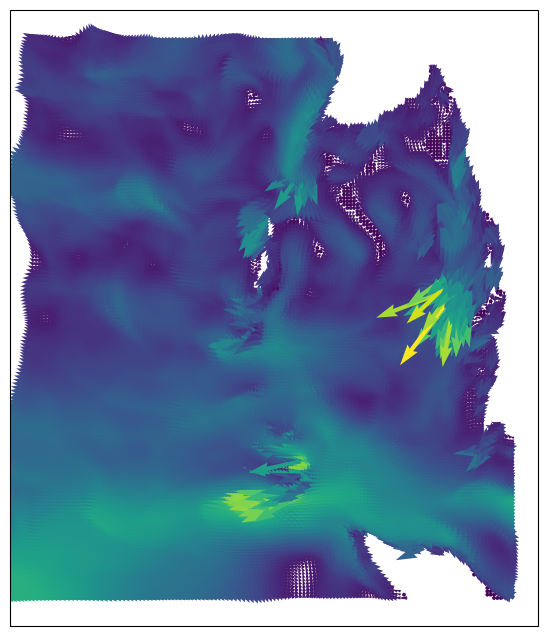

In [60]:
slx = slice(None, None, 20)
sly = slice(None, None, 20)
sl2d = (sly, slx)
fig = plt.figure(1, figsize=(10, 8))
ax = plt.subplot(111, projection=ccrs.PlateCarree())
q=ax.quiver(longrid2, latgrid2,uo,vo,mag,transform=ccrs.PlateCarree(),scale=3,width=0.008) 
ax

In [35]:
import cartopy.feature as cfeature
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')
        

In [78]:
# skip nan ,calculate mean
#np.nanmean(mag)
uo.shape[] #

(169, 145)

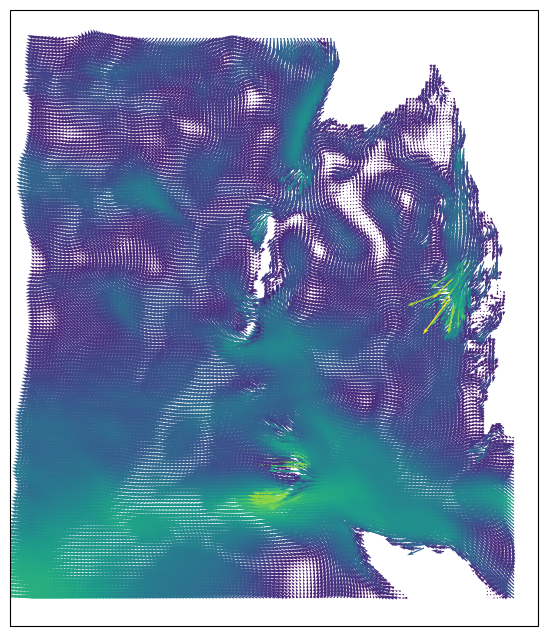

In [82]:
fig = plt.figure(1, figsize=(10, 8))
ax = plt.subplot(111, projection=ccrs.PlateCarree())

Q = ax.quiver(longrid2,latgrid2,np.squeeze(uo),np.squeeze(vo),
    mag,transform=ccrs.PlateCarree(),color='k',units='width',scale=5)


#qk = plt.quiverkey(Q,0.8, 0.8, 0.9, r'$1 \frac{m}{s}$',labelpos='E', coordinates='figure',
#    fontproperties={'weight': 'light'},color='r',)
#ax.add_feature(cfeature.LAND,color='gray')
#ax.add_feature(cfeature.COASTLINE)
plt.show()

In [ ]:
# make as a function
def nc_to_df_yearly(ds, var):
    df = ds.groupby('time.year').mean('time').to_dataframe()
    df=df[var]
    df=df.reset_index()
    df=df[['year',var]]
    return df.groupby('year').mean()
# make as a function
def nc_to_df_monthly(ds, var):
    df = ds.groupby('time.month').mean('time').to_dataframe()
    df=df[var]
    df=df.reset_index()
    df=df[['month',var]]
    return df.groupby('month').mean()

In [37]:
# read all nc files:E:\my works\andaman\data\nc\chla
sst=xr.open_mfdataset(r'E:\my works\andaman\data\nc\sst\*.nc',combine='by_coords')
# lat=4-18, lon=87-99
sst=sst.sel(lat=slice(4,18),lon=slice(87,99))
sst #MODISA_L3m_SST_Monthly_9km_R2019_0_sst

<xarray.Dataset>
Dimensions:                                 (lat: 304, lon: 240, time: 84,
                                             lonv: 2, latv: 2, nv: 2)
Coordinates:
  * lat                                     (lat) float32 4.042 4.042 ... 17.96
  * lon                                     (lon) float32 87.04 87.04 ... 98.96
  * time                                    (time) datetime64[ns] 2014-01-01T...
Dimensions without coordinates: lonv, latv, nv
Data variables:
    lon_bnds                                (time, lat, lon, lonv) float64 dask.array<chunksize=(1, 304, 240, 2), meta=np.ndarray>
    lat_bnds                                (time, lon, lat, latv) float64 dask.array<chunksize=(1, 240, 304, 2), meta=np.ndarray>
    time_bnds                               (lat, lon, time, nv) datetime64[ns] dask.array<chunksize=(304, 240, 1, 2), meta=np.ndarray>
    MODISA_L3m_SST_Monthly_9km_R2019_0_sst  (time, lat, lon) float32 dask.array<chunksize=(1, 304, 240), meta=np.ndarray>
    datamonth                               (lat, lon, time) float64 dask.array<chunksize=(304, 240, 1), meta=np.ndarray>
Attributes:
    Conventions:               CF-1.4
    start_time:                2014-01-01T00:45:01Z
    end_time:                  2014-02-01T02:10:00Z
    temporal_resolution:       monthly
    NCO:                       "4.5.3"
    nco_openmp_thread_number:  1

Compute the anomalies:
There are three main steps to obtain the anomalies from the Niño 3.4 dataset created in the previous set of examples. First, we use the groupby() method to convert to monthly data. Second, we subtract the mean sea-surface temperature (SST) from the monthly data. Finally, we obtain the anomalies by computing a weighted average. 

In [22]:
gb = sst.MODISA_L3m_SST_Monthly_9km_R2019_0_sst.groupby("time.month") # group by month
anom=gb- gb.mean("time") # calculate anomaly
# weighted mean
index_nino=anom.weighted(sst.MODISA_L3m_SST_Monthly_9km_R2019_0_sst).mean(["lat","lon"])
index_nino_rolling_mean = index_nino.rolling(time=5, center=True).mean().fillna(0)
index_nino_rolling_mean

<xarray.DataArray 'MODISA_L3m_SST_Monthly_9km_R2019_0_sst' (time: 84)>
dask.array<where, shape=(84,), dtype=float32, chunksize=(5,), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2014-01-01T00:45:01 2014-02-01 ... 2020-12-01
    month    (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 2 3 4 5 6 7 8 9 10 11 12

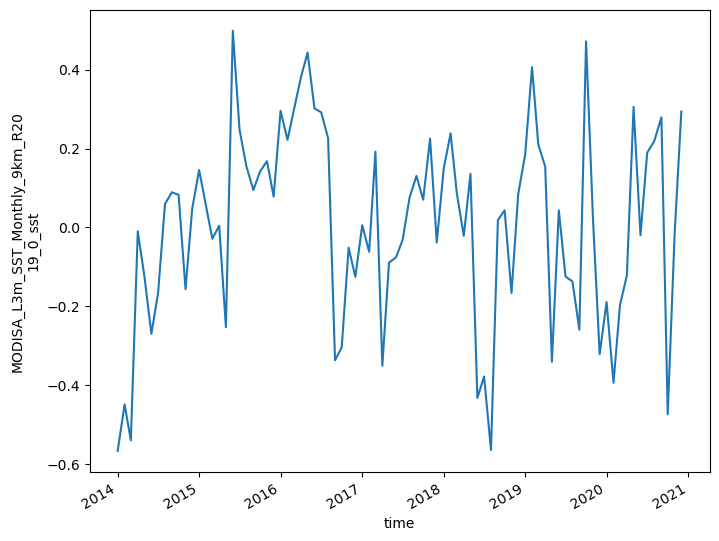

In [34]:
# Group by month
gb = sst.groupby("time.month")

# Calculate anomaly
anom = gb - gb.mean("time")

# Calculate weighted mean (with missing value handling)
weighted_anom = anom.weighted(sst.MODISA_L3m_SST_Monthly_9km_R2019_0_sst.fillna(0))

# Calculate the mean along lat and lon dimensions
index_nino = weighted_anom.mean(["lat", "lon"])

# Calculate rolling mean and fill NaNs with zeros
index_nino_rolling_mean = index_nino.rolling(time=3, center=True).mean().fillna(0)

# Plot the data
index_nino.MODISA_L3m_SST_Monthly_9km_R2019_0_sst.plot(figsize=(8, 6))

Text(0.5, 1.0, 'SST anomaly over the Niño Andaman Sea')

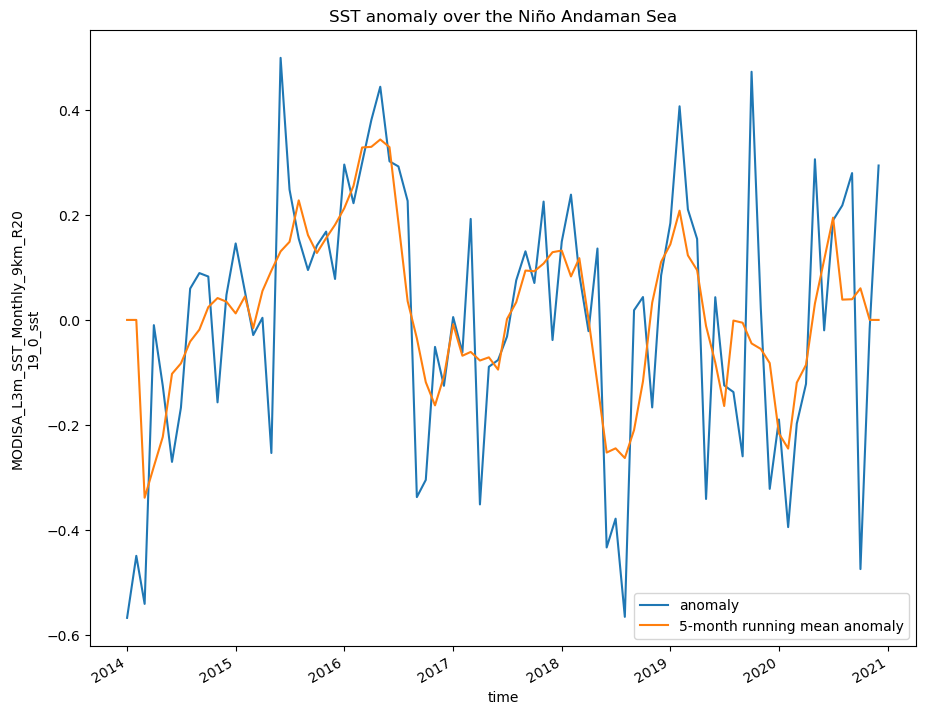

In [32]:
index_nino.MODISA_L3m_SST_Monthly_9km_R2019_0_sst.plot(size=8)
index_nino_rolling_mean.MODISA_L3m_SST_Monthly_9km_R2019_0_sst.plot()
plt.legend(['anomaly', '5-month running mean anomaly'])
plt.title('SST anomaly over the Niño Andaman Sea')

We will highlight values in excess of 
$\pm$ 0.5, roughly corresponding to El Niño (warm) and La Niña (cold) events.

Text(0.5, 1.0, 'Oceanic Niño Index (ONI)')

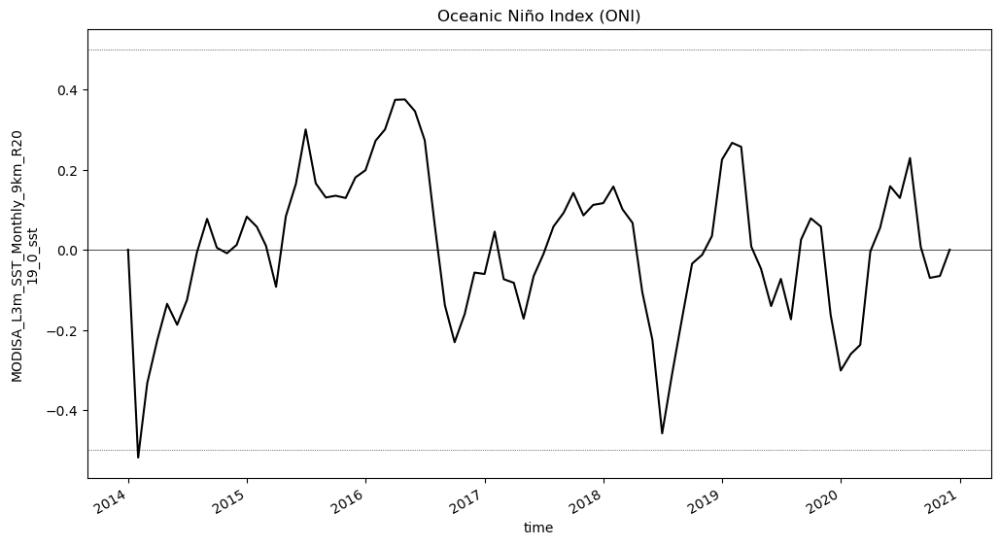

In [35]:
fig = plt.figure(figsize=(12, 6))  # assing figure size

plt.fill_between(  # plot with color in between
    index_nino_rolling_mean.MODISA_L3m_SST_Monthly_9km_R2019_0_sst.time.data,  # x values
    index_nino_rolling_mean.MODISA_L3m_SST_Monthly_9km_R2019_0_sst.where(index_nino_rolling_mean.MODISA_L3m_SST_Monthly_9km_R2019_0_sst >= 0.5).data,  # top boundary - y values above 0.5
    0.5,  # bottom boundary - 0.5
    color="red",  # color
    alpha=0.9,  # transparency value
)
plt.fill_between(
    index_nino_rolling_mean.MODISA_L3m_SST_Monthly_9km_R2019_0_sst.time.data,
    index_nino_rolling_mean.MODISA_L3m_SST_Monthly_9km_R2019_0_sst.where(index_nino_rolling_mean.MODISA_L3m_SST_Monthly_9km_R2019_0_sst <= -0.5).data,
    -0.5,
    color="blue",
    alpha=0.9,
)

index_nino_rolling_mean.MODISA_L3m_SST_Monthly_9km_R2019_0_sst.plot(color="black")  # plot the smoothed data
plt.axhline(0, color="black", lw=0.5)  # add a black line at x=0
plt.axhline(
    0.5, color="black", linewidth=0.5, linestyle="dotted"
)  # add a black line at x=0.5
plt.axhline(
    -0.5, color="black", linewidth=0.5, linestyle="dotted"
)  # add a black line at x=-0.5
plt.title("Oceanic Niño Index (ONI)")

In [ ]:
# yearly mean
nc_to_df_yearly(sst,'MODISA_L3m_SST_Monthly_9km_R2019_0_sst')

In [ ]:
# monthly mean
nc_to_df_monthly(sst,'MODISA_L3m_SST_Monthly_9km_R2019_0_sst')

In [45]:
# read all nc files:E:\my works\andaman\data\nc\chla
chla=xr.open_mfdataset(r'E:\my works\andaman\data\nc\chla\*.nc',combine='by_coords')
# lat=4-18, lon=87-99
chla=chla.sel(lat=slice(4,18),lon=slice(87,99))

chla

<xarray.Dataset>
Dimensions:                                (time: 84, lon: 288, lonv: 2,
                                            lat: 336, latv: 2, nv: 2)
Coordinates:
  * lat                                    (lat) float32 4.021 4.062 ... 17.98
  * lon                                    (lon) float32 87.02 87.06 ... 98.98
  * time                                   (time) datetime64[ns] 2014-01-01 ....
Dimensions without coordinates: lonv, latv, nv
Data variables:
    lon_bnds                               (time, lon, lonv) float64 dask.array<chunksize=(1, 288, 2), meta=np.ndarray>
    MODISA_L3m_CHL_Mo_4km_R2022_0_chlor_a  (time, lat, lon) float32 dask.array<chunksize=(1, 336, 288), meta=np.ndarray>
    datamonth                              (time) int32 dask.array<chunksize=(1,), meta=np.ndarray>
    lat_bnds                               (time, lat, latv) float64 dask.array<chunksize=(1, 336, 2), meta=np.ndarray>
    time_bnds                              (time, nv) datetime64[ns] dask.array<chunksize=(1, 2), meta=np.ndarray>
Attributes:
    Conventions:          CF-1.4
    NCO:                  netCDF Operators version 5.0.6 (Homepage = http://n...
    start_time:           2014-01-01T00:00:00Z
    end_time:             2014-01-31T23:59:59Z
    temporal_resolution:  monthly

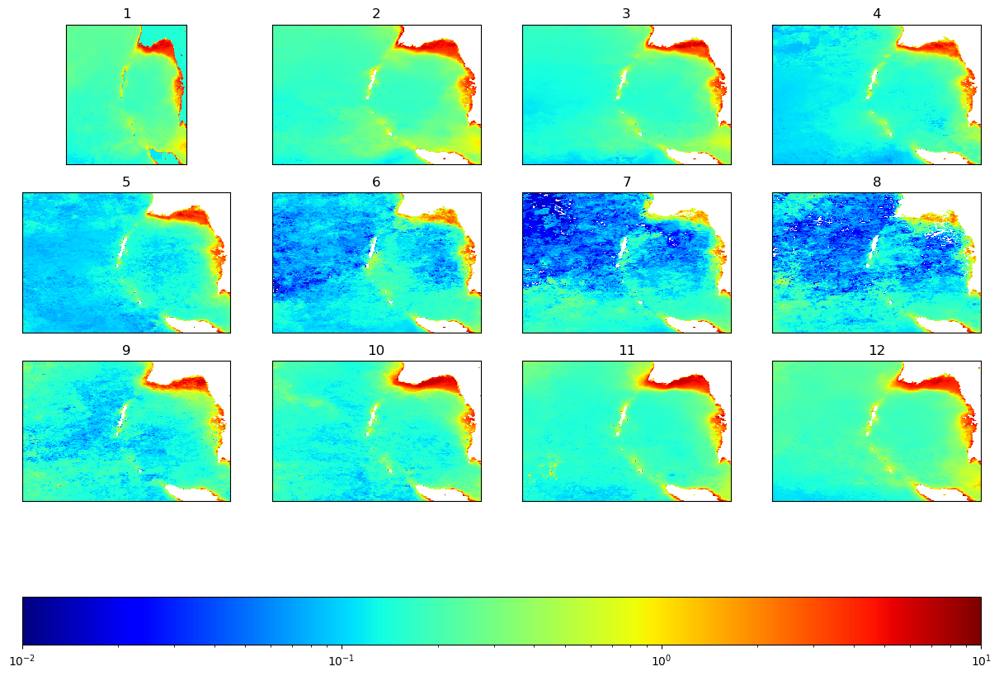

In [52]:
from matplotlib.colors import LogNorm
# chla.MODISA_L3m_CHL_Mo_4km_R2022_0_chlor_a[0].plot(cmap='jet', norm=LogNorm(vmin=0.01, vmax=10))
# # no x,y label and x,y ticks
# plt.xticks([])
# plt.yticks([])
# plt.xlabel('')
# plt.ylabel('')
# make 3*4 subplots with a shared colorbar
fig, axs = plt.subplots(3, 4, figsize=(15, 10), sharex=True, sharey=True)
# plot each month
for i in range(12):
    chla.MODISA_L3m_CHL_Mo_4km_R2022_0_chlor_a[i].plot(ax=axs[i//4, i%4], cmap='jet', norm=LogNorm(vmin=0.01, vmax=10), add_colorbar=False)
    axs[i//4, i%4].set_title(i+1)
    axs[i//4, i%4].set_xticks([])
    axs[i//4, i%4].set_yticks([])
    axs[i//4, i%4].set_xlabel('')
    axs[i//4, i%4].set_ylabel('')
# add colorbar
fig.colorbar(axs[0,0].imshow(chla.MODISA_L3m_CHL_Mo_4km_R2022_0_chlor_a[0],cmap='jet', norm=LogNorm(vmin=0.01, vmax=10)), ax=axs, orientation='horizontal', fraction=.1)
# add title

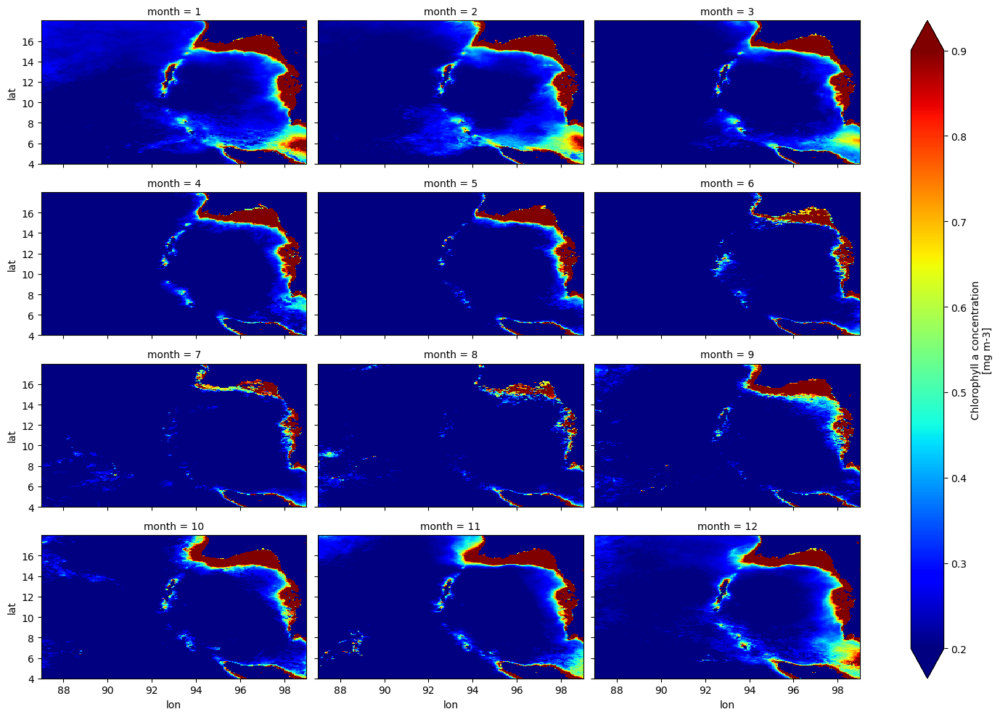

In [46]:
# group by month mean
chla=chla.resample(time='1MS').mean().fillna(0)
# group by month
chla=chla.groupby('time.month').mean('time')
# figure
chla.MODISA_L3m_CHL_Mo_4km_R2022_0_chlor_a.plot(col='month',col_wrap=3,vmin=0.2,vmax=0.9,cmap='jet',figsize=(15,10))

In [ ]:
# yearly mean
chla_y=chla.groupby('time.year').mean('time')
# yearly  values of MODISA_L3m_CHL_Mo_4km_R2022_0_chlor_a mean and plo
df_y = chla_y.to_dataframe()
# only MODISA_L3m_CHL_Mo_4km_R2022_0_chlor_a
df_y=df_y['MODISA_L3m_CHL_Mo_4km_R2022_0_chlor_a']
# reset index
df_y=df_y.reset_index()
# select year and MODISA_L3m_CHL_Mo_4km_R2022_0_chlor_a
df_y=df_y[['year','MODISA_L3m_CHL_Mo_4km_R2022_0_chlor_a']]
df_y


In [ ]:
# monthly mean
chla_m=chla.groupby('time.month').mean('time')
# monthly values of MODISA_L3m_CHL_Mo_4km_R2022_0_chlor_a mean and plo
df_m = chla_m.to_dataframe()
# only MODISA_L3m_CHL_Mo_4km_R2022_0_chlor_a
df_m=df_m['MODISA_L3m_CHL_Mo_4km_R2022_0_chlor_a']
# reset index
df_m=df_m.reset_index()
# select month and MODISA_L3m_CHL_Mo_4km_R2022_0_chlor_a
df_m=df_m[['month','MODISA_L3m_CHL_Mo_4km_R2022_0_chlor_a']]
# group by month and mean
df_m.groupby('month').mean()


In [ ]:
# group by year and mean
df_y.groupby('year').mean()

In [ ]:
climatology_mean = ds.groupby("time.month").mean("time")
climatology_std = ds.groupby("time.month").std("time")
stand_anomalies = xr.apply_ufunc(
    lambda x, m, s: (x - m) / s,
    ds.groupby("time.month"),
    climatology_mean,
    climatology_std,
)

stand_anomalies.mean("location").to_dataframe()[["tmin", "tmax"]].plot()

In [19]:
import geopandas as gpd
import xarray as xr
import glob, os
import regionmask

In [43]:
import salem

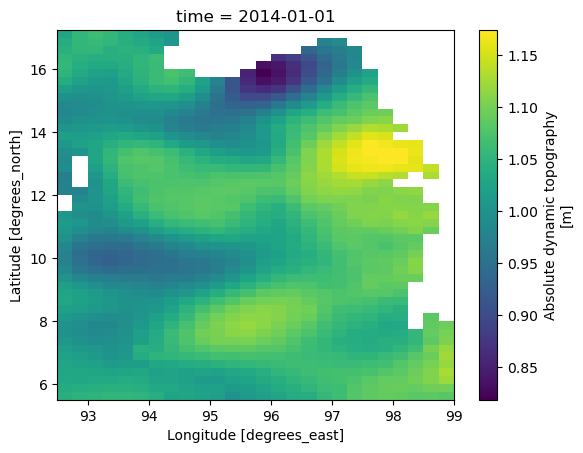

In [54]:
gedf=gpd.read_file(r"D:\my works\andaman\data\shapefile\iho\new.shp")
ds=salem.open_xr_dataset(r'D:\my works\andaman\data\nc\eddy\2014\dt_global_twosat_phy_l4_20140101_vDT2021.nc')
# Create a mask
ds1=ds.salem.subset(shape=gedf)
ds1['adt'].plot()

In [4]:
import salem
gedf=gpd.read_file(r"D:\my works\bloom\data\World_EEZ_v11_20191118\US_GULF_eez_FL_MS_L_T.shp")
# data folder folder
folders = r"D:\my works\bloom\data\nppcropped"
output = r"D:\my works\bloom\data\npp"
# read all nc files in subfolders
ncfiles = glob.glob(folders + '/**/*.nc', recursive=True)
# read all nc files in subfolders
for i in ncfiles:
    name=i.split('\\')[-1]
    ds=xr.open_dataset(i)
    # Create a mask
    ds_masked=ds.salem.subset(shape=gedf)
    ds_masked.to_netcdf(output+'/'+name)
    del ds,ds_masked
print('done')

done


In [55]:
gedf=gpd.read_file(r"D:\my works\andaman\data\shapefile\iho\new.shp")
# data folder folder
folders = "D:/my works/andaman/data/nc/eddy"
output = "D:/my works/andaman/data/nc/eddy_andaman"
# read all nc files in subfolders
ncfiles = glob.glob(folders + '/**/*.nc', recursive=True)
# read all nc files in subfolders
for i in ncfiles:
    name=i.split('\\')[-1].split('_')[5]
    ds=xr.open_dataset(i)
    # Create a mask
    ds_masked=ds.salem.subset(shape=gedf)
    ds_masked.to_netcdf(output+'/'+name+'.nc')
    del ds,ds_masked
print('done')

done


In [ ]:
gedf=gpd.read_file(r"D:\my works\andaman\data\shapefile\iho\bob.shp")
# data folder folder
folders = "D:/my works/andaman/data/nc/eddy_bob"
output = "D:/my works/andaman/data/nc/eddy_BayofBengal"
# read all nc files in subfolders
ncfiles = glob.glob(folders + '/**/*.nc', recursive=True)
# read all nc files in subfolders
for i in ncfiles:
    name=i.split('\\')[-1].split('_')[5]
    ds=xr.open_dataset(i)
    # Create a mask
    ds_masked=ds.salem.subset(shape=gedf)
    ds_masked.to_netcdf(output+'/'+name+'.nc')
    del ds,ds_masked
print('done')

: 

: 

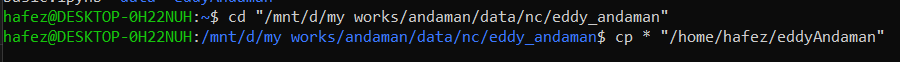

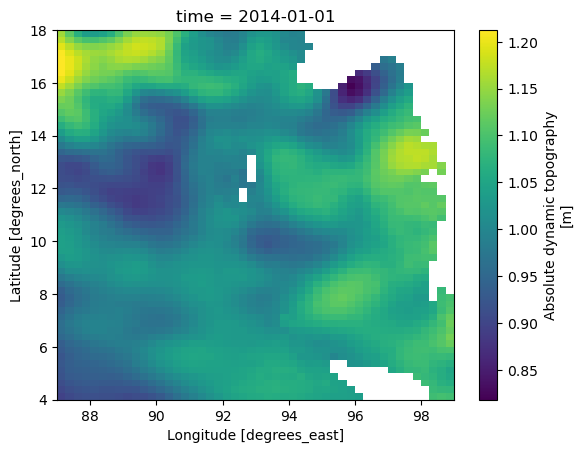

In [37]:
#ds=xr.open_dataset(r'D:\my works\andaman\data\nc\eddy\2014\dt_global_twosat_phy_l4_20140101_vDT2021.nc')
ds_masked['adt'].plot()